## Example of a Generative Adversarial Network (GAN)
(Post on https://medium.com/ai-society)

Note: Had an issue with conda where the requests library was preventing installation of pytorch.

Ran the following command, then re-ran pytorch installation line and it worked.
> conda update --force conda

In [1]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
from utils import Logger  # Extra code provided by article author to give some extra visualisations

## Going to be using MNIST data for this: The GAN generator will be tasked with generating new handwritten digits to fool the discriminator

Apparently there are a bunch of preprocessing steps that need to be done for GAN training. An important one is to normalise the images so that they're in the range of [-1, 1]. More info here: https://github.com/soumith/ganhacks

In [19]:
# Loading the data and storing it in an appropriate place

# This handles the normalisation of the images from [0, 255] to [-1, 1] which is better for GAN training
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.5,), (0.5,))
        ])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)

# Load data
data = mnist_data()

# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)

# Num batches
num_batches = len(data_loader)

## Now define the discriminator network as a subclass of a torch neural network class

Note that the input is flattened first, so it's 28x28=784 pixels long.<br>
Also, each layer of the network is followed by a leaky ReLU and dropout layer to minimise overfitting.<br>
The output is from a sigmoid function which ensured the output values are in the range [0, 1].

In [20]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x


discriminator = DiscriminatorNet()

## Extra functions to flatten images into 1D vectors and vice versa

In [4]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

## Now define the generator network as a subclass of torch neural network class

Each layer in this network will be followed by a leaky ReLU.<br>
Also, the output layer will by tanh to ensure the outputs are in the range [-1, 1].

In [6]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x


generator = GeneratorNet()

## Need a function to provide random noise as this is the step between the latent space and the generator that provides variation

In [7]:
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

## Now define the specifics of the optimisation process.

We'll use ADAM as the optimiser and Stochastic gradient descent as it's been shown to work well with this kind of work

In [21]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)  # lr is the learning rate. Again, this is from trial and error
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

## Define generator loss function as binary cross entropy

In [22]:
loss = nn.BCELoss()

## Define functions to produce labeles of real or fake en masse

In [10]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

## Train the discriminator using the ground truth labels of data that we know is real or fake

In [12]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

## Train the generator using the outputs of the discriminator

In [15]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    
    # Update weights with gradients
    optimizer.step()
    
    # Return error
    return error

## Testing

In [23]:
# Define the size of the subset that will be used for visualisations

num_test_samples = 16
test_noise = noise(num_test_samples)

## Training

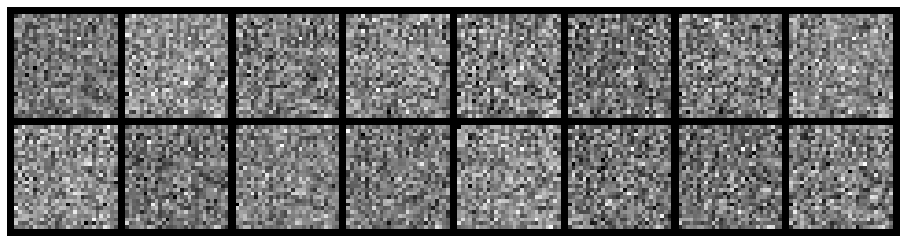

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3914, Generator Loss: 0.7062
D(x): 0.4913, D(G(z)): 0.4935


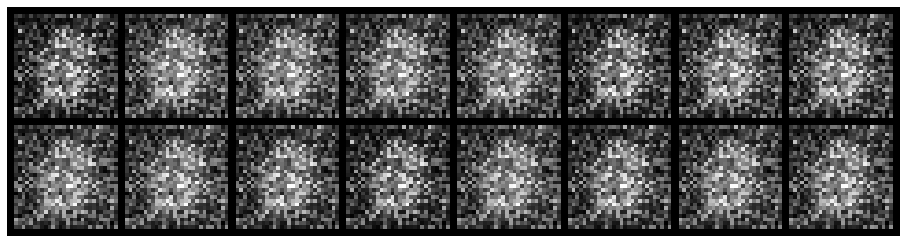

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 1.3856, Generator Loss: 1.2954
D(x): 0.6188, D(G(z)): 0.5048


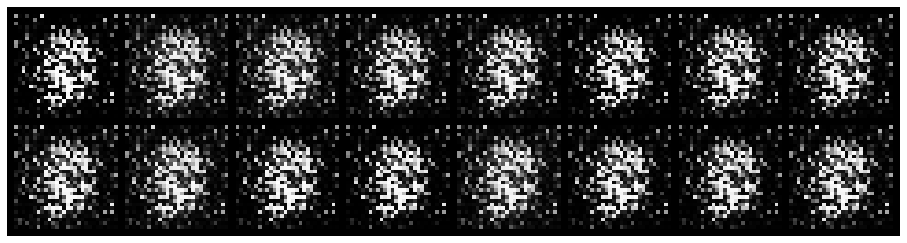

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.7831, Generator Loss: 2.7288
D(x): 0.6724, D(G(z)): 0.2516


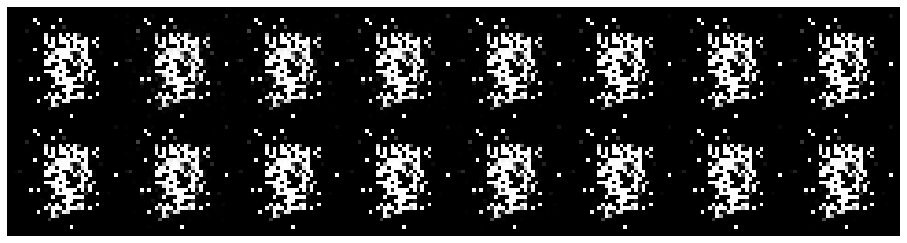

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0409, Generator Loss: 8.0330
D(x): 0.9920, D(G(z)): 0.0237


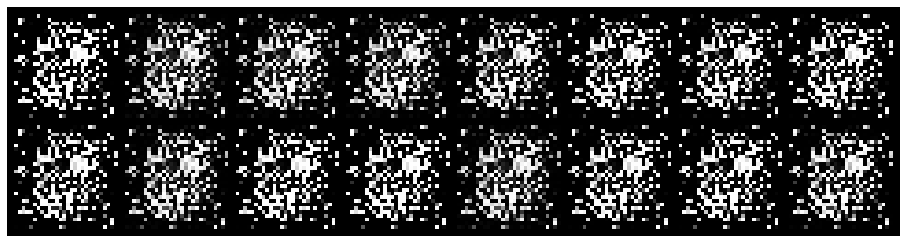

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.0544, Generator Loss: 7.4908
D(x): 0.9711, D(G(z)): 0.0156


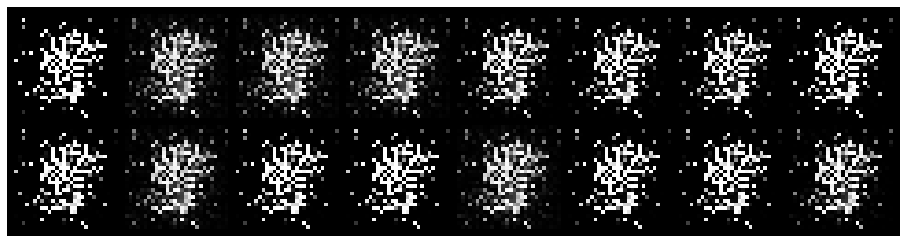

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.3030, Generator Loss: 5.8736
D(x): 0.9348, D(G(z)): 0.1146


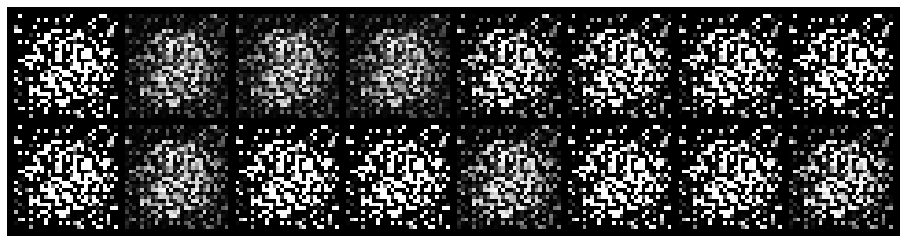

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.3524, Generator Loss: 5.2833
D(x): 0.8522, D(G(z)): 0.1291


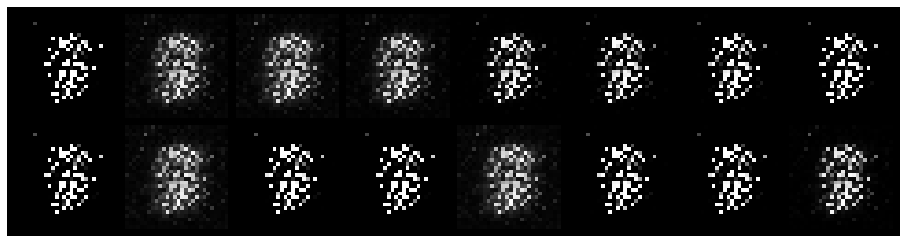

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.6041, Generator Loss: 13.5961
D(x): 0.8828, D(G(z)): 0.1342


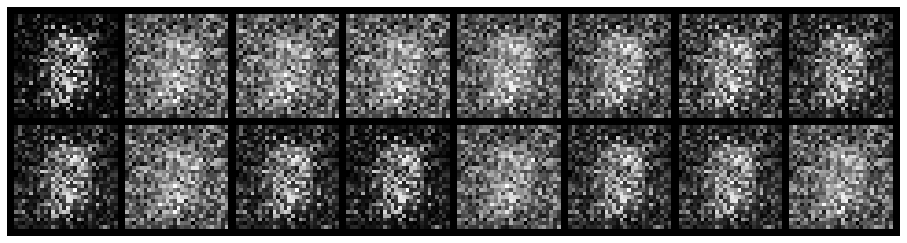

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.4723, Generator Loss: 3.9562
D(x): 0.8887, D(G(z)): 0.1928


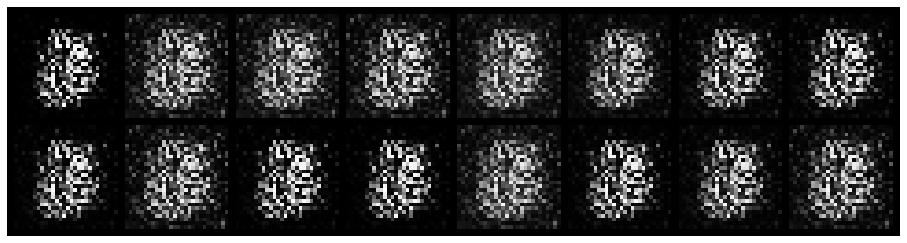

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.4711, Generator Loss: 3.8083
D(x): 0.8132, D(G(z)): 0.1531


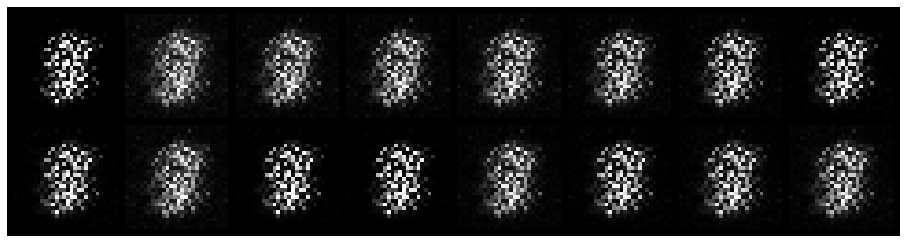

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.9119, Generator Loss: 4.1378
D(x): 0.7612, D(G(z)): 0.2798


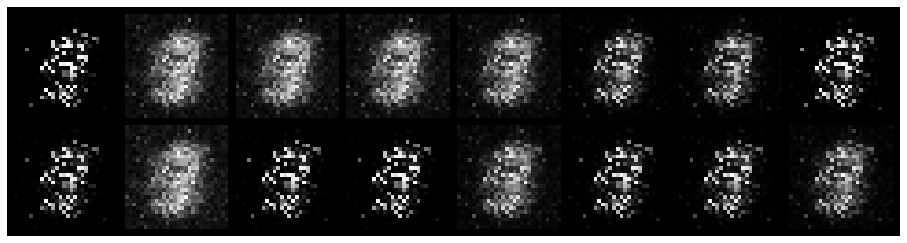

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.1819, Generator Loss: 1.6895
D(x): 0.6379, D(G(z)): 0.3927


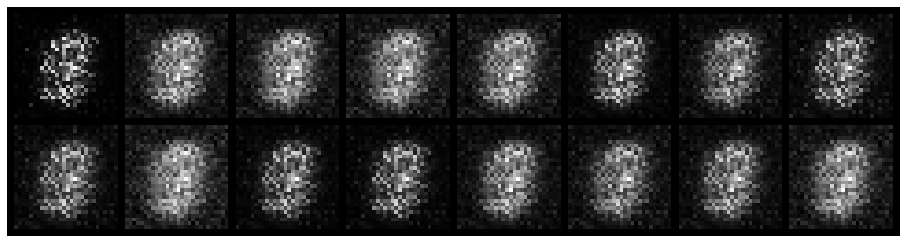

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.0050, Generator Loss: 2.0507
D(x): 0.6973, D(G(z)): 0.3218


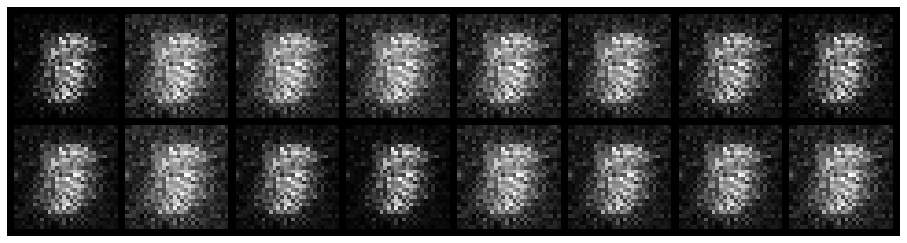

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 0.4400, Generator Loss: 3.3647
D(x): 0.8178, D(G(z)): 0.1143


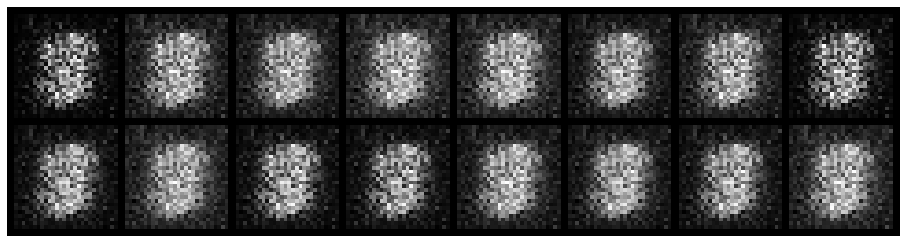

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.8687, Generator Loss: 2.6212
D(x): 0.7949, D(G(z)): 0.3489


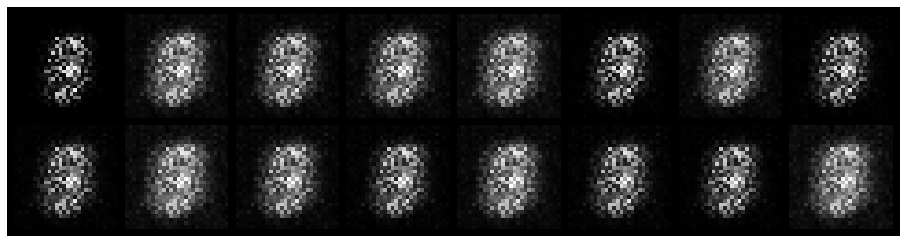

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.9086, Generator Loss: 1.3573
D(x): 0.7749, D(G(z)): 0.4189


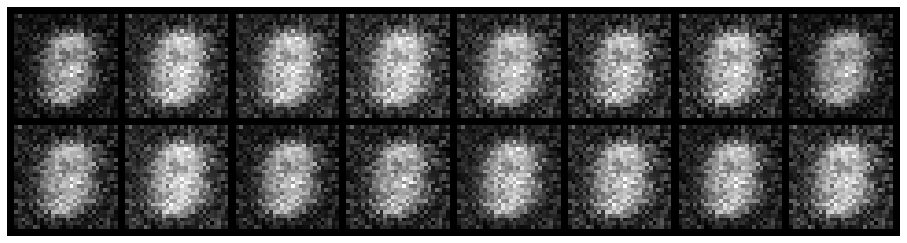

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.2948, Generator Loss: 3.7291
D(x): 0.8869, D(G(z)): 0.1221


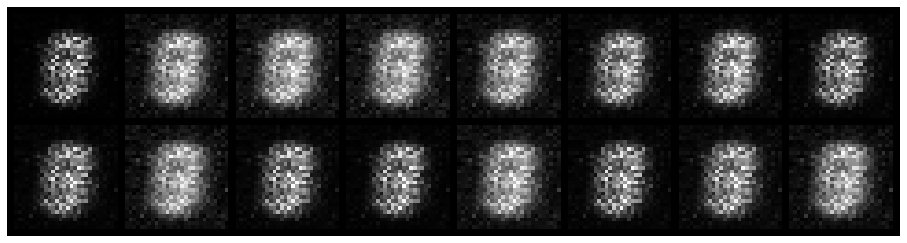

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 1.4062, Generator Loss: 0.7767
D(x): 0.5700, D(G(z)): 0.3723


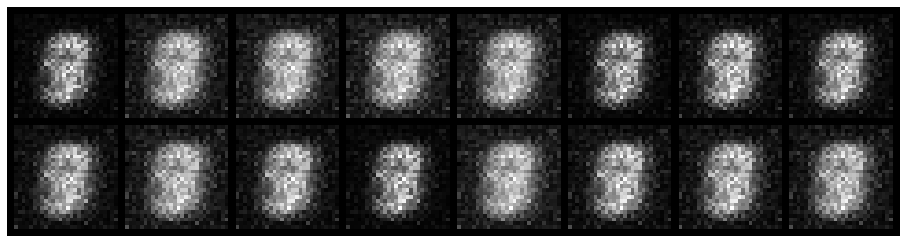

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.1505, Generator Loss: 1.3142
D(x): 0.6676, D(G(z)): 0.3215


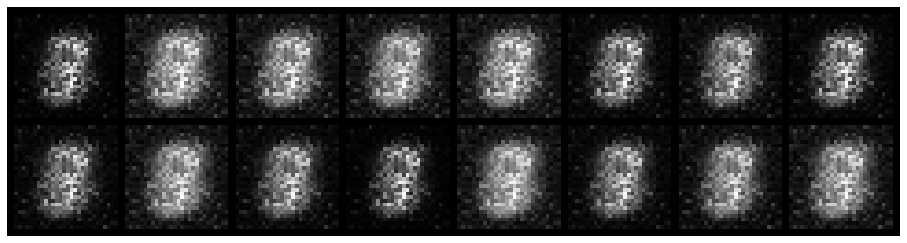

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.6821, Generator Loss: 5.5565
D(x): 0.8846, D(G(z)): 0.2221


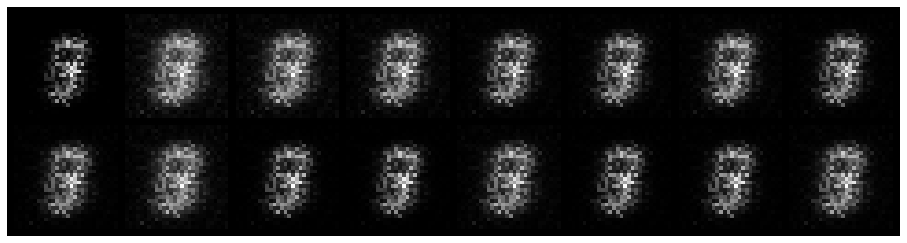

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 1.1850, Generator Loss: 1.9399
D(x): 0.6673, D(G(z)): 0.2491


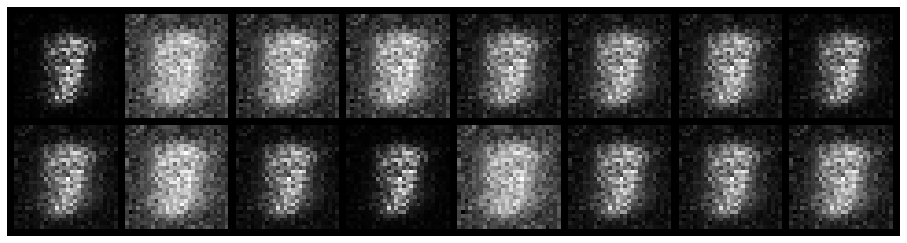

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.5201, Generator Loss: 2.3663
D(x): 0.8893, D(G(z)): 0.2313


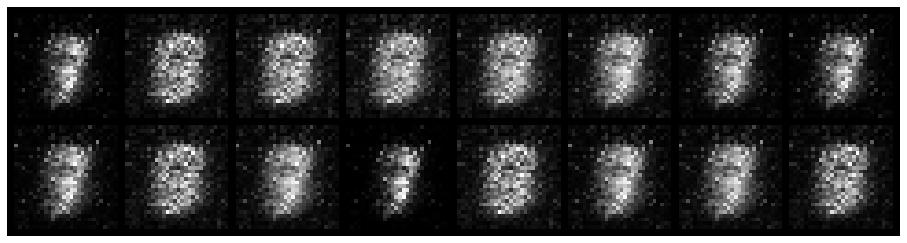

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.3235, Generator Loss: 3.1676
D(x): 0.8912, D(G(z)): 0.1049


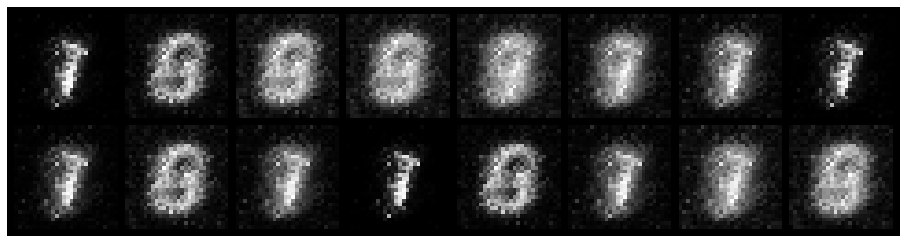

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.7710, Generator Loss: 1.7821
D(x): 0.7964, D(G(z)): 0.2593


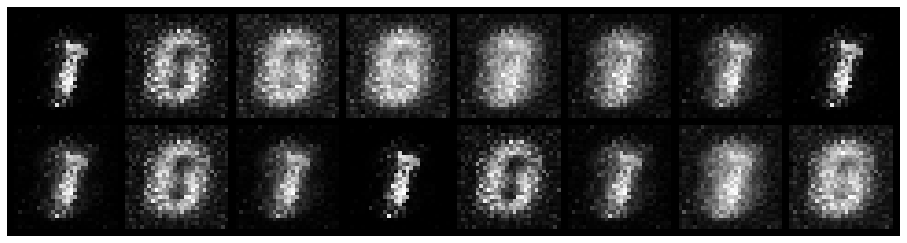

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.2418, Generator Loss: 3.4689
D(x): 0.9477, D(G(z)): 0.1276


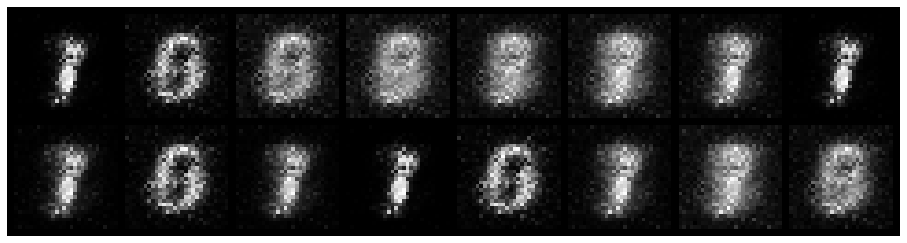

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.4506, Generator Loss: 2.6294
D(x): 0.8713, D(G(z)): 0.1527


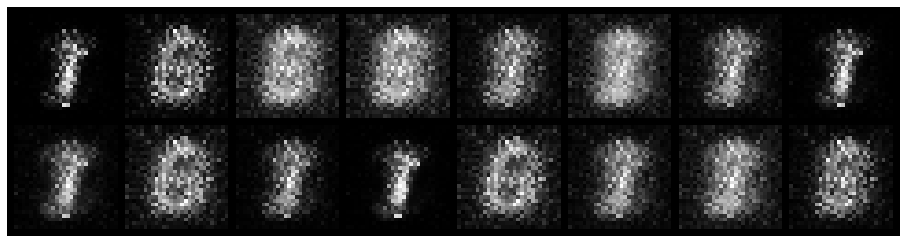

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.2307, Generator Loss: 3.4897
D(x): 0.9347, D(G(z)): 0.0658


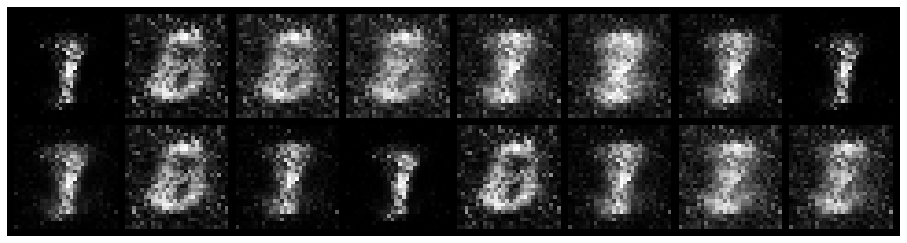

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3767, Generator Loss: 4.7811
D(x): 0.8699, D(G(z)): 0.0261


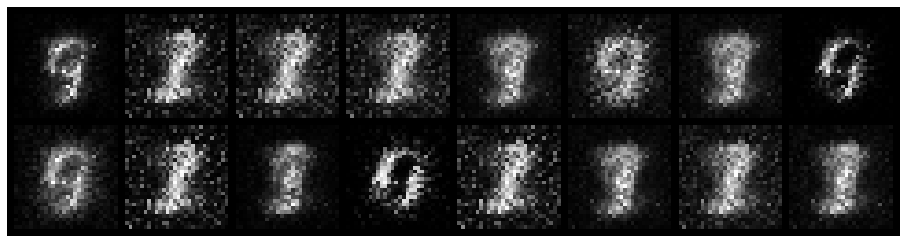

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.3143, Generator Loss: 4.3883
D(x): 0.9260, D(G(z)): 0.1455


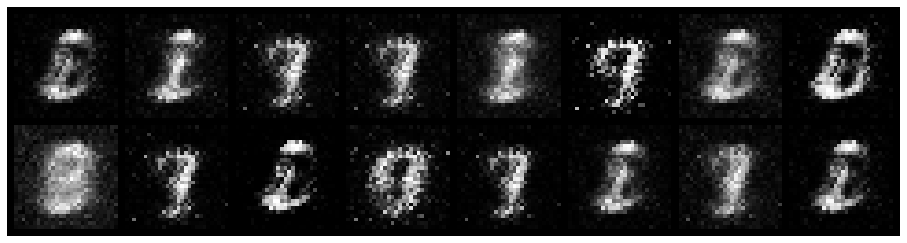

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.3496, Generator Loss: 2.5102
D(x): 0.8795, D(G(z)): 0.1181


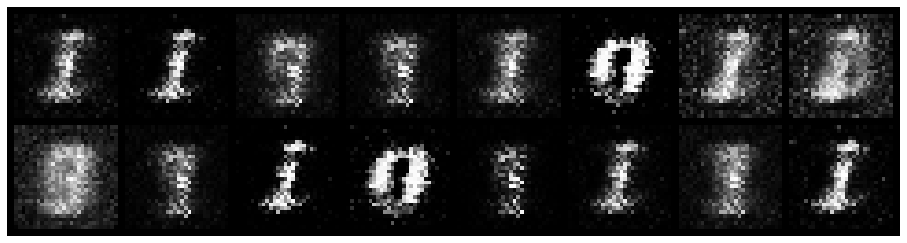

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.1276, Generator Loss: 3.3333
D(x): 0.9833, D(G(z)): 0.0882


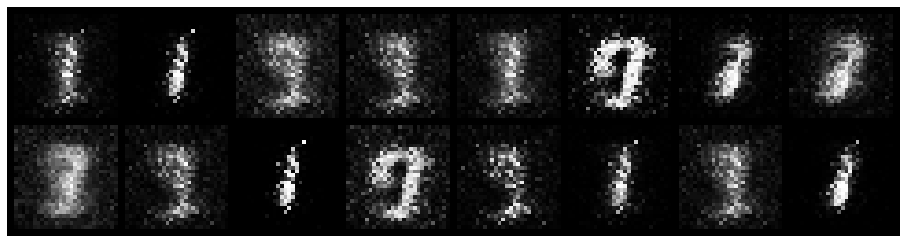

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.3945, Generator Loss: 4.5407
D(x): 0.8717, D(G(z)): 0.0935


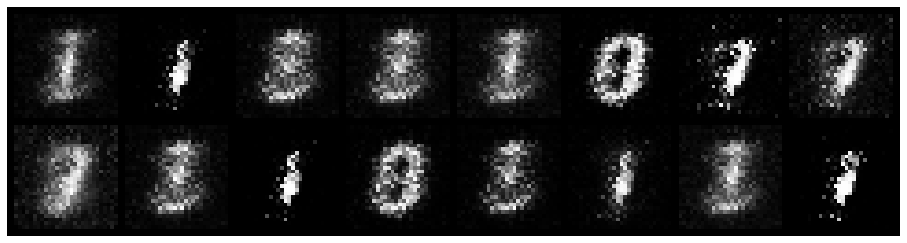

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.3526, Generator Loss: 3.2965
D(x): 0.9298, D(G(z)): 0.1539


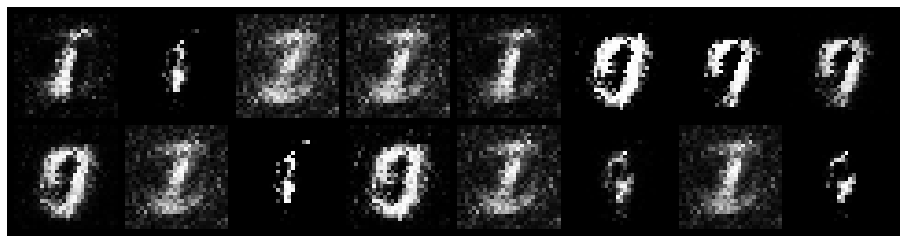

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.4019, Generator Loss: 3.0098
D(x): 0.9026, D(G(z)): 0.1675


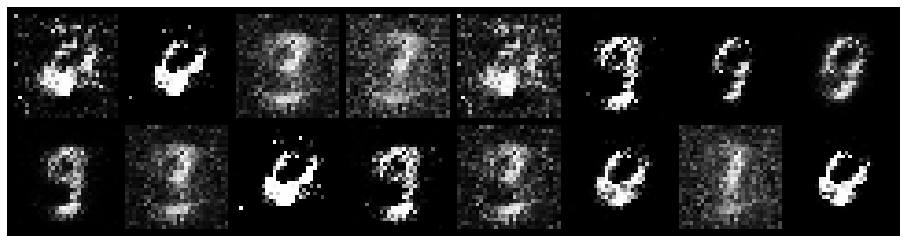

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.3945, Generator Loss: 4.1895
D(x): 0.8916, D(G(z)): 0.1210


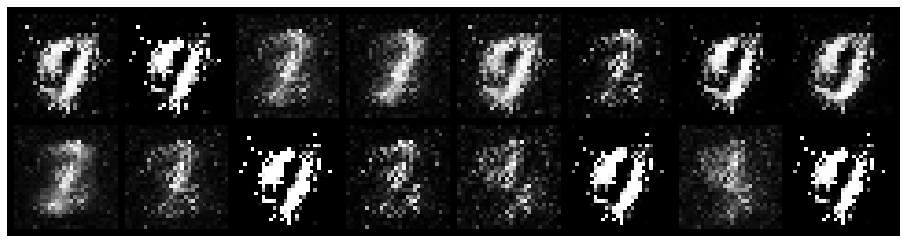

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.1509, Generator Loss: 4.6400
D(x): 0.9467, D(G(z)): 0.0533


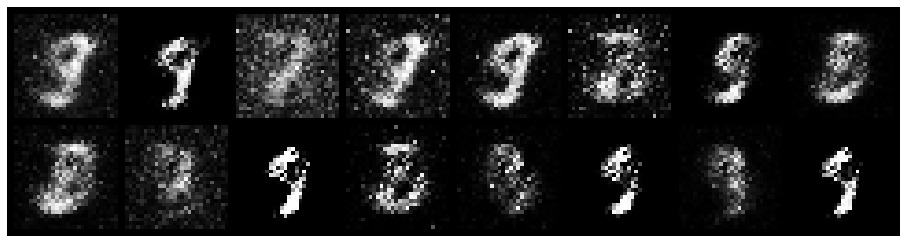

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4050, Generator Loss: 3.4693
D(x): 0.8510, D(G(z)): 0.1075


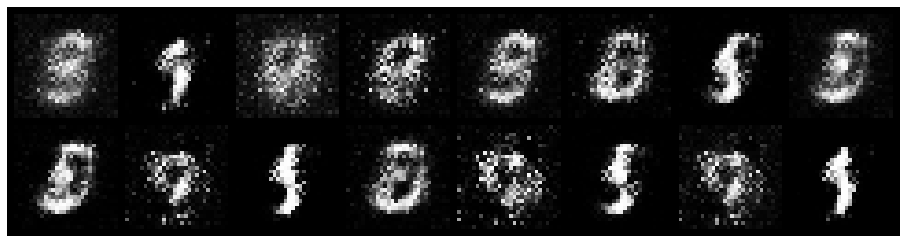

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.3486, Generator Loss: 3.9810
D(x): 0.8648, D(G(z)): 0.0984


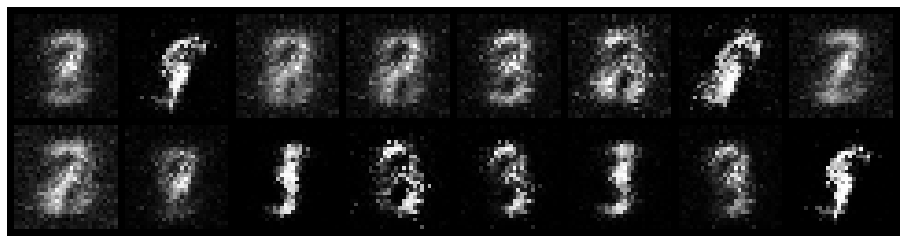

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.5927, Generator Loss: 2.2095
D(x): 0.7892, D(G(z)): 0.1093


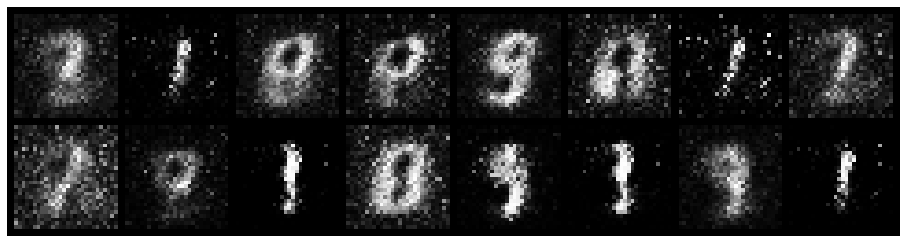

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.4095, Generator Loss: 3.6122
D(x): 0.8152, D(G(z)): 0.0516


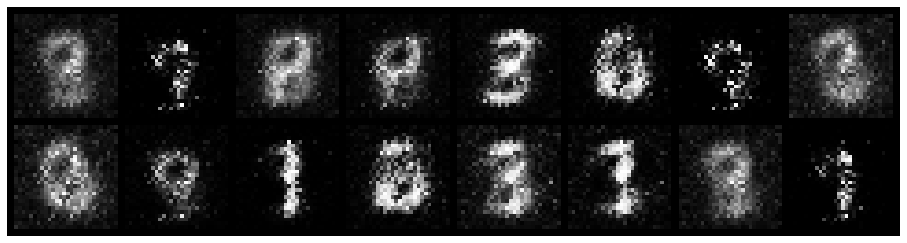

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.3626, Generator Loss: 3.9995
D(x): 0.8854, D(G(z)): 0.0980


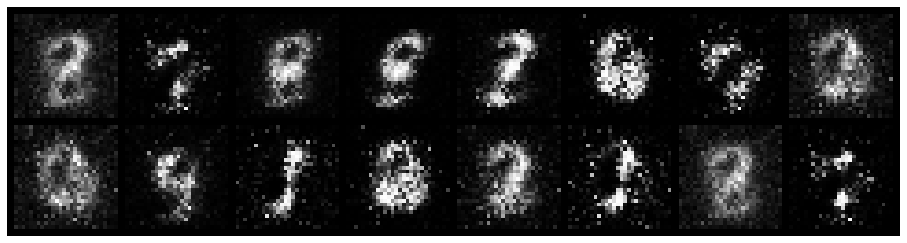

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.3656, Generator Loss: 2.9567
D(x): 0.8954, D(G(z)): 0.1267


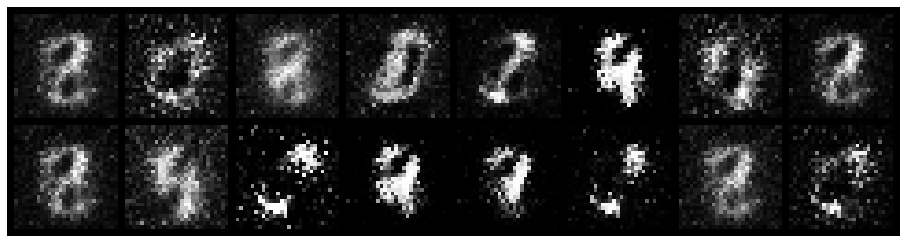

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.4421, Generator Loss: 3.5885
D(x): 0.8355, D(G(z)): 0.0981


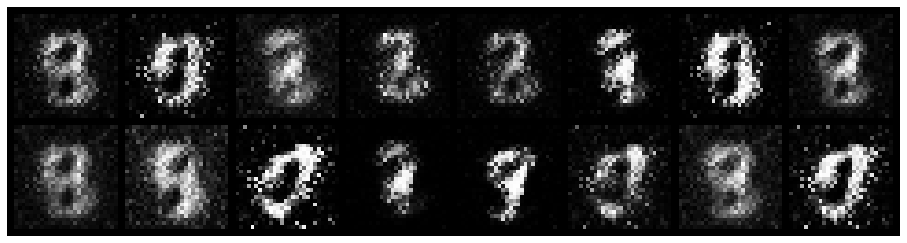

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.6146, Generator Loss: 3.0122
D(x): 0.8682, D(G(z)): 0.2395


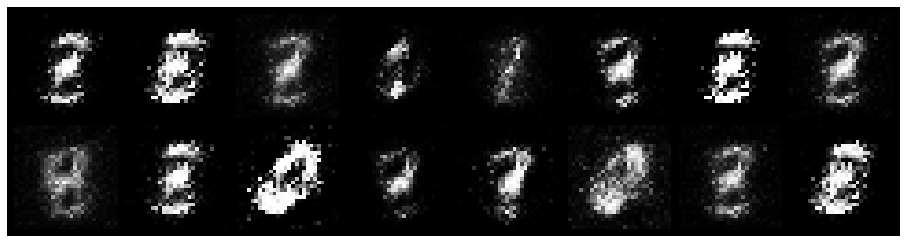

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.6120, Generator Loss: 2.9206
D(x): 0.8187, D(G(z)): 0.1421


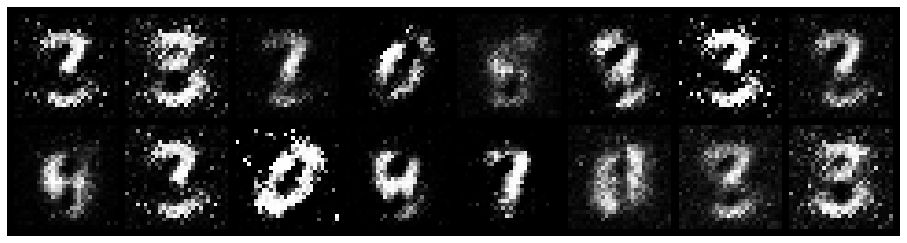

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.4968, Generator Loss: 3.0584
D(x): 0.8350, D(G(z)): 0.1631


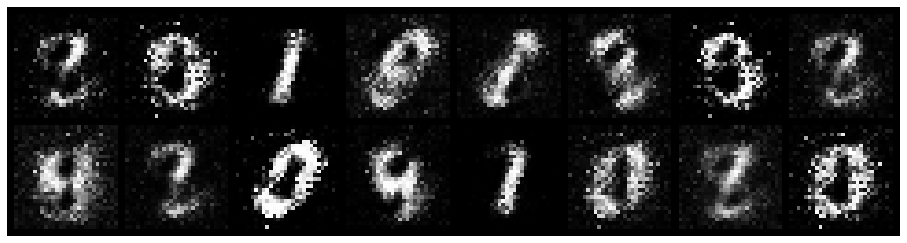

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.3435, Generator Loss: 3.2926
D(x): 0.8863, D(G(z)): 0.0971


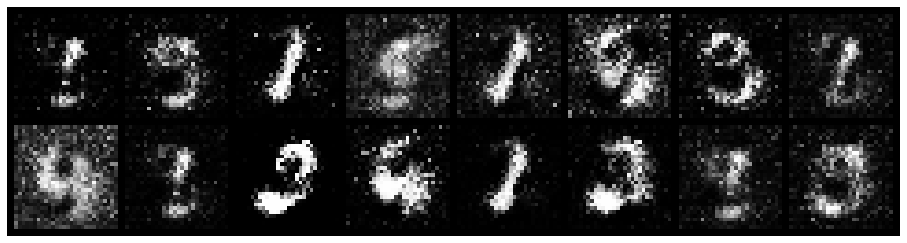

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.4250, Generator Loss: 2.8056
D(x): 0.8720, D(G(z)): 0.1809


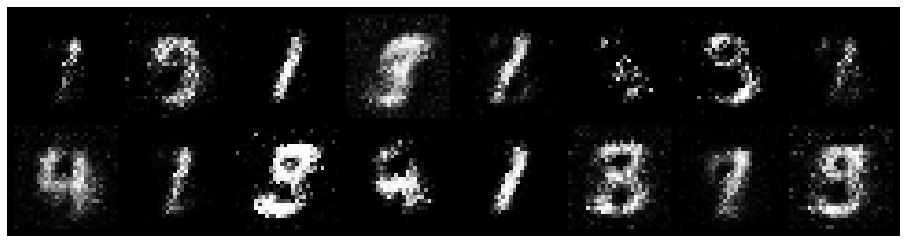

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.7793, Generator Loss: 2.9292
D(x): 0.7409, D(G(z)): 0.1804


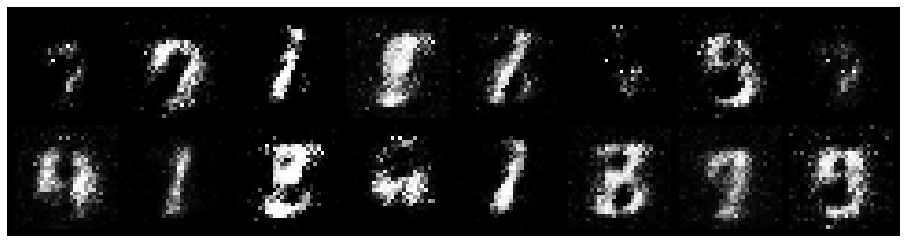

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.5922, Generator Loss: 3.5171
D(x): 0.7938, D(G(z)): 0.1166


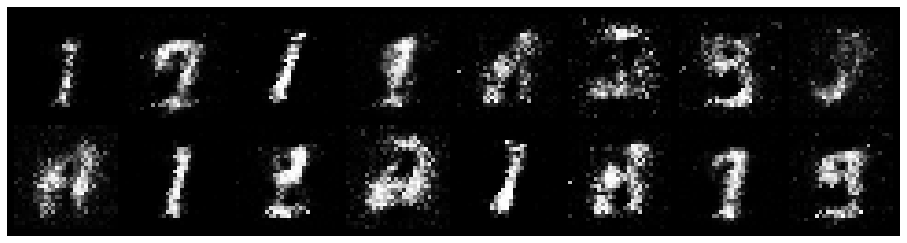

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.3888, Generator Loss: 2.5091
D(x): 0.9002, D(G(z)): 0.1776


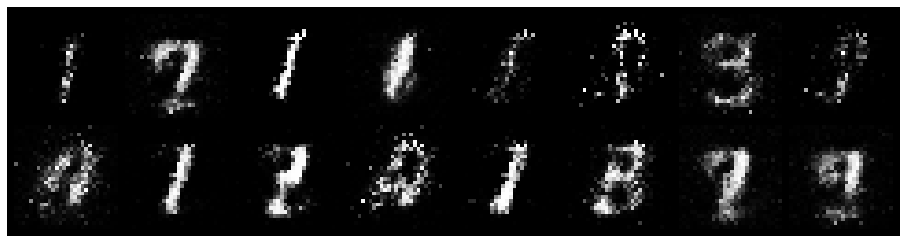

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.7244, Generator Loss: 1.8747
D(x): 0.7934, D(G(z)): 0.2084


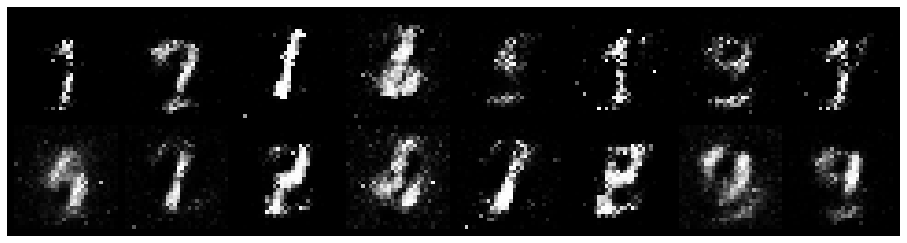

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.3635, Generator Loss: 2.8515
D(x): 0.8836, D(G(z)): 0.1504


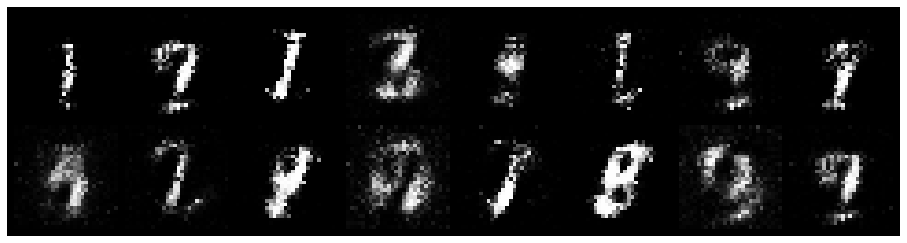

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.4378, Generator Loss: 2.9893
D(x): 0.8356, D(G(z)): 0.1315


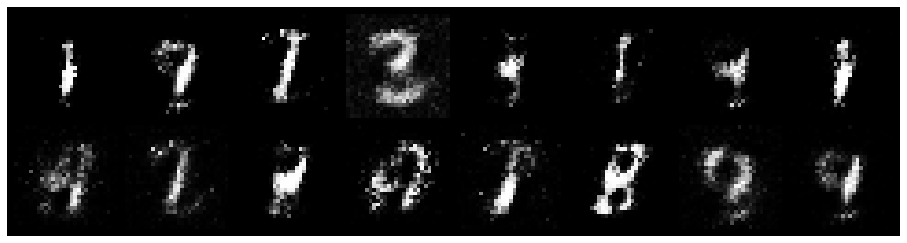

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.5758, Generator Loss: 2.6278
D(x): 0.8426, D(G(z)): 0.2204


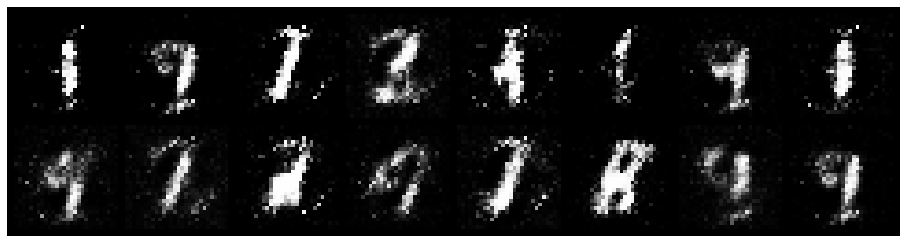

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.4993, Generator Loss: 3.1022
D(x): 0.8520, D(G(z)): 0.1916


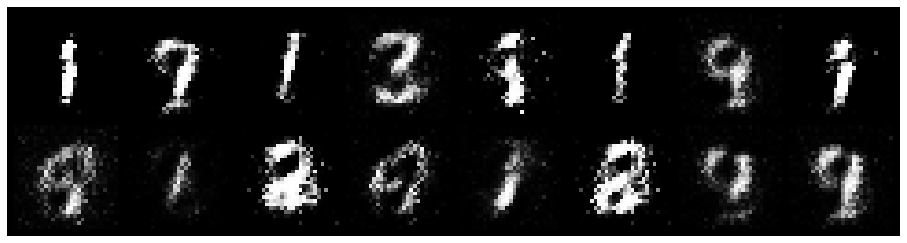

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.5258, Generator Loss: 2.4633
D(x): 0.8397, D(G(z)): 0.2179


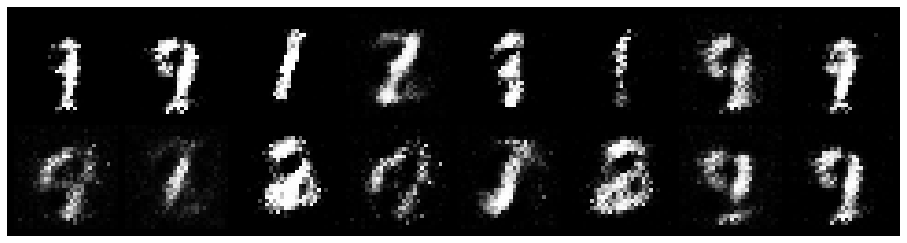

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.6395, Generator Loss: 2.5345
D(x): 0.7989, D(G(z)): 0.2002


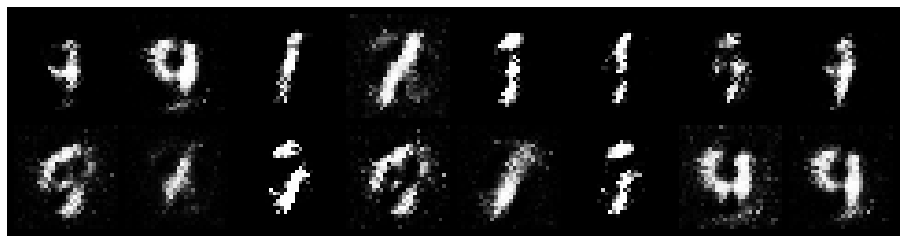

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.6614, Generator Loss: 2.3031
D(x): 0.7484, D(G(z)): 0.1289


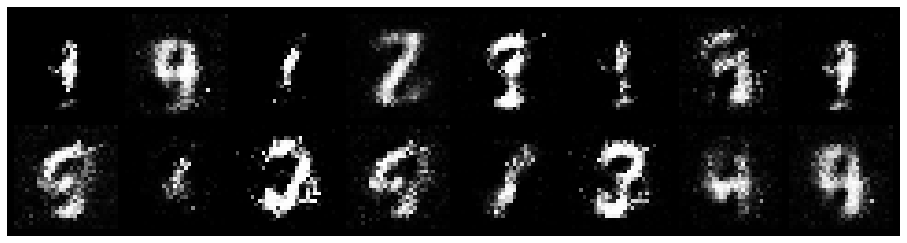

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.6702, Generator Loss: 2.7583
D(x): 0.7247, D(G(z)): 0.1235


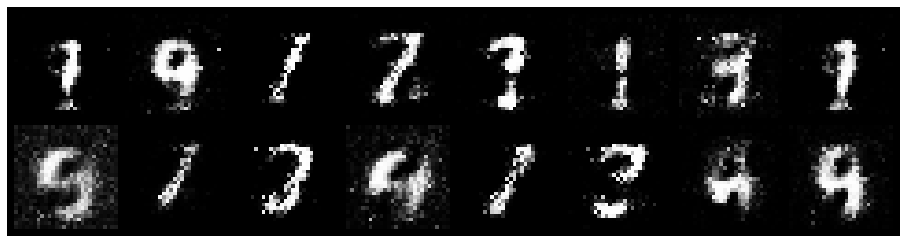

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 1.0383, Generator Loss: 1.5765
D(x): 0.6219, D(G(z)): 0.2498


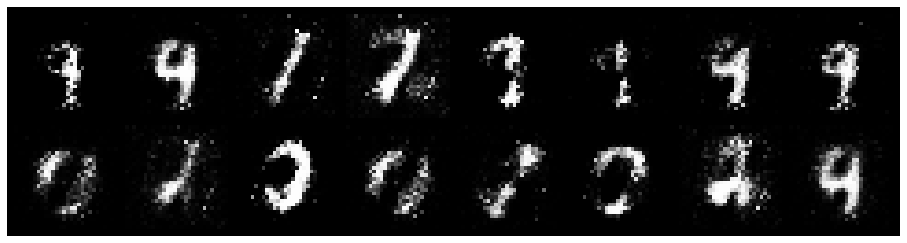

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.5059, Generator Loss: 2.5847
D(x): 0.8421, D(G(z)): 0.1639


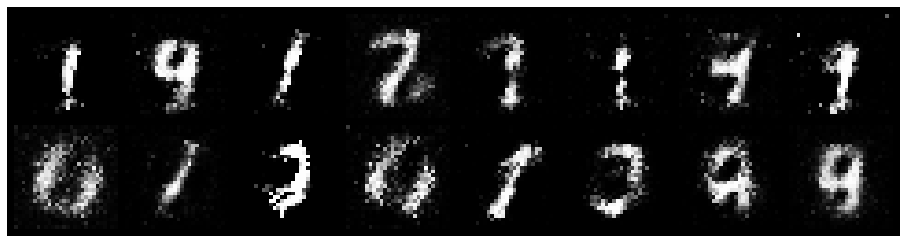

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.4398, Generator Loss: 2.9840
D(x): 0.8029, D(G(z)): 0.0971


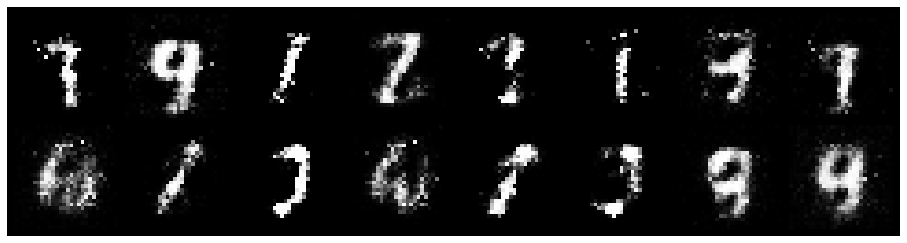

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.6569, Generator Loss: 3.1382
D(x): 0.8094, D(G(z)): 0.2074


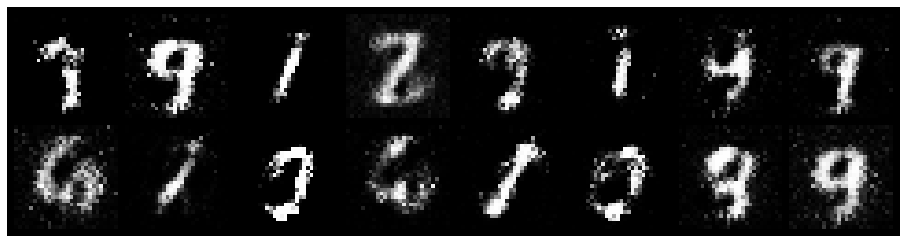

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.7571, Generator Loss: 2.1779
D(x): 0.8632, D(G(z)): 0.3117


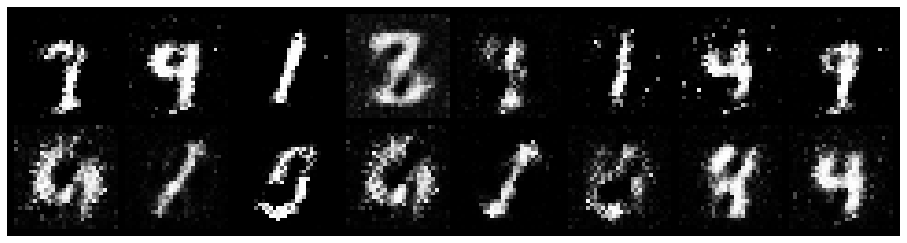

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.4907, Generator Loss: 3.0282
D(x): 0.7910, D(G(z)): 0.1049


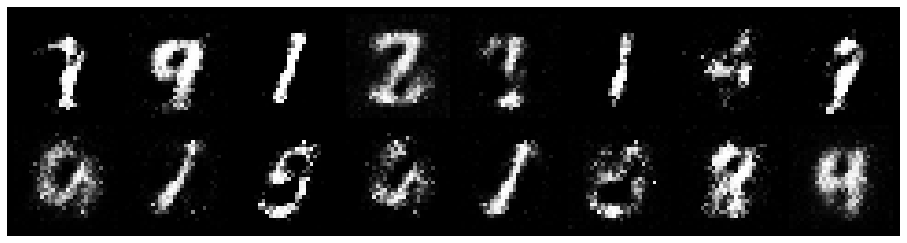

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.5644, Generator Loss: 1.7414
D(x): 0.8519, D(G(z)): 0.2293


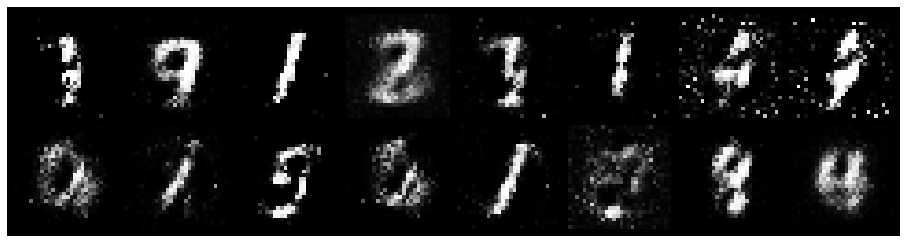

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.7797, Generator Loss: 2.5526
D(x): 0.7395, D(G(z)): 0.1841


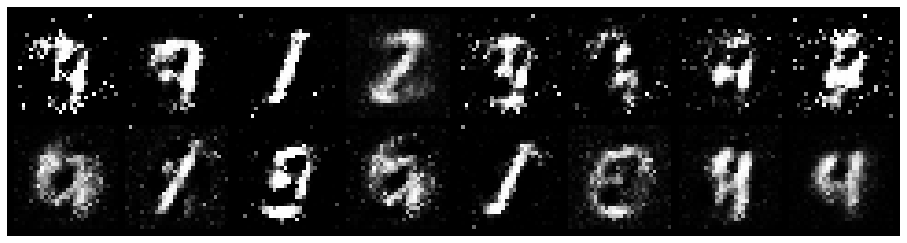

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.5799, Generator Loss: 2.0361
D(x): 0.8492, D(G(z)): 0.2600


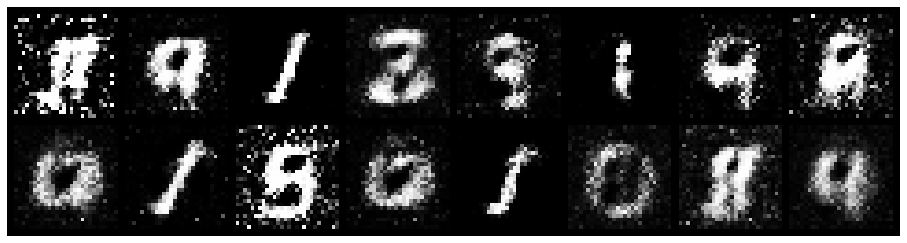

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 1.1997, Generator Loss: 1.5268
D(x): 0.6821, D(G(z)): 0.3792


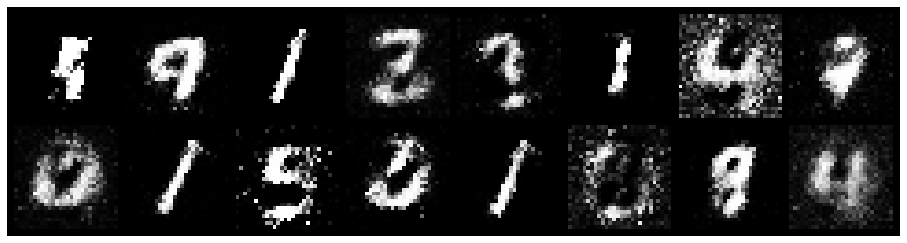

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.8080, Generator Loss: 2.1676
D(x): 0.6912, D(G(z)): 0.2029


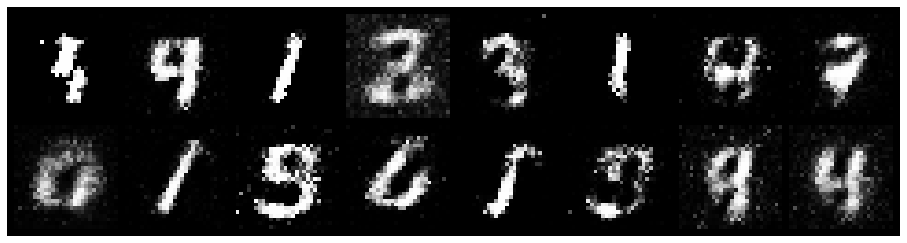

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.6008, Generator Loss: 2.9669
D(x): 0.8012, D(G(z)): 0.1595


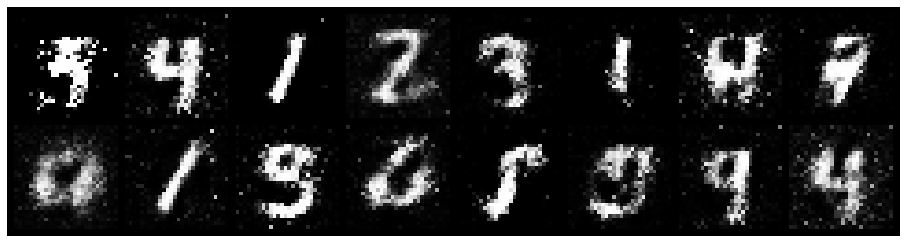

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.6107, Generator Loss: 2.2197
D(x): 0.7801, D(G(z)): 0.1605


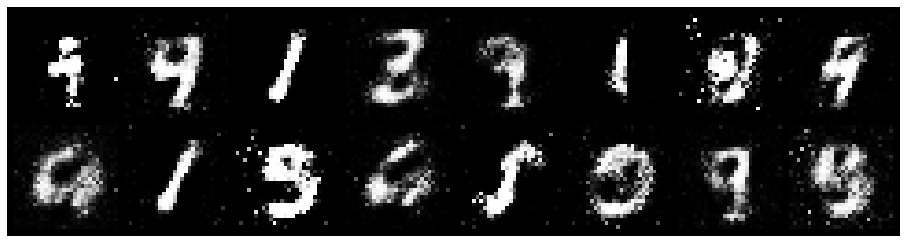

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.8198, Generator Loss: 1.9957
D(x): 0.7128, D(G(z)): 0.2430


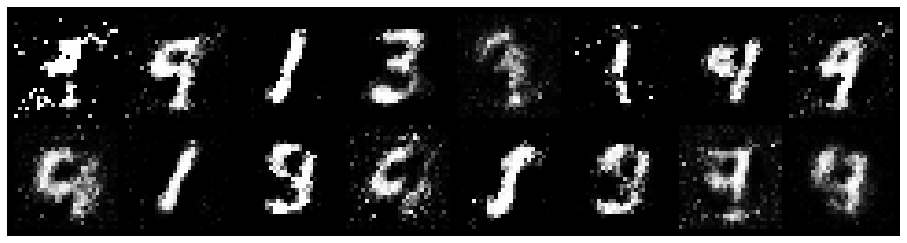

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.6615, Generator Loss: 1.8097
D(x): 0.7927, D(G(z)): 0.2757


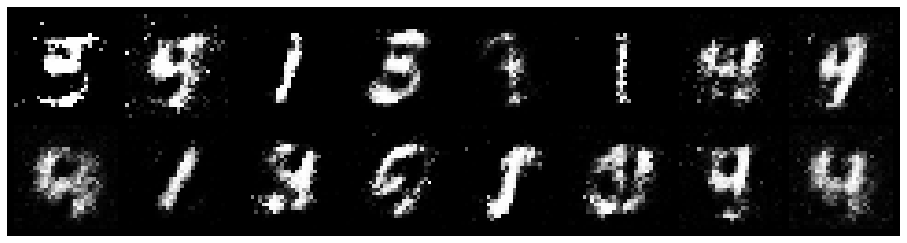

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.5119, Generator Loss: 2.1901
D(x): 0.8607, D(G(z)): 0.1893


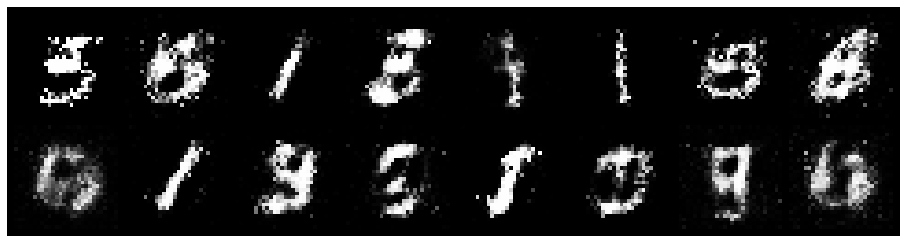

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.5913, Generator Loss: 1.6667
D(x): 0.7861, D(G(z)): 0.2124


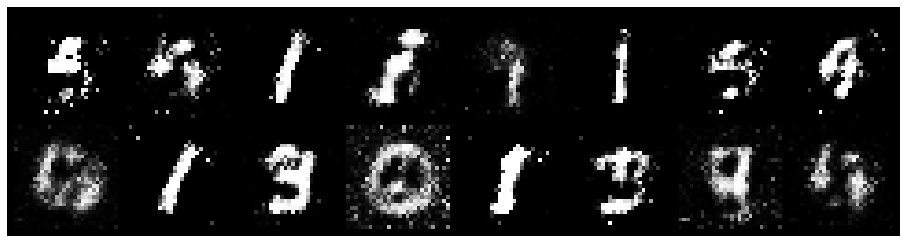

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.7405, Generator Loss: 1.9644
D(x): 0.7275, D(G(z)): 0.2276


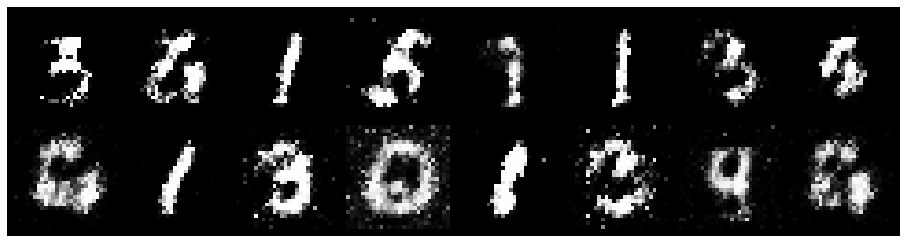

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.8541, Generator Loss: 1.7873
D(x): 0.6913, D(G(z)): 0.2582


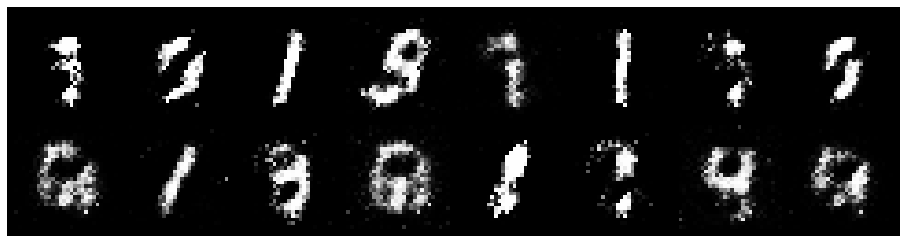

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.8110, Generator Loss: 1.7701
D(x): 0.7406, D(G(z)): 0.2911


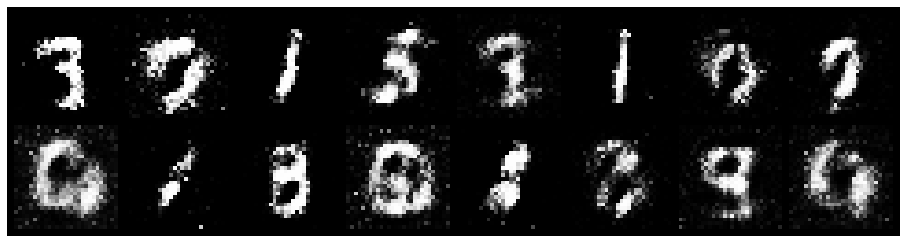

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.7948, Generator Loss: 1.9633
D(x): 0.7031, D(G(z)): 0.2265


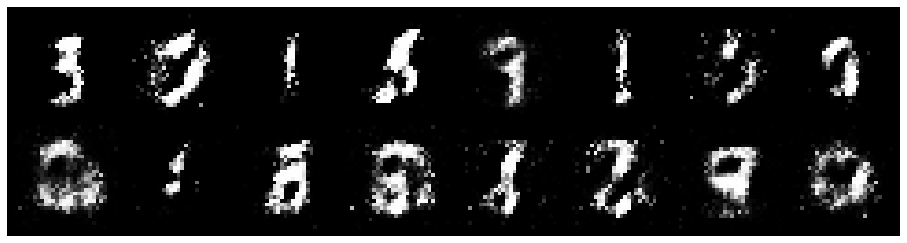

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.8509, Generator Loss: 1.3704
D(x): 0.7297, D(G(z)): 0.3076


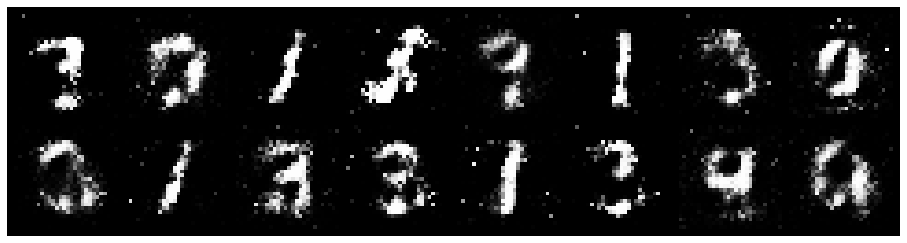

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.8301, Generator Loss: 1.7085
D(x): 0.8499, D(G(z)): 0.3595


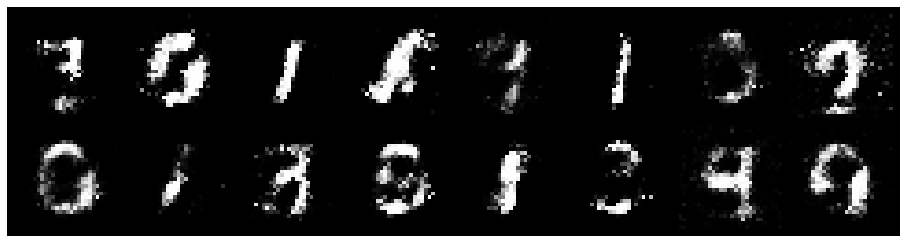

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.8583, Generator Loss: 2.0397
D(x): 0.7185, D(G(z)): 0.2411


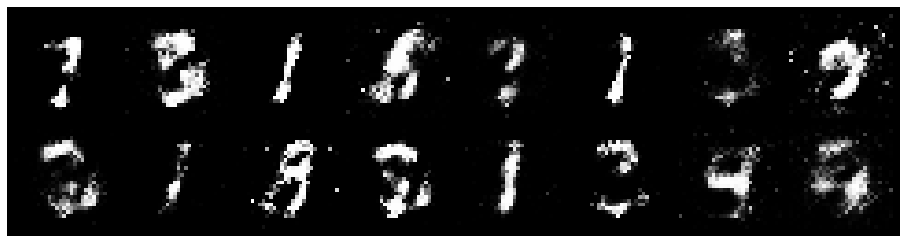

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.8073, Generator Loss: 2.3568
D(x): 0.8085, D(G(z)): 0.2923


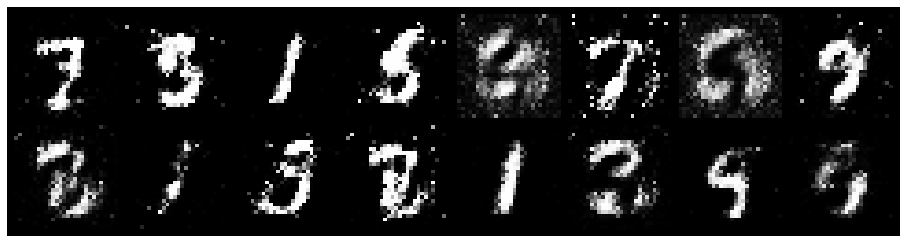

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.8282, Generator Loss: 1.9825
D(x): 0.6442, D(G(z)): 0.1749


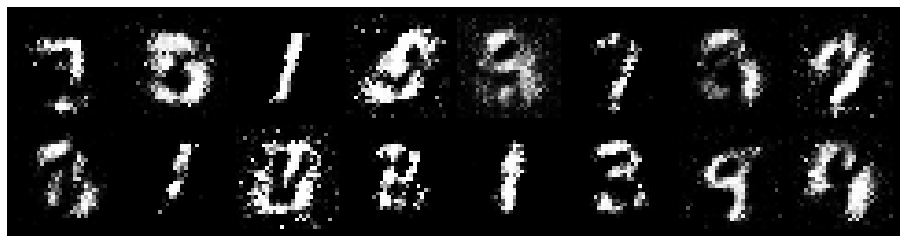

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.7380, Generator Loss: 1.6346
D(x): 0.7280, D(G(z)): 0.2287


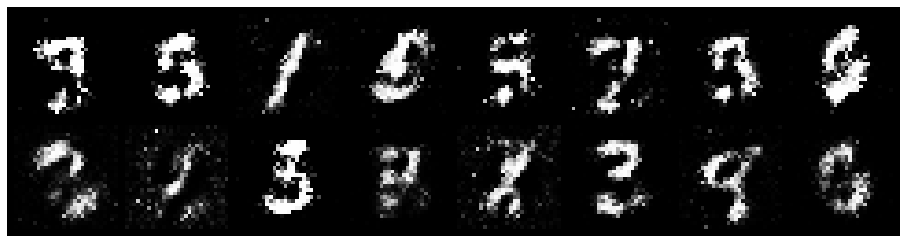

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 1.0599, Generator Loss: 2.0171
D(x): 0.6486, D(G(z)): 0.2078


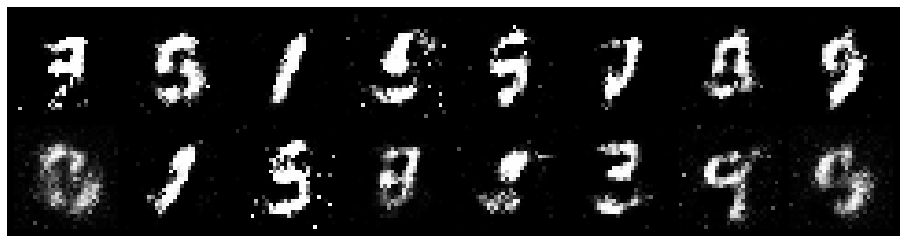

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.9766, Generator Loss: 1.6686
D(x): 0.7120, D(G(z)): 0.3125


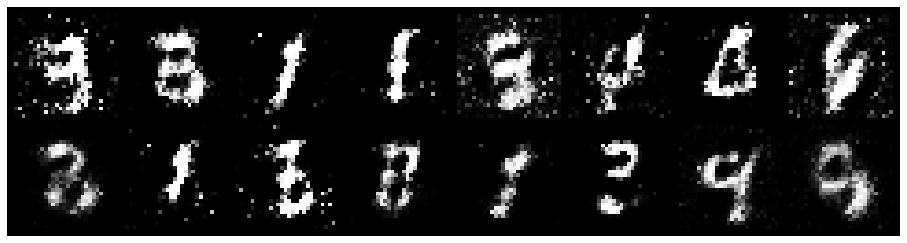

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.5818, Generator Loss: 1.6232
D(x): 0.7925, D(G(z)): 0.1787


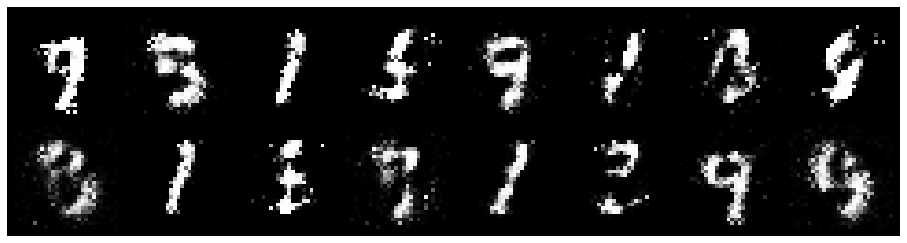

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.9486, Generator Loss: 2.0853
D(x): 0.7087, D(G(z)): 0.2376


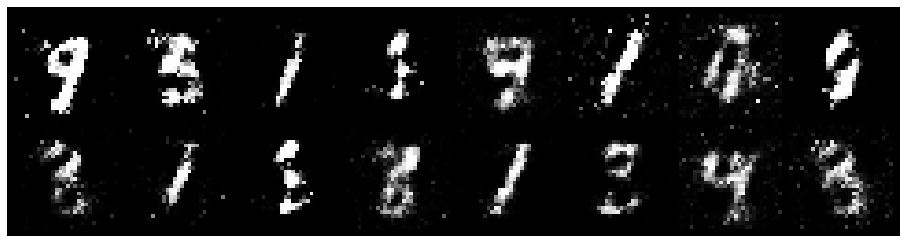

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.9729, Generator Loss: 2.0124
D(x): 0.6786, D(G(z)): 0.2312


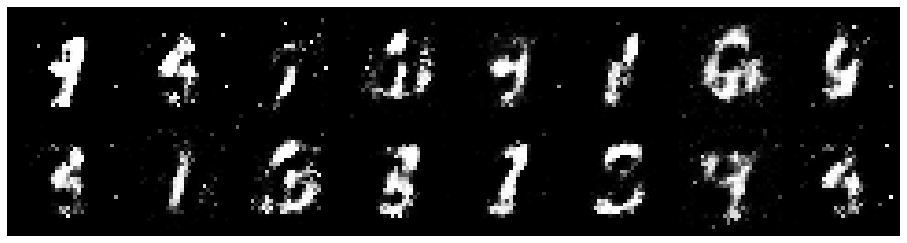

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 1.1254, Generator Loss: 1.5676
D(x): 0.6302, D(G(z)): 0.3212


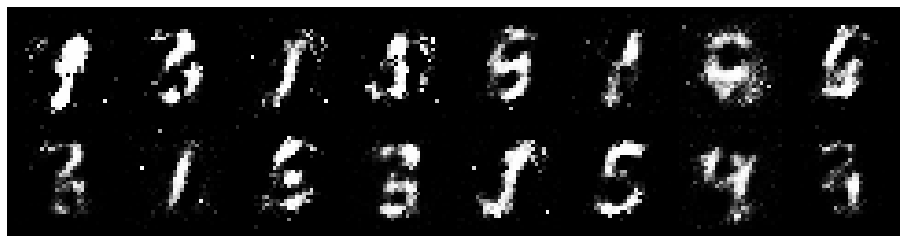

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.8437, Generator Loss: 1.9894
D(x): 0.6980, D(G(z)): 0.2185


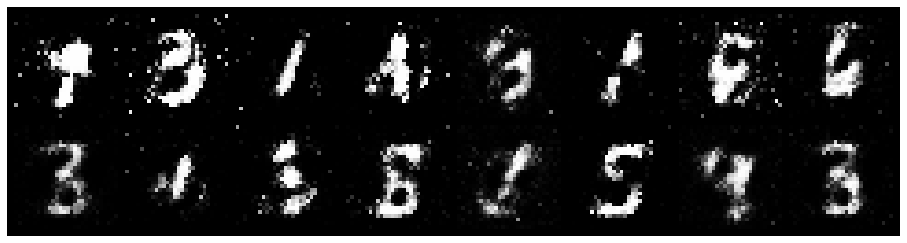

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.7566, Generator Loss: 1.9793
D(x): 0.7490, D(G(z)): 0.2627


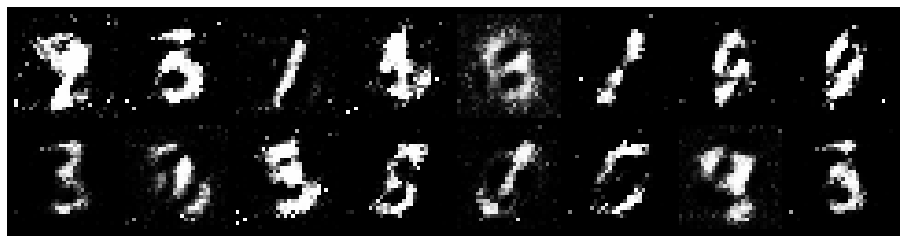

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.7894, Generator Loss: 1.5480
D(x): 0.7341, D(G(z)): 0.2840


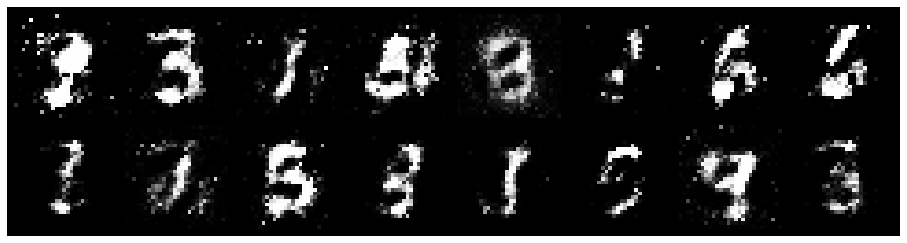

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.5366, Generator Loss: 2.1394
D(x): 0.8387, D(G(z)): 0.2392


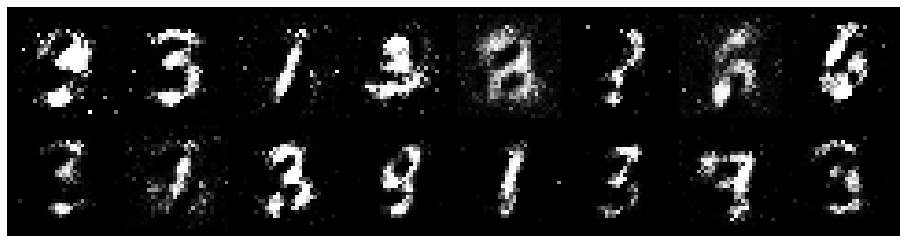

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.5424, Generator Loss: 2.1030
D(x): 0.8502, D(G(z)): 0.2592


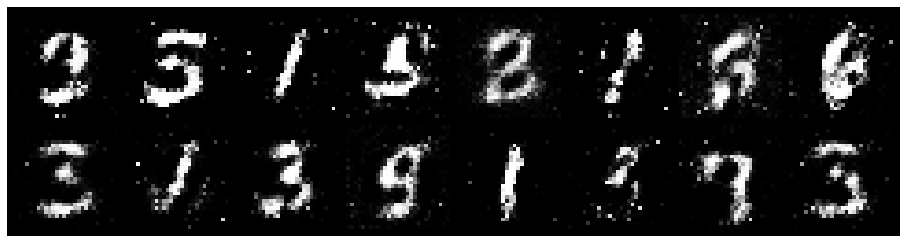

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.6287, Generator Loss: 2.5064
D(x): 0.7744, D(G(z)): 0.1868


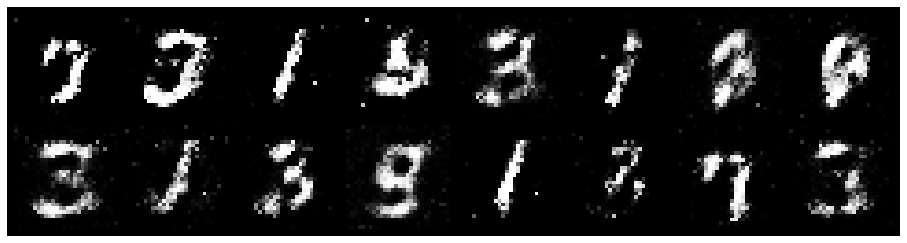

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 1.0903, Generator Loss: 1.0841
D(x): 0.6710, D(G(z)): 0.3779


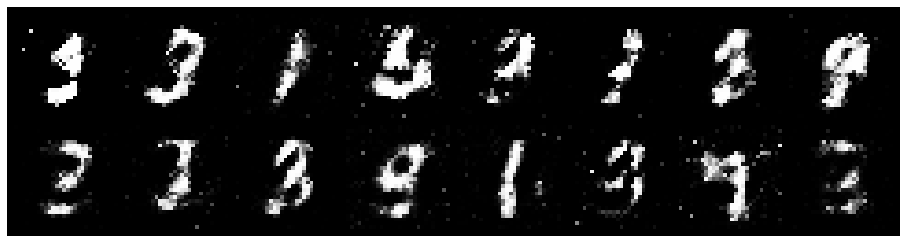

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.6852, Generator Loss: 1.4076
D(x): 0.7751, D(G(z)): 0.2533


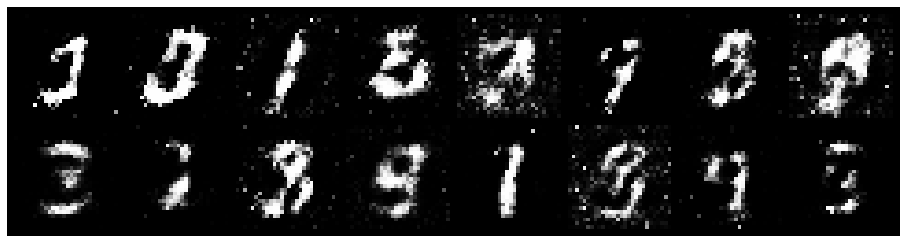

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.8093, Generator Loss: 1.3835
D(x): 0.7193, D(G(z)): 0.2664


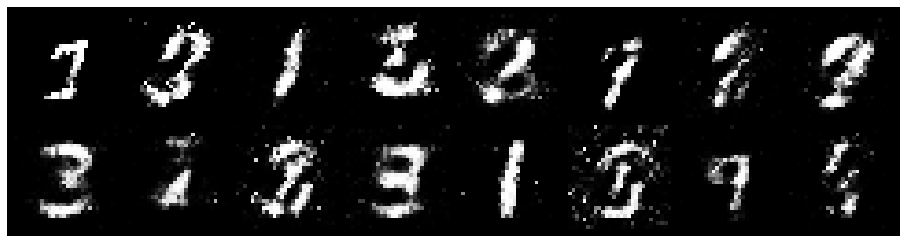

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.7122, Generator Loss: 2.1608
D(x): 0.7847, D(G(z)): 0.2342


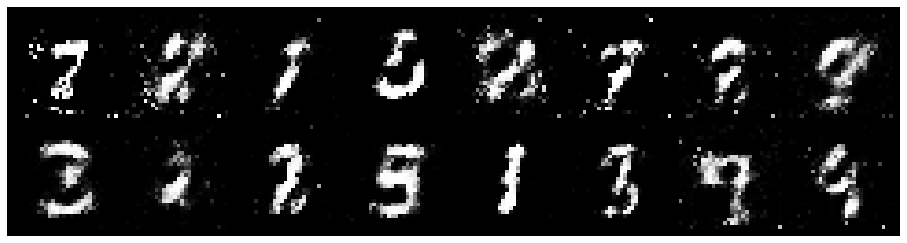

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8590, Generator Loss: 2.7428
D(x): 0.7365, D(G(z)): 0.2255


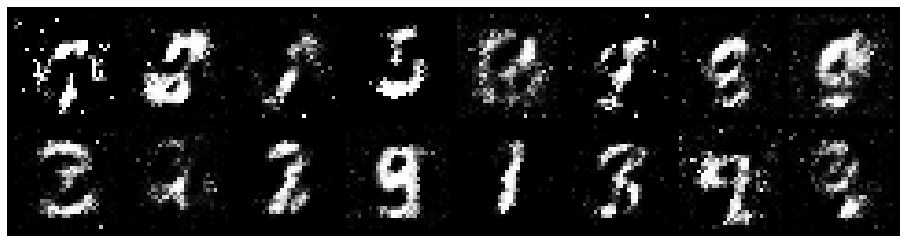

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.8213, Generator Loss: 2.0295
D(x): 0.7901, D(G(z)): 0.2905


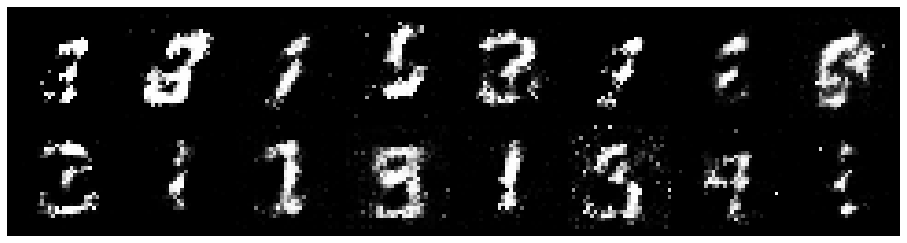

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.8605, Generator Loss: 1.5854
D(x): 0.7182, D(G(z)): 0.2751


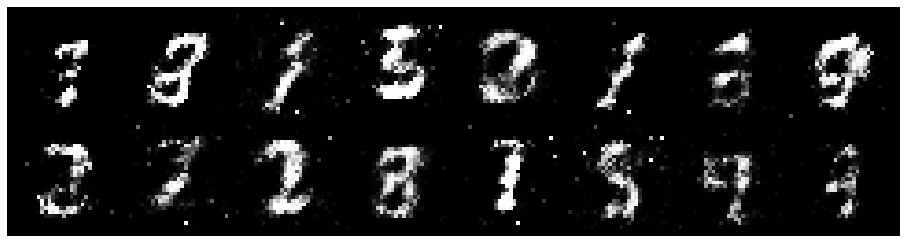

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.7421, Generator Loss: 2.1099
D(x): 0.7523, D(G(z)): 0.2122


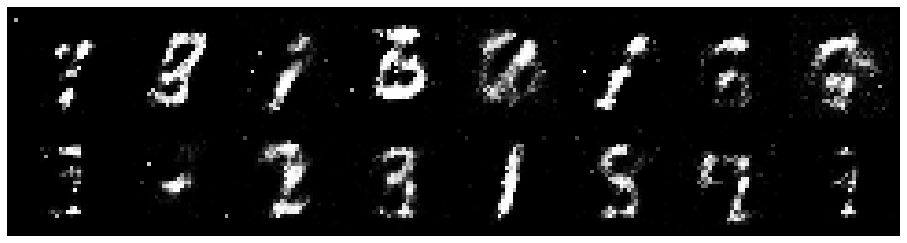

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.8504, Generator Loss: 2.5697
D(x): 0.6962, D(G(z)): 0.1369


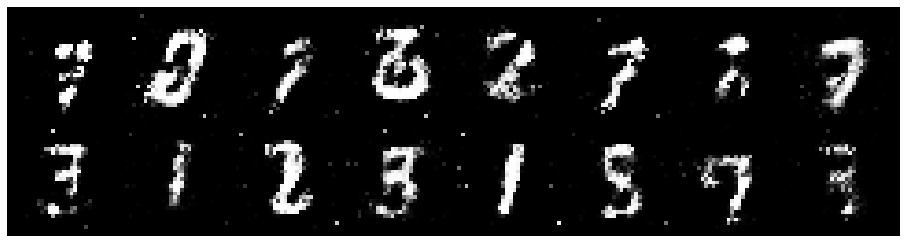

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.6415, Generator Loss: 2.4345
D(x): 0.7688, D(G(z)): 0.1865


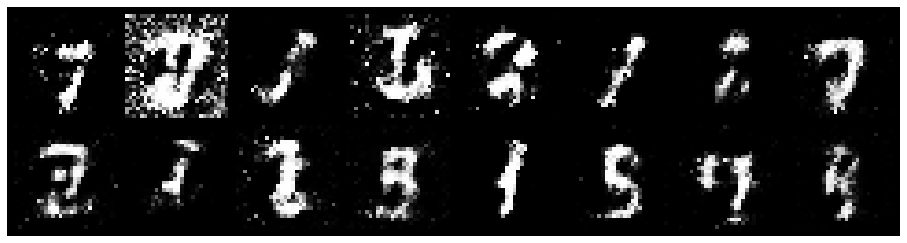

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 1.1083, Generator Loss: 1.4727
D(x): 0.6652, D(G(z)): 0.2702


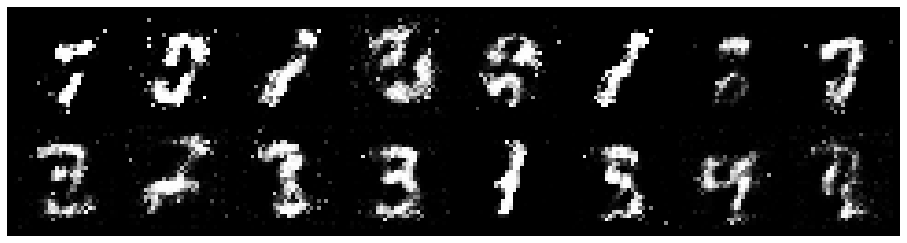

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 1.0943, Generator Loss: 1.9299
D(x): 0.6006, D(G(z)): 0.2408


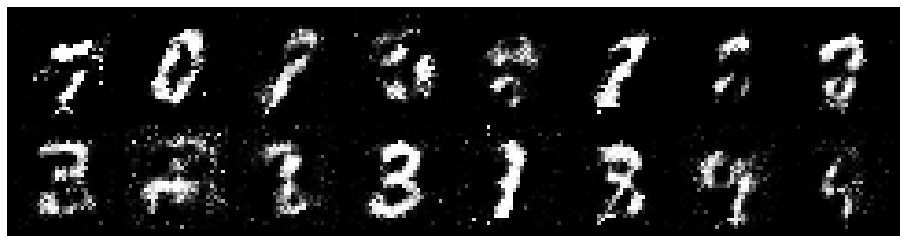

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.8075, Generator Loss: 1.5373
D(x): 0.7456, D(G(z)): 0.2466


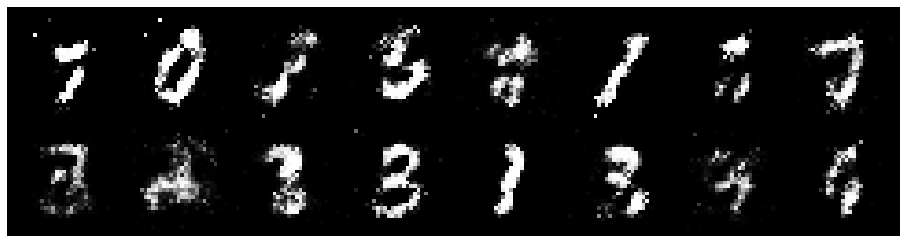

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.7204, Generator Loss: 1.6004
D(x): 0.7838, D(G(z)): 0.2621


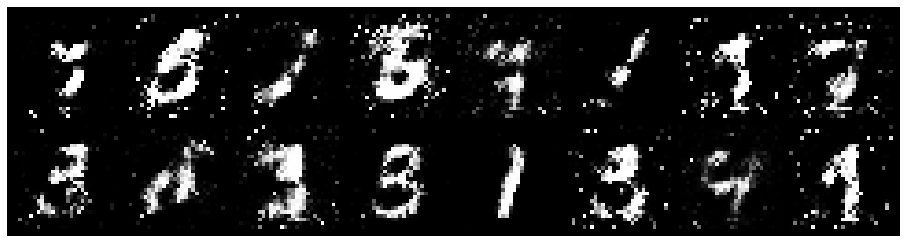

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 1.0125, Generator Loss: 1.4547
D(x): 0.7683, D(G(z)): 0.4195


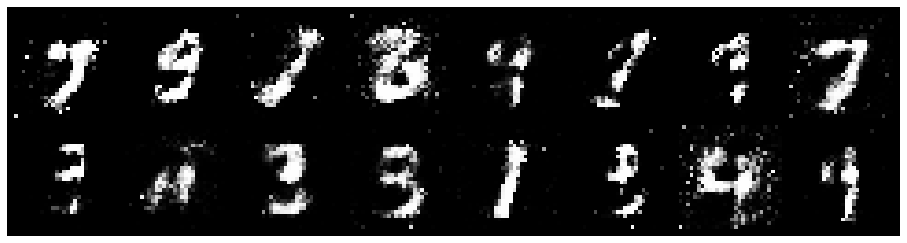

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 1.0104, Generator Loss: 1.3382
D(x): 0.6467, D(G(z)): 0.3297


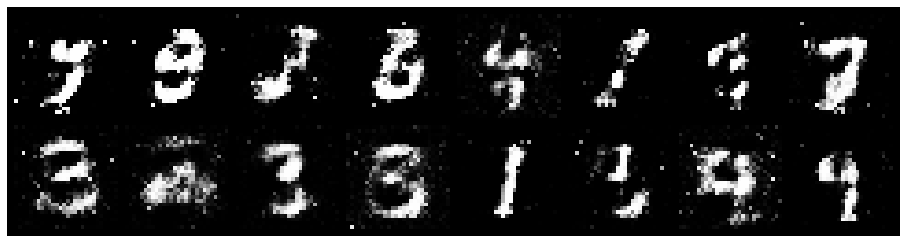

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.9897, Generator Loss: 1.8004
D(x): 0.7116, D(G(z)): 0.2977


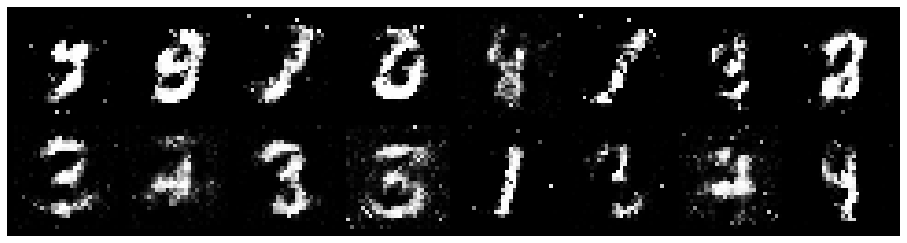

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.7965, Generator Loss: 2.0106
D(x): 0.7454, D(G(z)): 0.2748


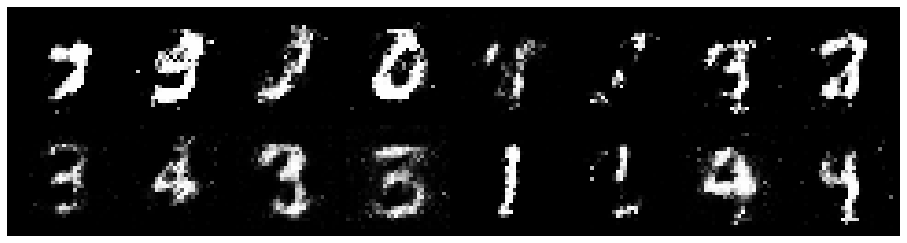

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.8372, Generator Loss: 1.8256
D(x): 0.7478, D(G(z)): 0.2940


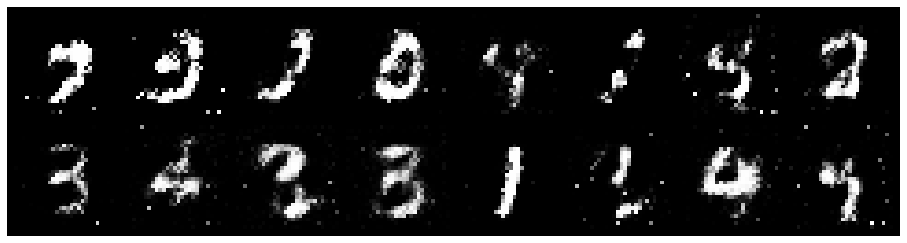

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.6960, Generator Loss: 1.6547
D(x): 0.7918, D(G(z)): 0.2766


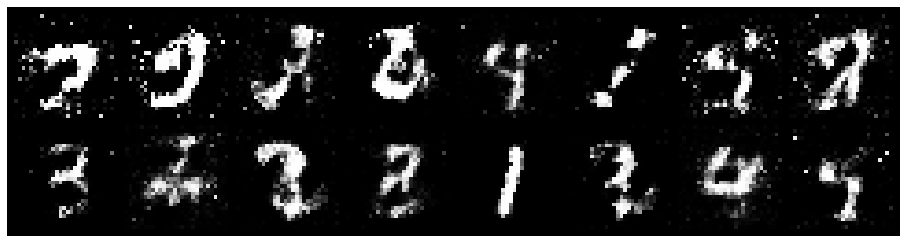

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 0.8245, Generator Loss: 2.0214
D(x): 0.7812, D(G(z)): 0.3054


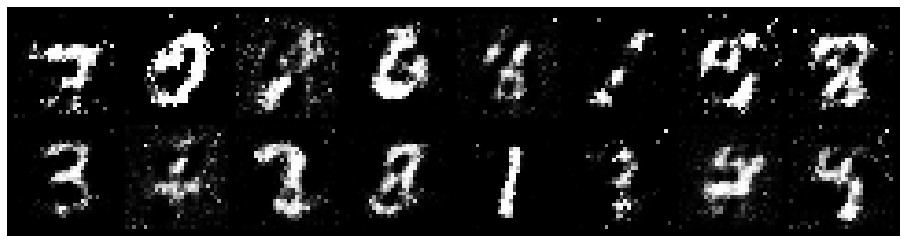

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.8585, Generator Loss: 1.5729
D(x): 0.8267, D(G(z)): 0.3512


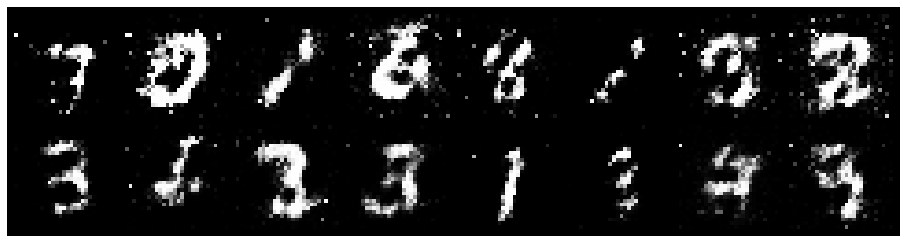

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.9115, Generator Loss: 1.6586
D(x): 0.7552, D(G(z)): 0.3323


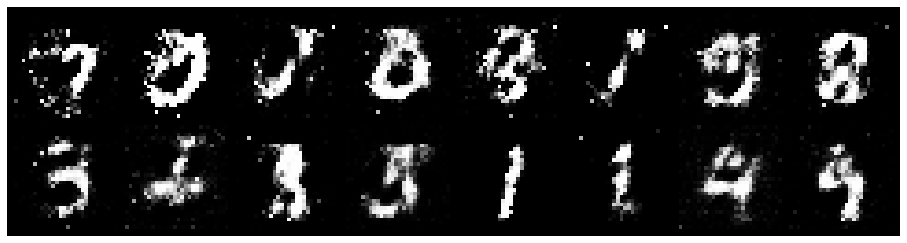

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.9903, Generator Loss: 1.8273
D(x): 0.6469, D(G(z)): 0.2664


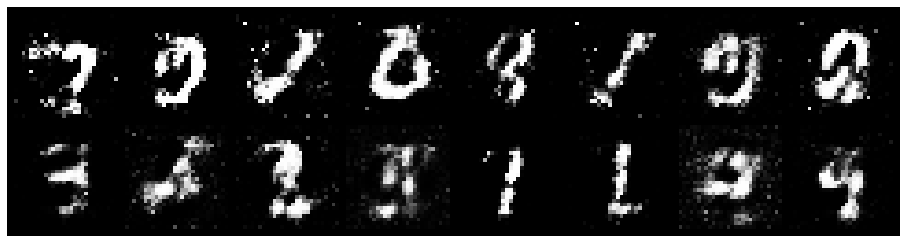

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 1.1693, Generator Loss: 1.4796
D(x): 0.6533, D(G(z)): 0.3315


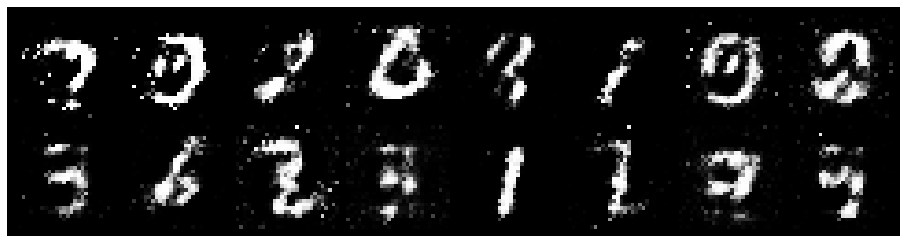

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 1.1063, Generator Loss: 1.5831
D(x): 0.7712, D(G(z)): 0.4297


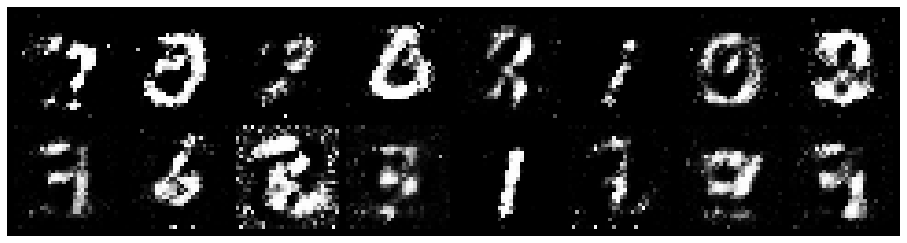

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 1.0360, Generator Loss: 1.3361
D(x): 0.6429, D(G(z)): 0.3389


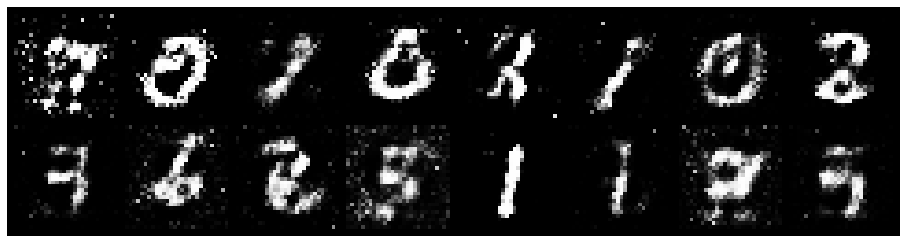

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 1.0579, Generator Loss: 1.2934
D(x): 0.7164, D(G(z)): 0.3951


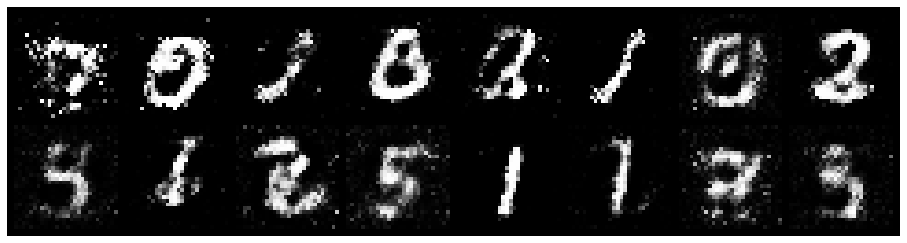

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 1.1318, Generator Loss: 1.5282
D(x): 0.6303, D(G(z)): 0.3605


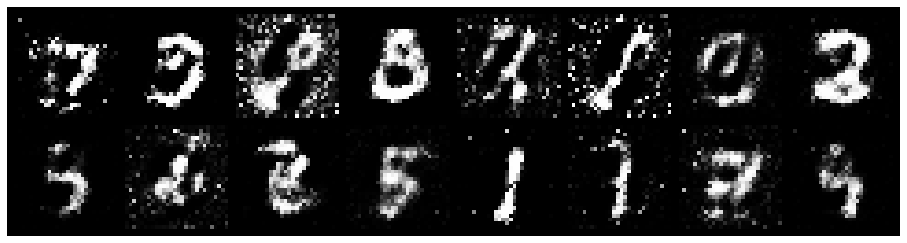

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 1.0136, Generator Loss: 1.3409
D(x): 0.6865, D(G(z)): 0.3776


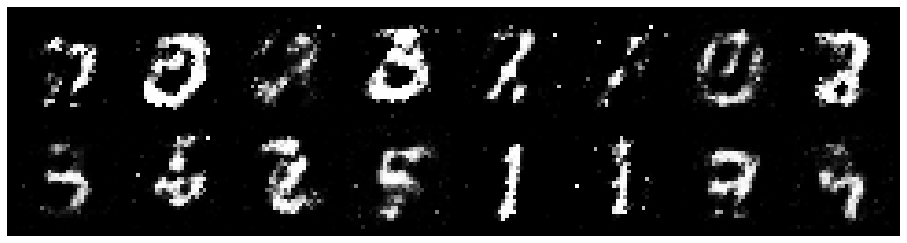

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 1.2887, Generator Loss: 1.4985
D(x): 0.5991, D(G(z)): 0.3458


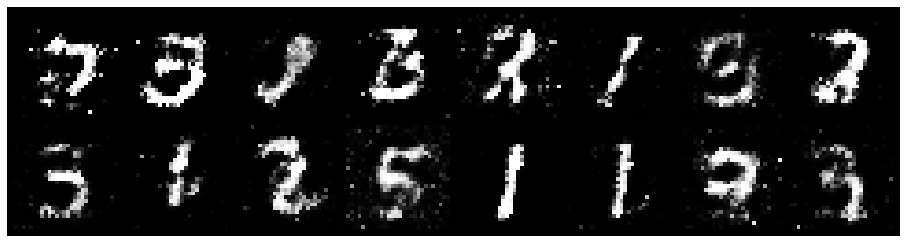

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.9147, Generator Loss: 1.6314
D(x): 0.6480, D(G(z)): 0.2251


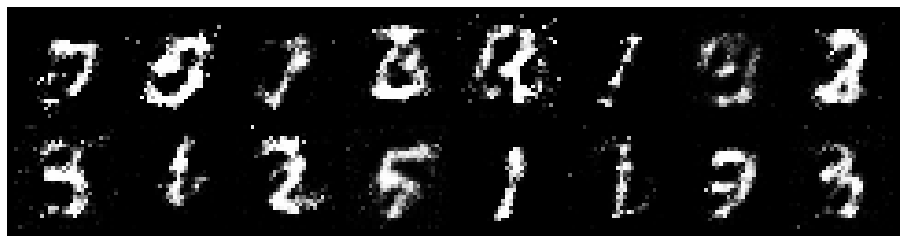

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 1.0906, Generator Loss: 1.5803
D(x): 0.7371, D(G(z)): 0.3903


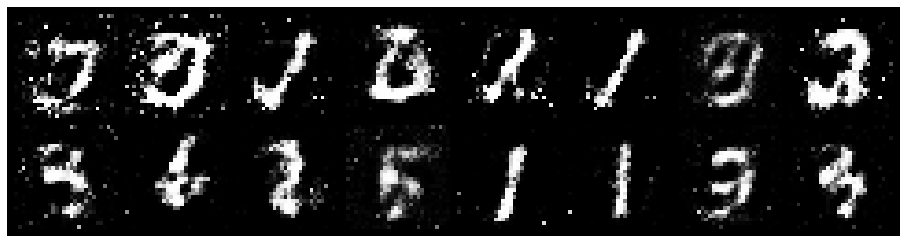

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.8797, Generator Loss: 1.6262
D(x): 0.7328, D(G(z)): 0.3171


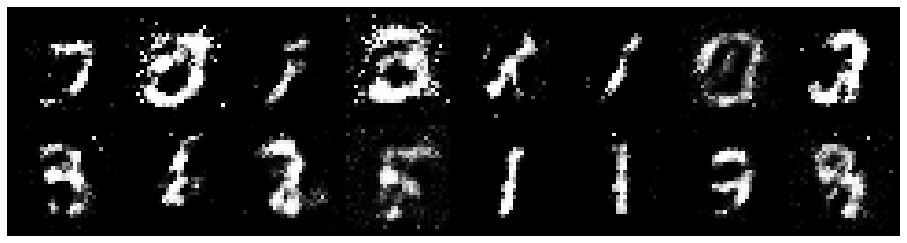

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.9797, Generator Loss: 1.6911
D(x): 0.7244, D(G(z)): 0.3171


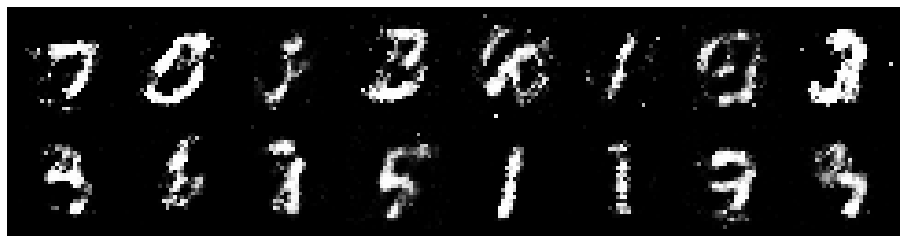

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.7698, Generator Loss: 1.8152
D(x): 0.7650, D(G(z)): 0.2937


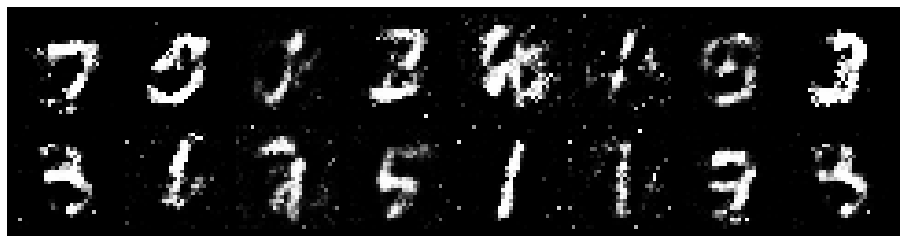

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 1.1861, Generator Loss: 1.0482
D(x): 0.6218, D(G(z)): 0.4181


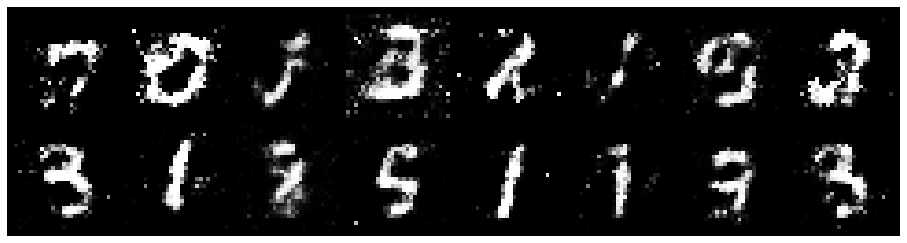

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 1.1075, Generator Loss: 1.1251
D(x): 0.7166, D(G(z)): 0.4319


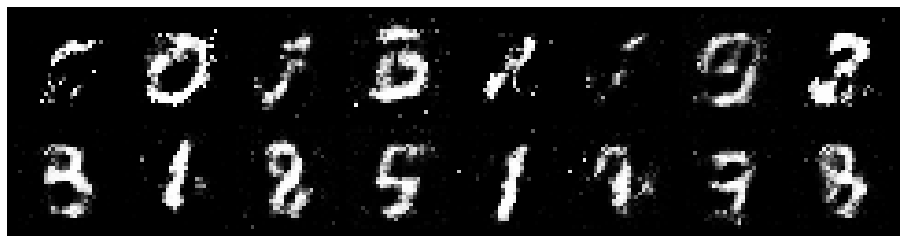

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 0.8880, Generator Loss: 1.2305
D(x): 0.6706, D(G(z)): 0.2815


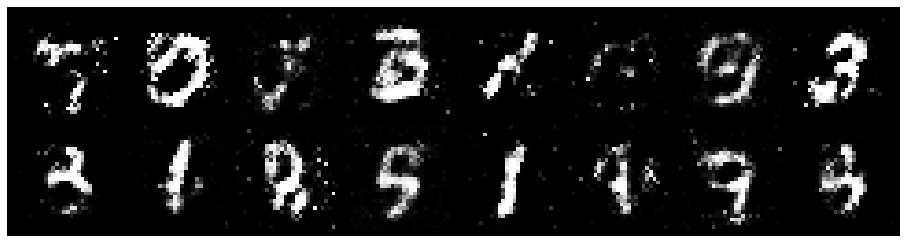

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.9048, Generator Loss: 1.4564
D(x): 0.6883, D(G(z)): 0.3268


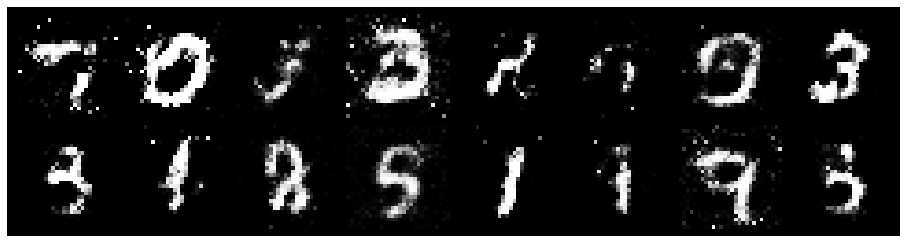

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 1.2604, Generator Loss: 1.1410
D(x): 0.5956, D(G(z)): 0.3805


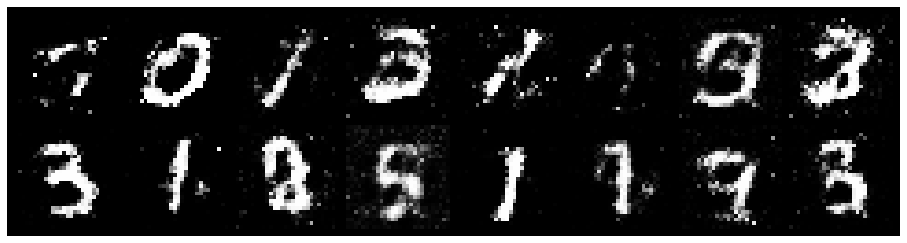

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 1.2145, Generator Loss: 1.1782
D(x): 0.6179, D(G(z)): 0.4015


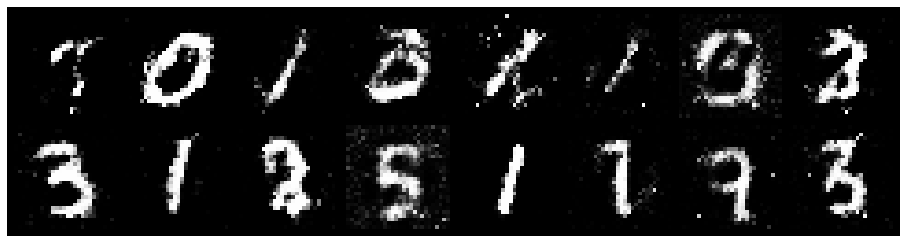

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 1.1240, Generator Loss: 1.3737
D(x): 0.6028, D(G(z)): 0.2919


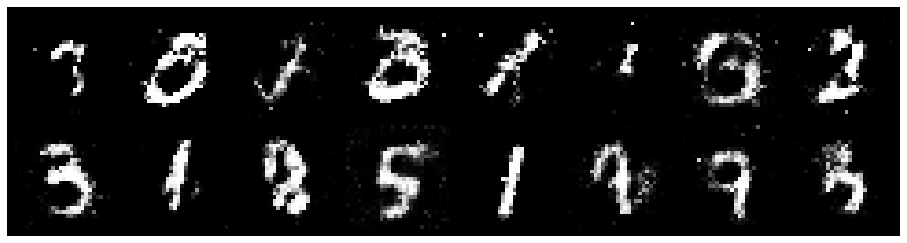

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.9498, Generator Loss: 1.9075
D(x): 0.7399, D(G(z)): 0.3147


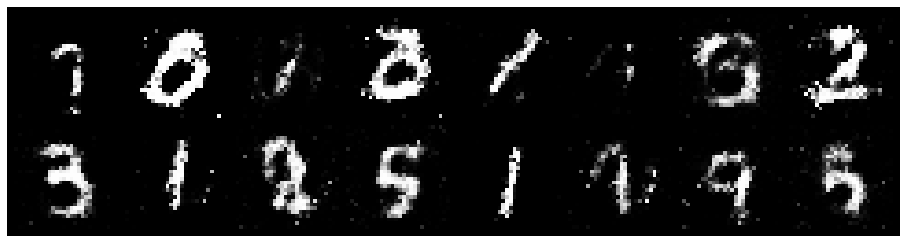

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 1.0219, Generator Loss: 1.5673
D(x): 0.6412, D(G(z)): 0.3244


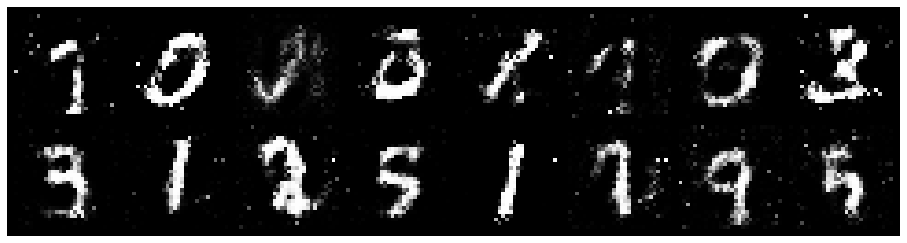

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.9110, Generator Loss: 1.2660
D(x): 0.7261, D(G(z)): 0.3318


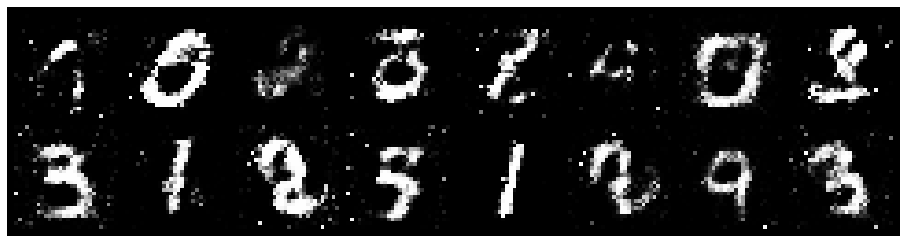

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.9000, Generator Loss: 1.4664
D(x): 0.7137, D(G(z)): 0.3157


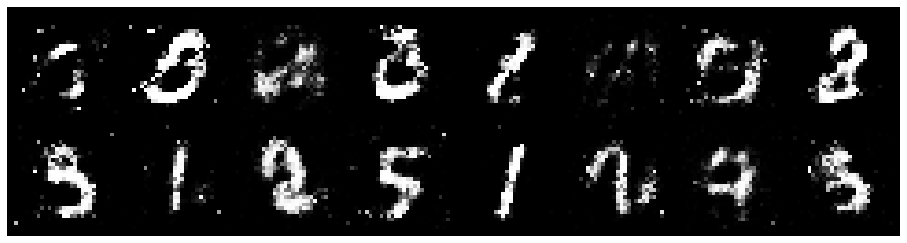

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.8364, Generator Loss: 1.5613
D(x): 0.7551, D(G(z)): 0.3318


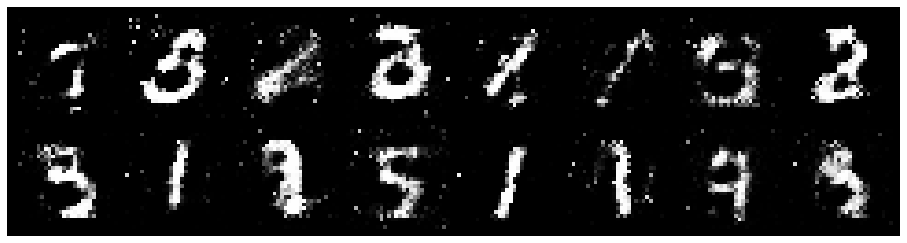

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 0.9568, Generator Loss: 1.8455
D(x): 0.6277, D(G(z)): 0.2642


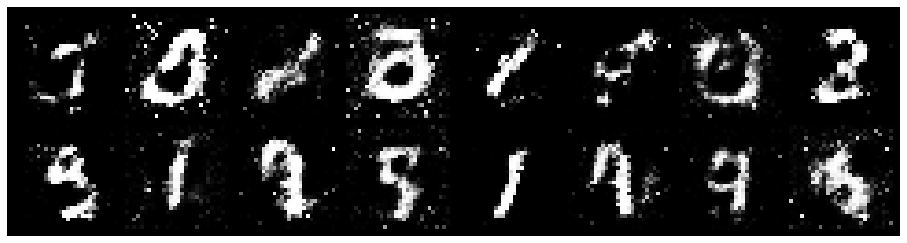

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 1.1702, Generator Loss: 1.3637
D(x): 0.6691, D(G(z)): 0.3803


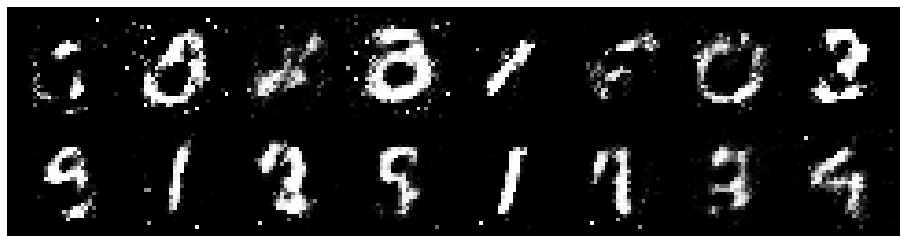

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 0.8974, Generator Loss: 1.2514
D(x): 0.7260, D(G(z)): 0.3452


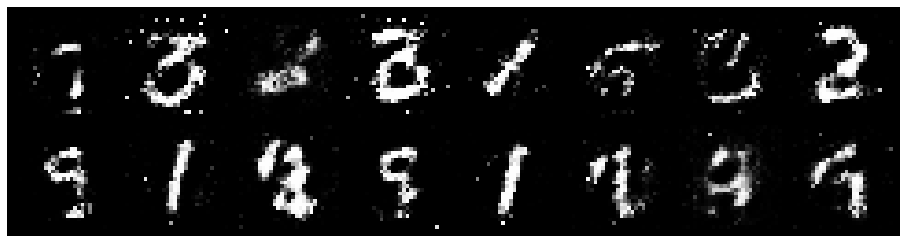

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.7168, Generator Loss: 1.5135
D(x): 0.7230, D(G(z)): 0.2489


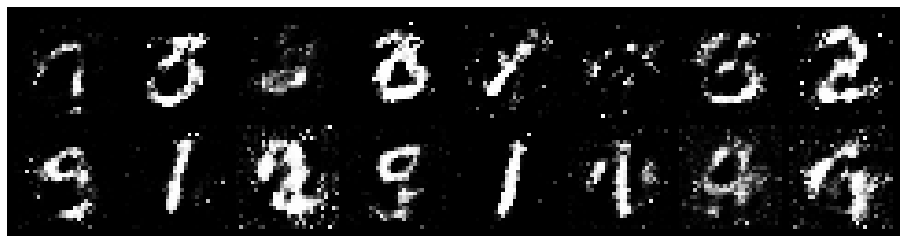

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 0.8031, Generator Loss: 1.3145
D(x): 0.7745, D(G(z)): 0.3475


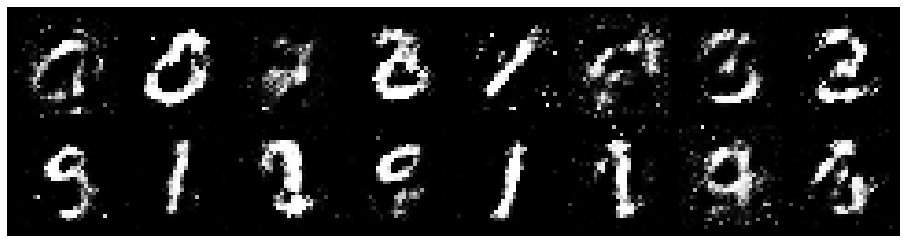

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.7281, Generator Loss: 1.6556
D(x): 0.8068, D(G(z)): 0.3074


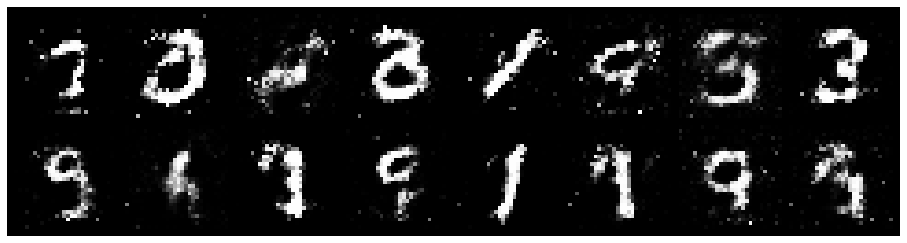

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.0462, Generator Loss: 1.6199
D(x): 0.6772, D(G(z)): 0.3163


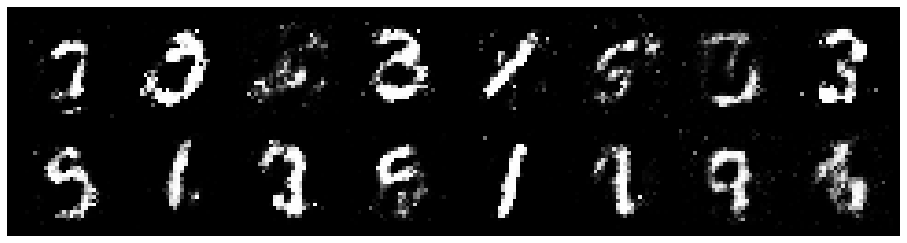

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.9510, Generator Loss: 1.5827
D(x): 0.7388, D(G(z)): 0.3559


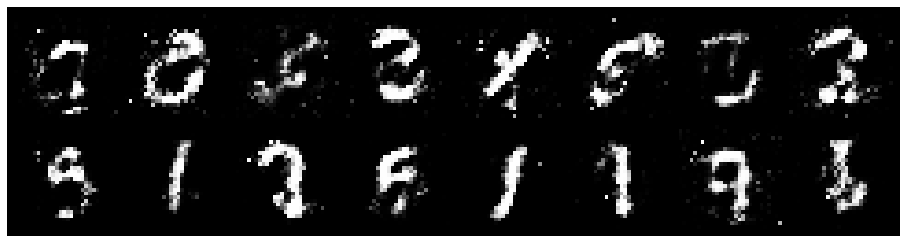

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9083, Generator Loss: 1.8350
D(x): 0.7669, D(G(z)): 0.3321


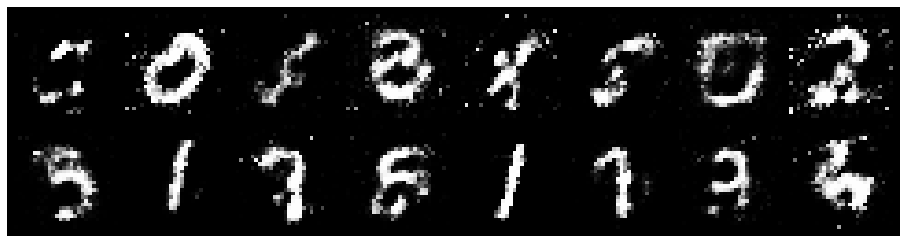

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.9632, Generator Loss: 1.3432
D(x): 0.7310, D(G(z)): 0.3703


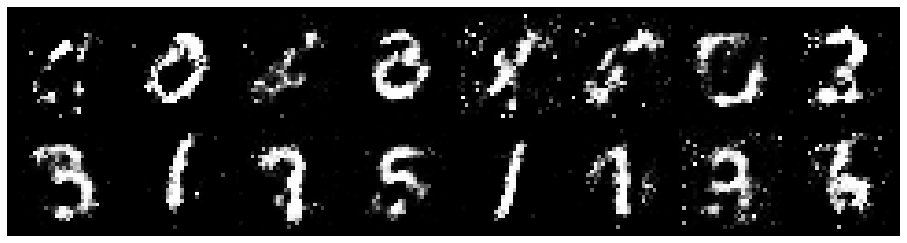

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.7871, Generator Loss: 1.5400
D(x): 0.7112, D(G(z)): 0.2824


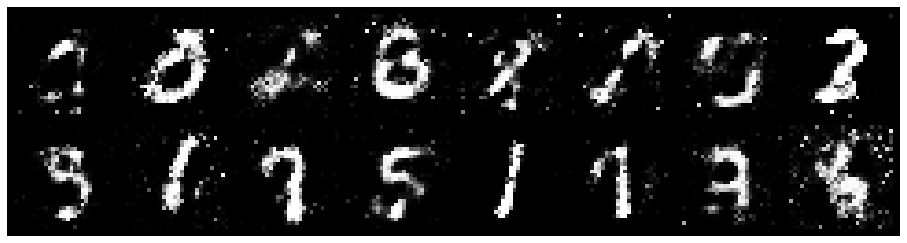

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.9905, Generator Loss: 1.3136
D(x): 0.6623, D(G(z)): 0.3145


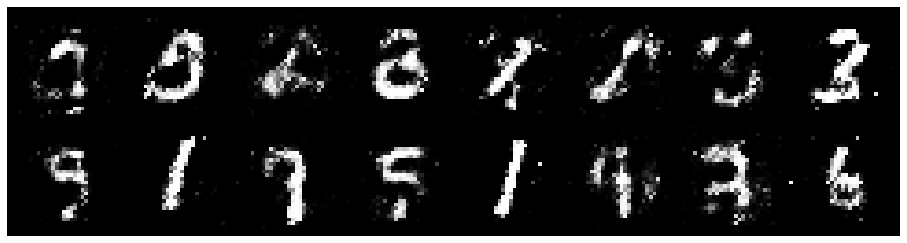

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.7866, Generator Loss: 1.3705
D(x): 0.7382, D(G(z)): 0.3005


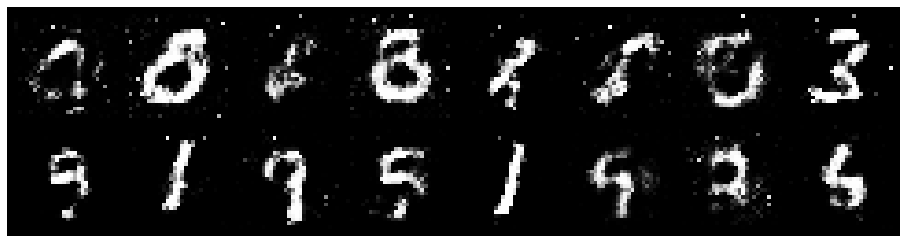

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9626, Generator Loss: 1.3104
D(x): 0.6538, D(G(z)): 0.3260


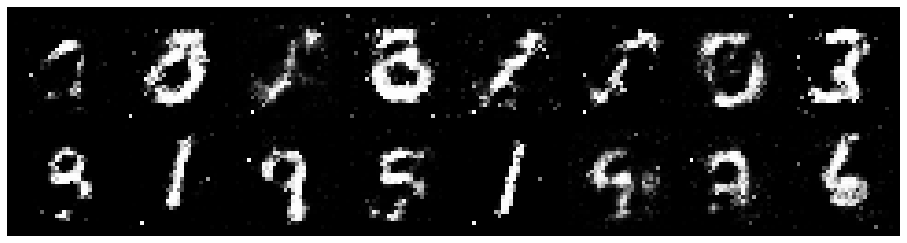

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 0.9549, Generator Loss: 1.4558
D(x): 0.6520, D(G(z)): 0.3038


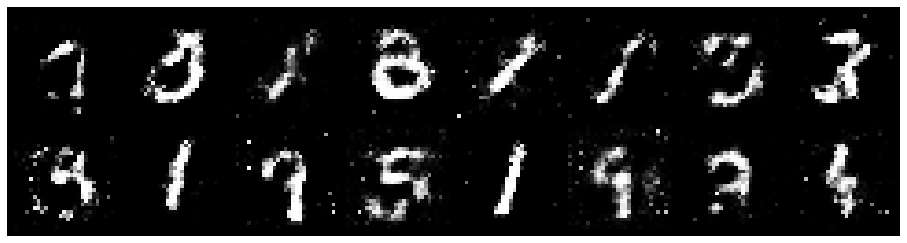

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9823, Generator Loss: 1.2785
D(x): 0.6917, D(G(z)): 0.3297


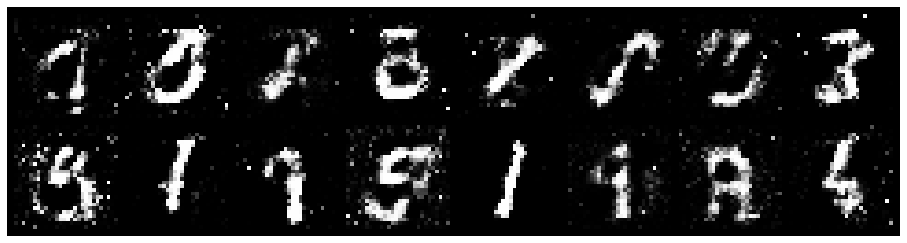

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.0013, Generator Loss: 1.3049
D(x): 0.7018, D(G(z)): 0.3764


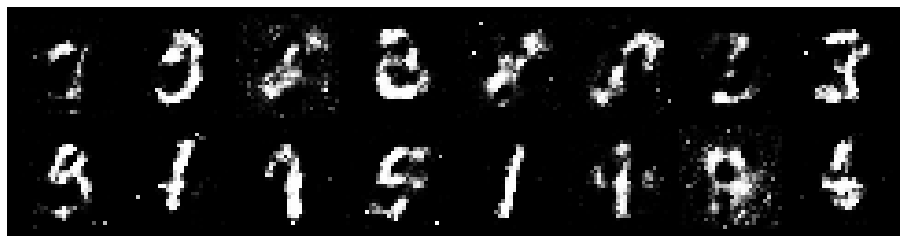

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 1.2274, Generator Loss: 1.1066
D(x): 0.5877, D(G(z)): 0.3966


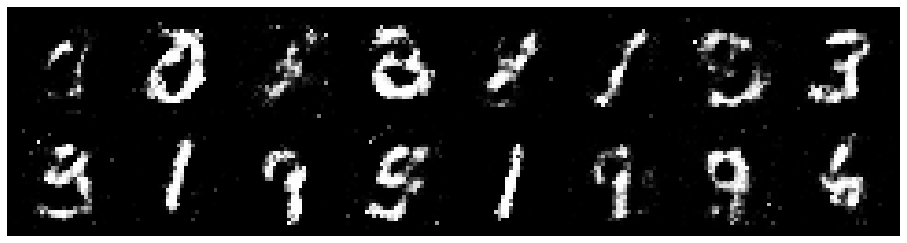

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 1.1106, Generator Loss: 1.0422
D(x): 0.7430, D(G(z)): 0.4055


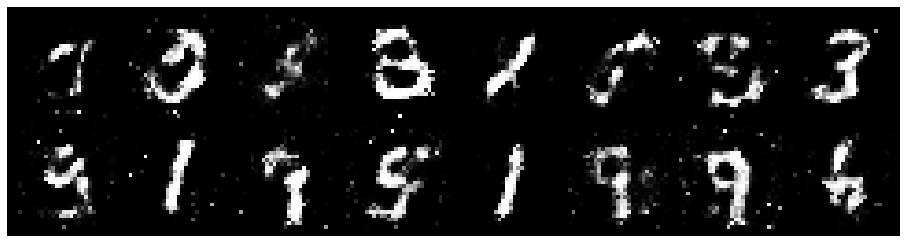

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.1164, Generator Loss: 1.0820
D(x): 0.6902, D(G(z)): 0.4234


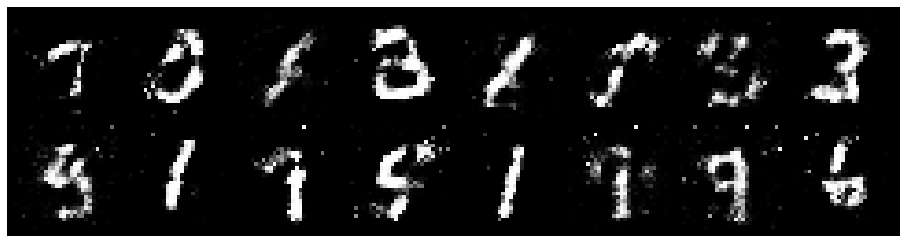

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 0.8660, Generator Loss: 1.5638
D(x): 0.6886, D(G(z)): 0.2802


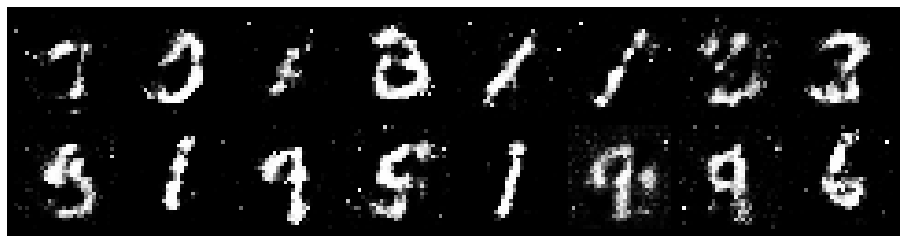

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 0.9443, Generator Loss: 1.5241
D(x): 0.6837, D(G(z)): 0.3251


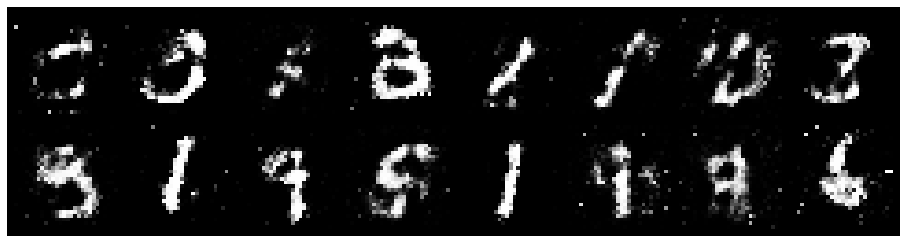

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.8422, Generator Loss: 1.7853
D(x): 0.6714, D(G(z)): 0.2575


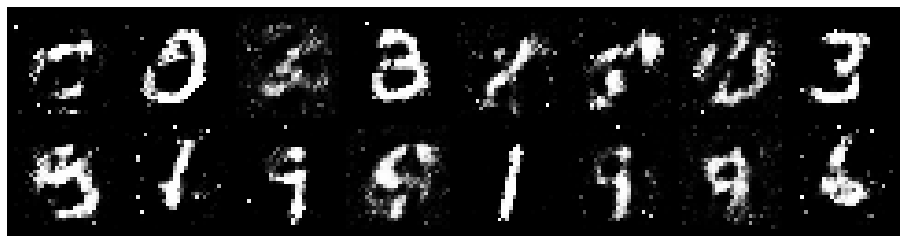

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.9748, Generator Loss: 1.3880
D(x): 0.6472, D(G(z)): 0.3289


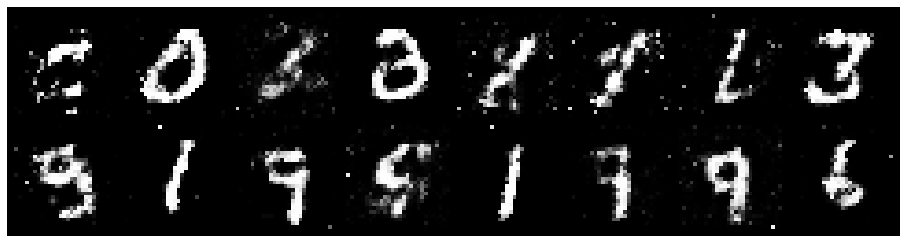

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.0433, Generator Loss: 1.1034
D(x): 0.6603, D(G(z)): 0.3717


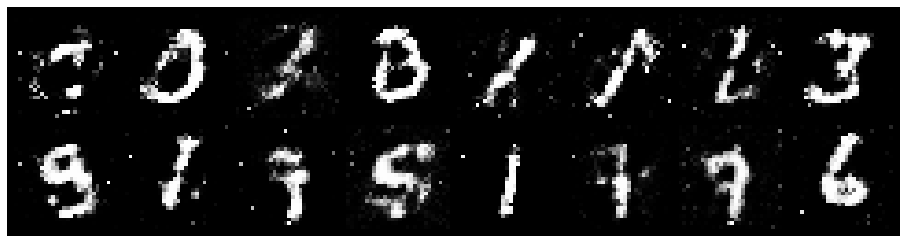

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.1664, Generator Loss: 1.1322
D(x): 0.5899, D(G(z)): 0.3637


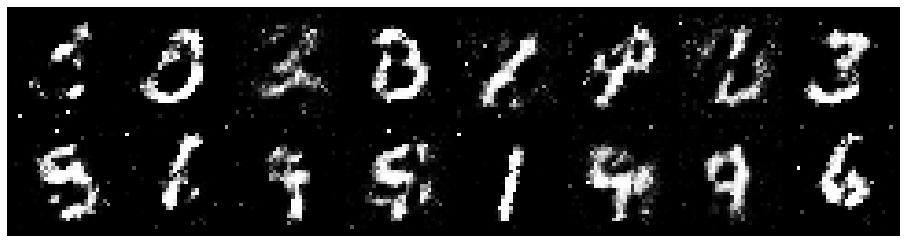

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 1.1463, Generator Loss: 1.0473
D(x): 0.6454, D(G(z)): 0.3982


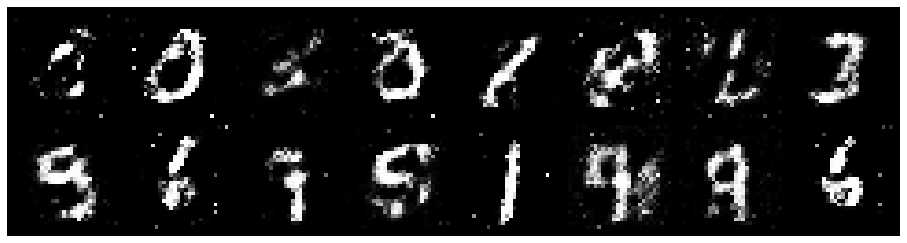

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.8647, Generator Loss: 1.3578
D(x): 0.6951, D(G(z)): 0.3054


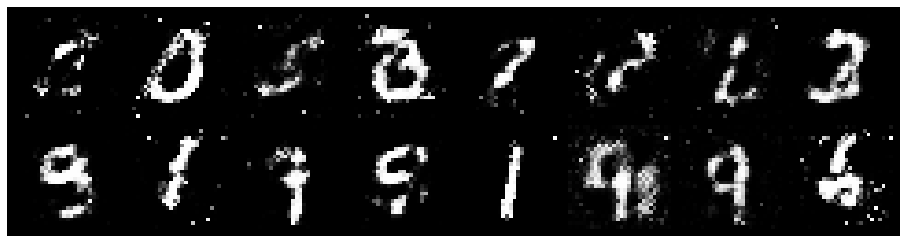

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.1024, Generator Loss: 1.3243
D(x): 0.5922, D(G(z)): 0.3064


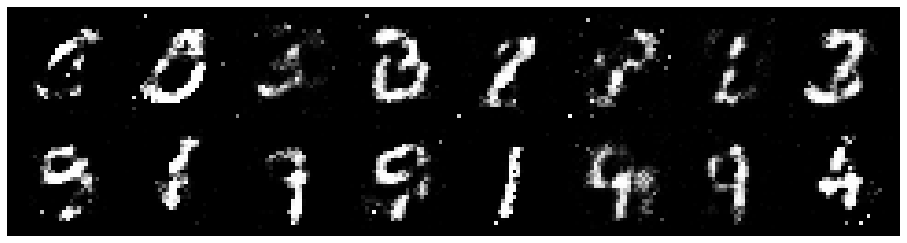

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9054, Generator Loss: 1.4636
D(x): 0.6482, D(G(z)): 0.2603


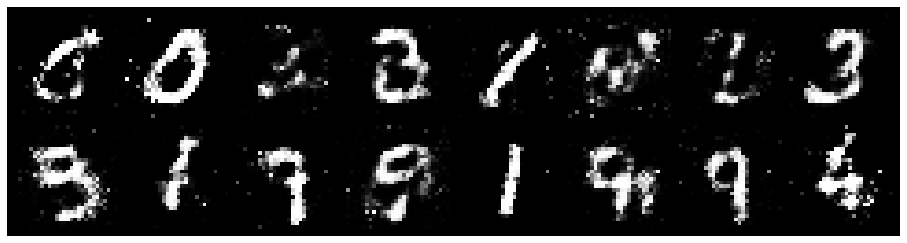

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.1746, Generator Loss: 1.2292
D(x): 0.6184, D(G(z)): 0.3882


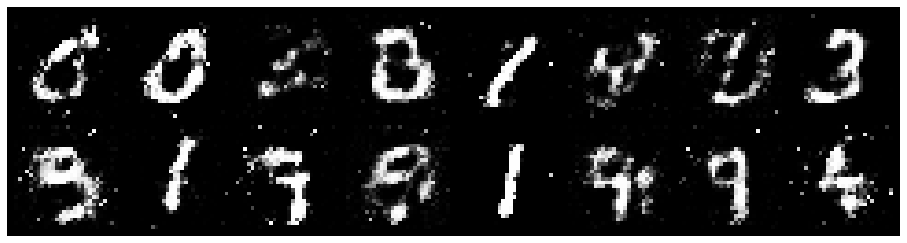

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.1004, Generator Loss: 1.3246
D(x): 0.6436, D(G(z)): 0.3737


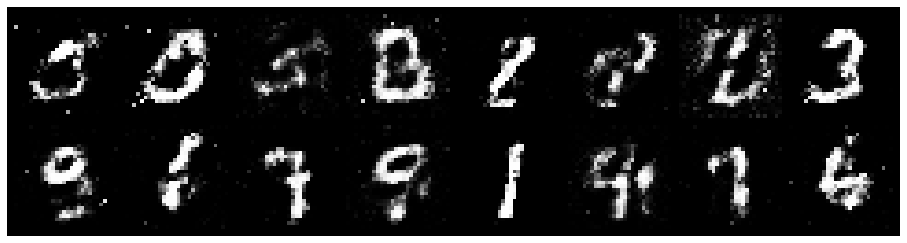

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 0.9321, Generator Loss: 1.1685
D(x): 0.6823, D(G(z)): 0.3298


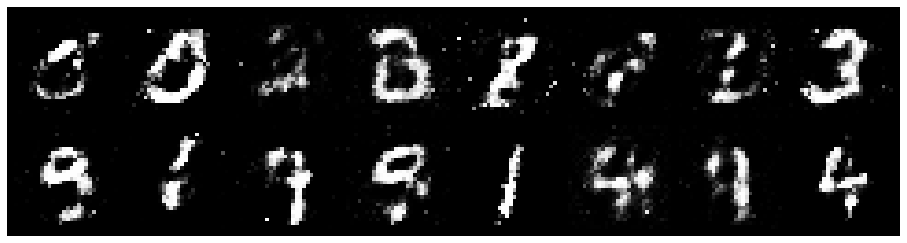

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0690, Generator Loss: 1.4959
D(x): 0.6772, D(G(z)): 0.3190


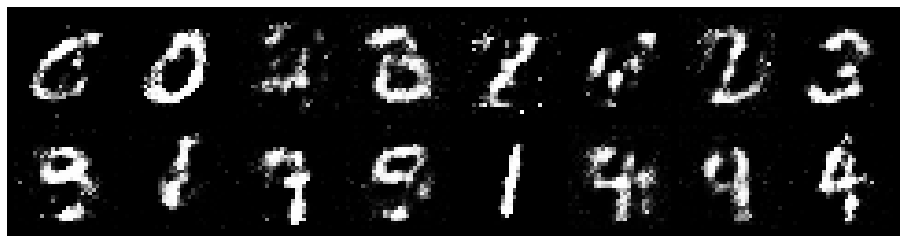

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.1909, Generator Loss: 1.2098
D(x): 0.6265, D(G(z)): 0.3735


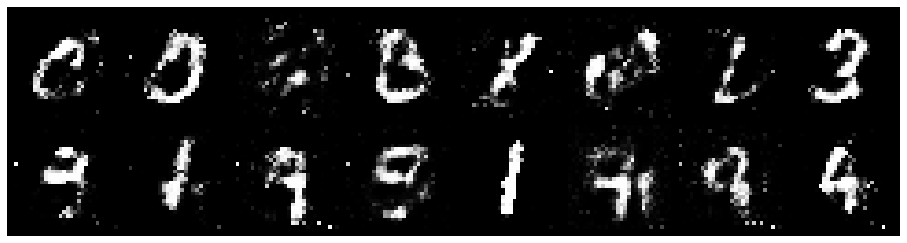

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.0848, Generator Loss: 1.2681
D(x): 0.6330, D(G(z)): 0.3730


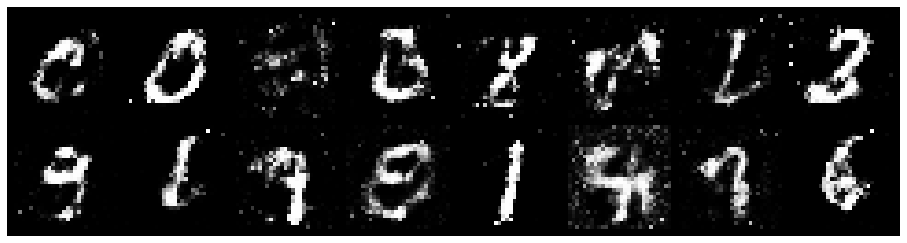

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 0.9620, Generator Loss: 1.0022
D(x): 0.7189, D(G(z)): 0.3992


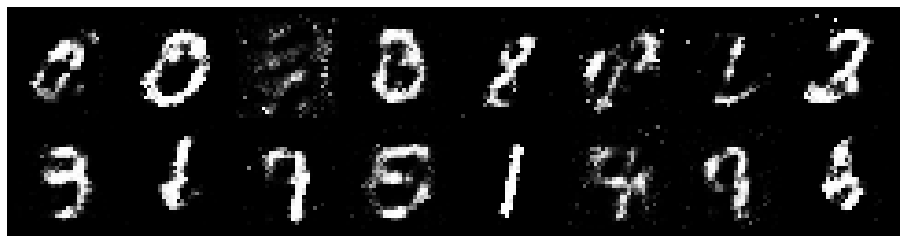

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 1.0460, Generator Loss: 1.5147
D(x): 0.6811, D(G(z)): 0.3834


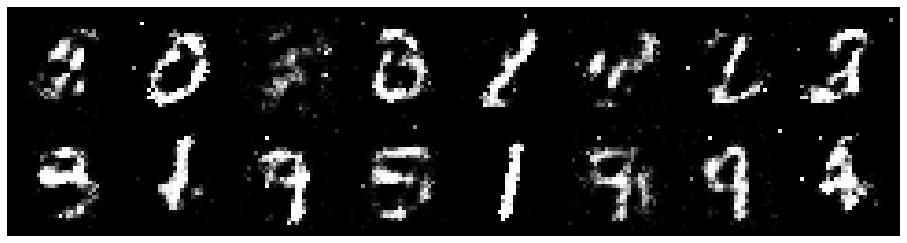

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.8910, Generator Loss: 1.5097
D(x): 0.6839, D(G(z)): 0.2826


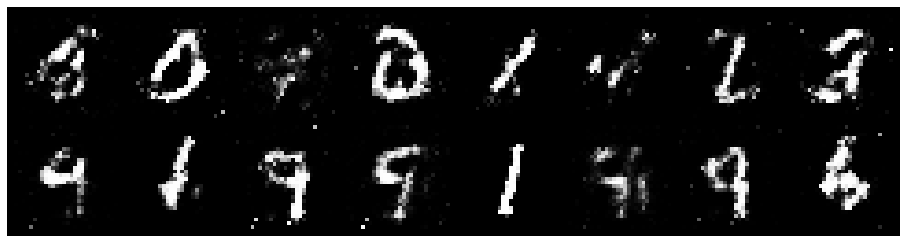

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.1052, Generator Loss: 1.1445
D(x): 0.6898, D(G(z)): 0.4272


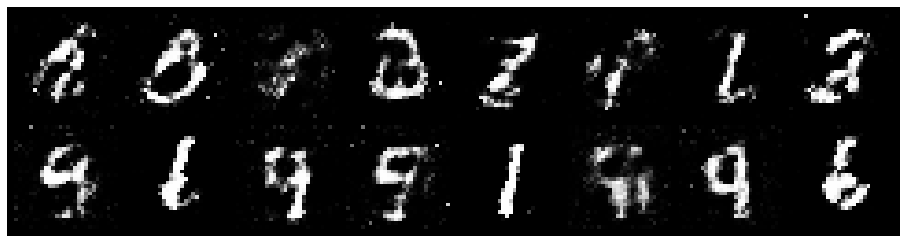

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0873, Generator Loss: 1.0526
D(x): 0.6568, D(G(z)): 0.3970


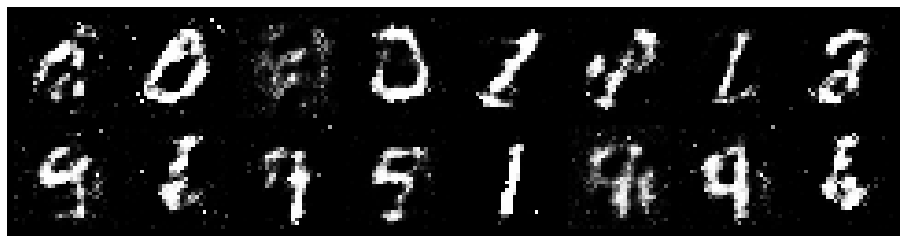

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.1017, Generator Loss: 1.1224
D(x): 0.5973, D(G(z)): 0.3509


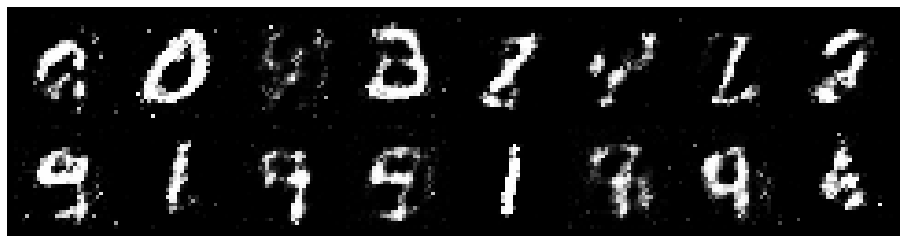

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.9379, Generator Loss: 1.5388
D(x): 0.6867, D(G(z)): 0.3504


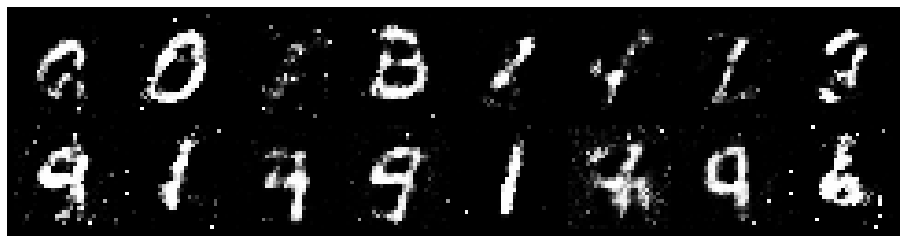

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.9201, Generator Loss: 1.4581
D(x): 0.7056, D(G(z)): 0.3291


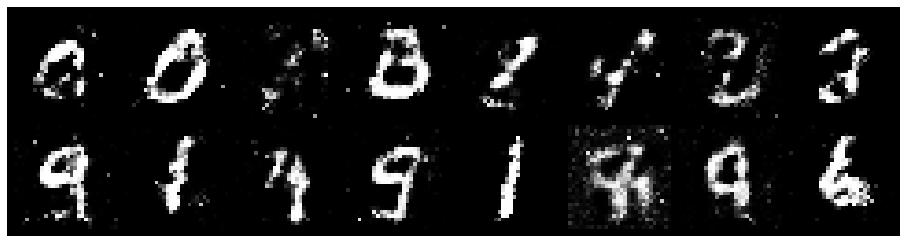

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 0.8721, Generator Loss: 1.6109
D(x): 0.6834, D(G(z)): 0.3071


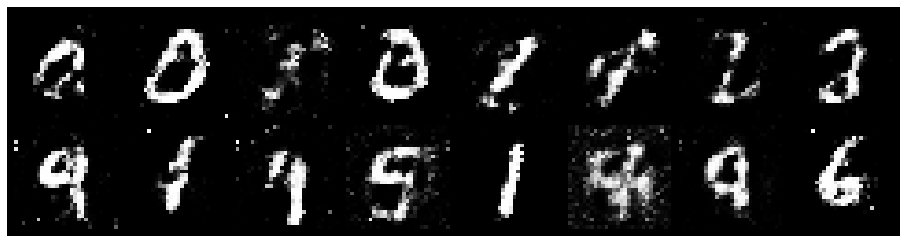

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.9855, Generator Loss: 1.1658
D(x): 0.7868, D(G(z)): 0.3978


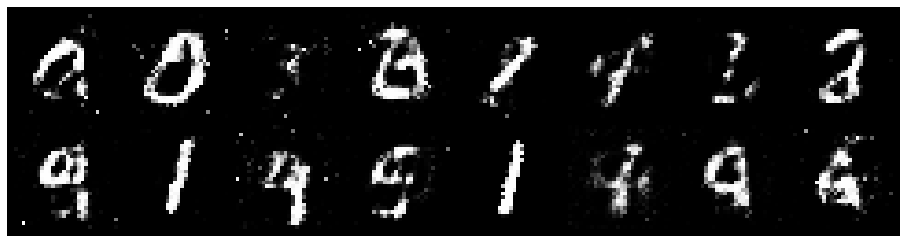

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.9766, Generator Loss: 1.8069
D(x): 0.6844, D(G(z)): 0.3298


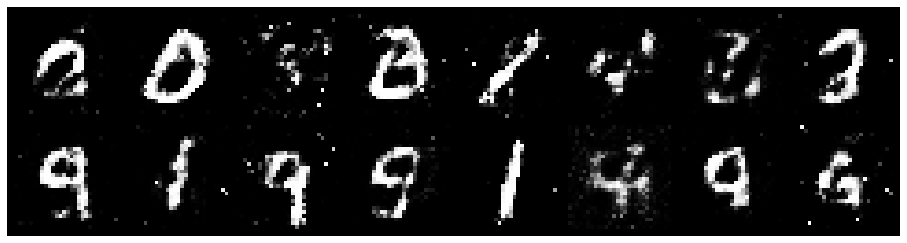

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9851, Generator Loss: 1.1596
D(x): 0.6507, D(G(z)): 0.3298


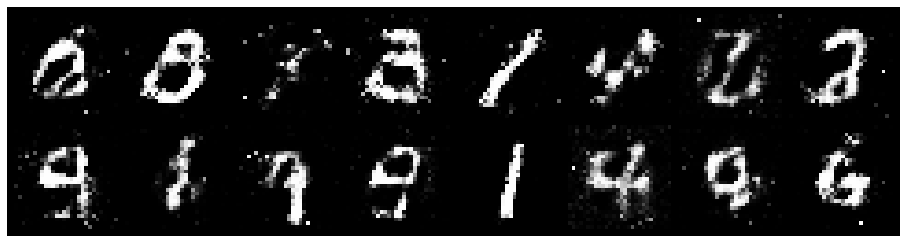

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 1.1188, Generator Loss: 1.3019
D(x): 0.5998, D(G(z)): 0.3534


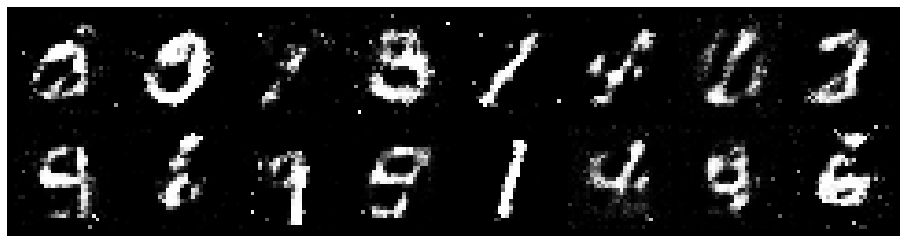

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.2087, Generator Loss: 1.2652
D(x): 0.6002, D(G(z)): 0.3870


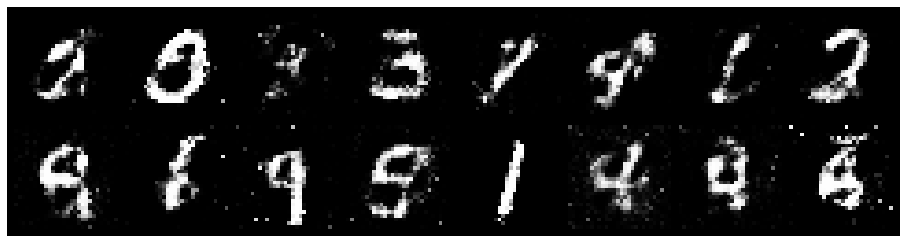

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 1.1196, Generator Loss: 1.1568
D(x): 0.6556, D(G(z)): 0.3964


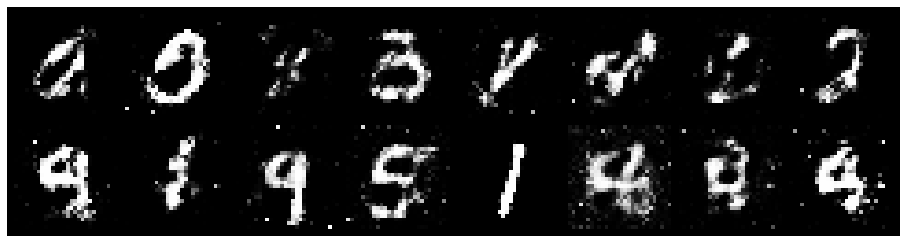

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0561, Generator Loss: 1.1178
D(x): 0.6238, D(G(z)): 0.3574


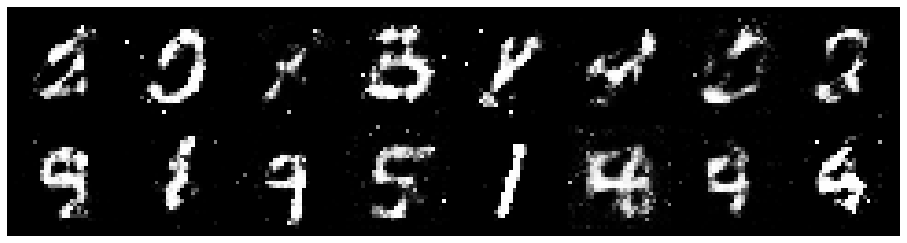

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0384, Generator Loss: 1.7263
D(x): 0.6684, D(G(z)): 0.3197


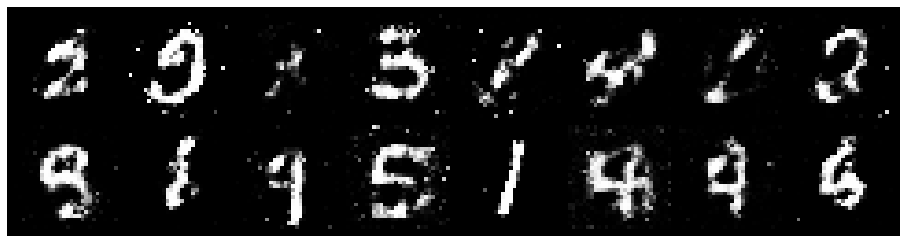

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.0002, Generator Loss: 1.7487
D(x): 0.6867, D(G(z)): 0.3114


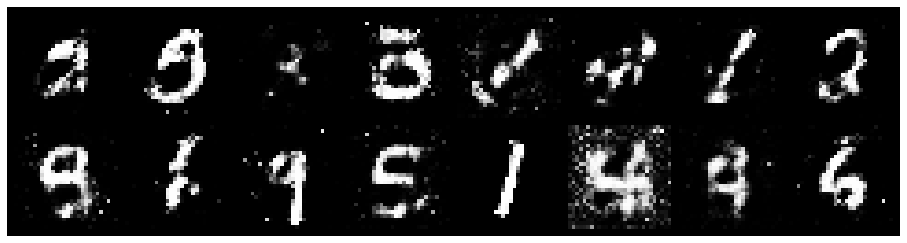

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.0160, Generator Loss: 1.4365
D(x): 0.6673, D(G(z)): 0.3475


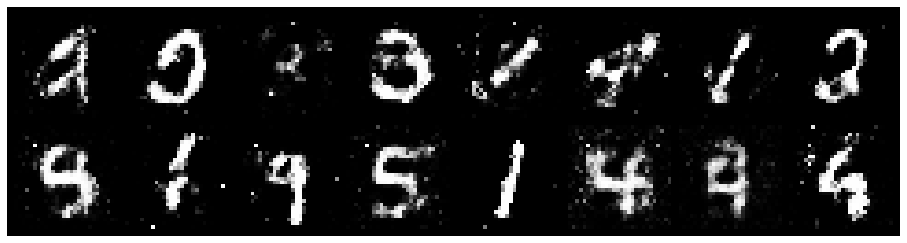

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.0213, Generator Loss: 1.5848
D(x): 0.5983, D(G(z)): 0.2778


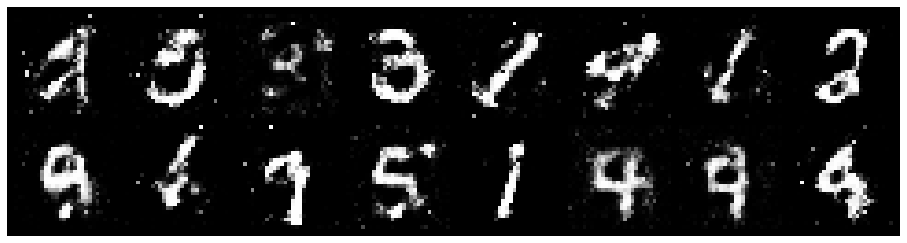

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 0.9964, Generator Loss: 1.2749
D(x): 0.6748, D(G(z)): 0.3419


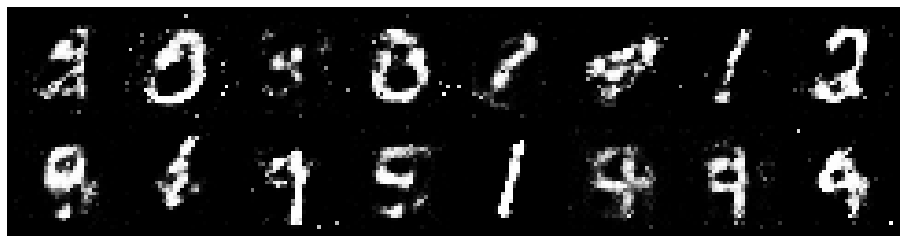

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.0595, Generator Loss: 1.3347
D(x): 0.6193, D(G(z)): 0.2866


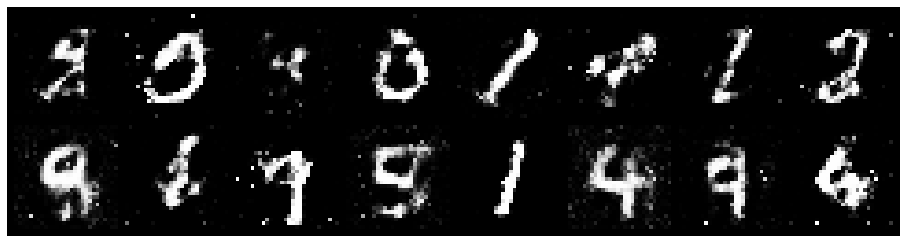

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.0428, Generator Loss: 1.2704
D(x): 0.6062, D(G(z)): 0.3081


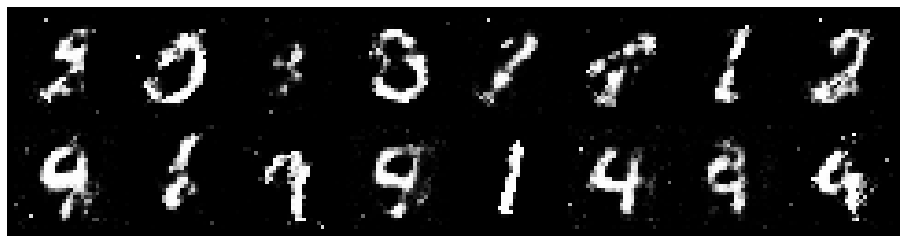

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.1340, Generator Loss: 1.1467
D(x): 0.6315, D(G(z)): 0.3738


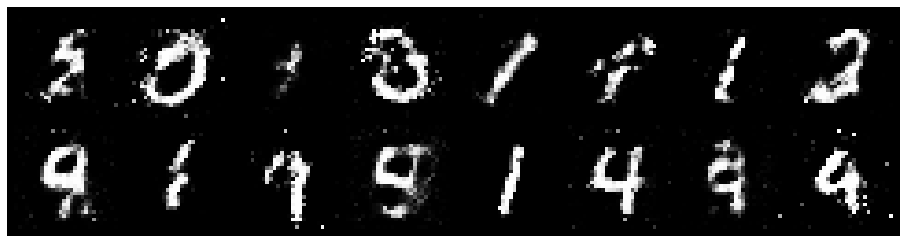

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.0338, Generator Loss: 1.0881
D(x): 0.6600, D(G(z)): 0.3694


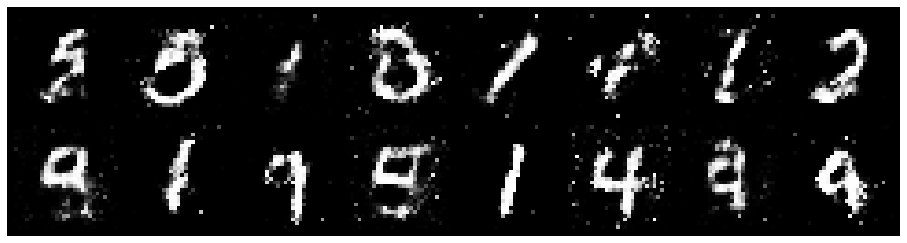

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9543, Generator Loss: 1.1132
D(x): 0.6309, D(G(z)): 0.3062


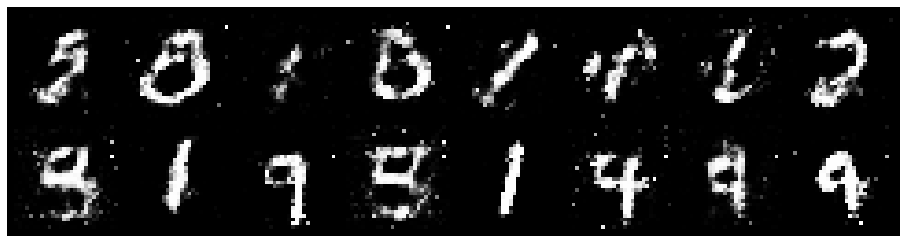

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.1918, Generator Loss: 1.2566
D(x): 0.6500, D(G(z)): 0.4312


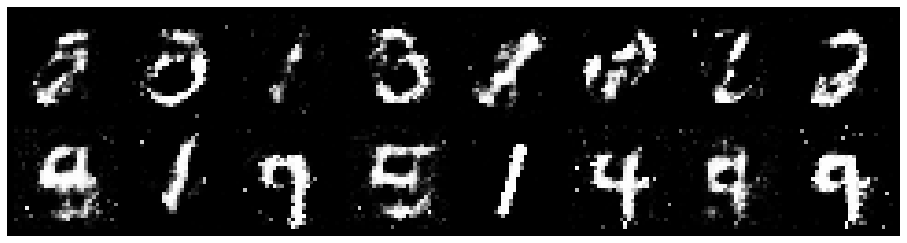

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.2044, Generator Loss: 1.2739
D(x): 0.6553, D(G(z)): 0.4163


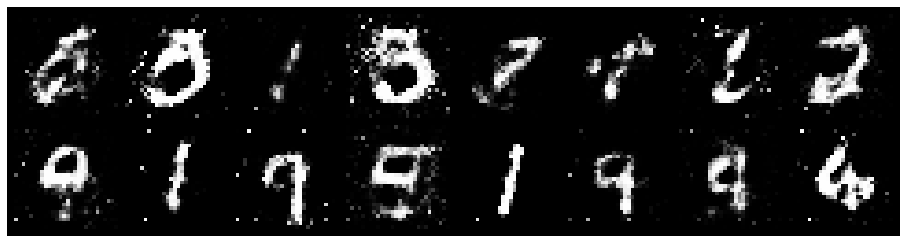

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.0850, Generator Loss: 1.0729
D(x): 0.5890, D(G(z)): 0.3587


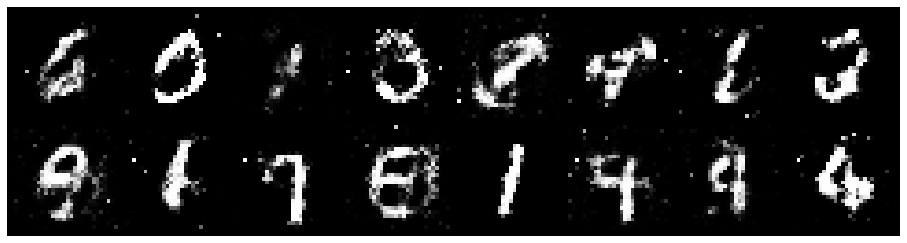

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0592, Generator Loss: 1.0351
D(x): 0.6790, D(G(z)): 0.4050


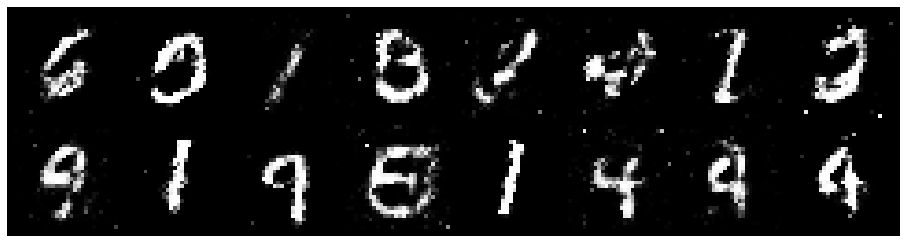

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 0.9234, Generator Loss: 1.3083
D(x): 0.6937, D(G(z)): 0.3438


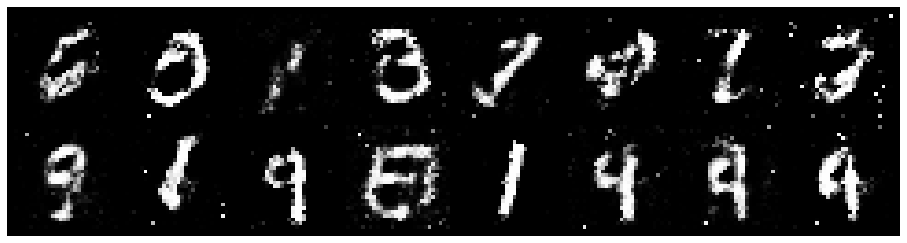

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0036, Generator Loss: 1.4268
D(x): 0.6625, D(G(z)): 0.3377


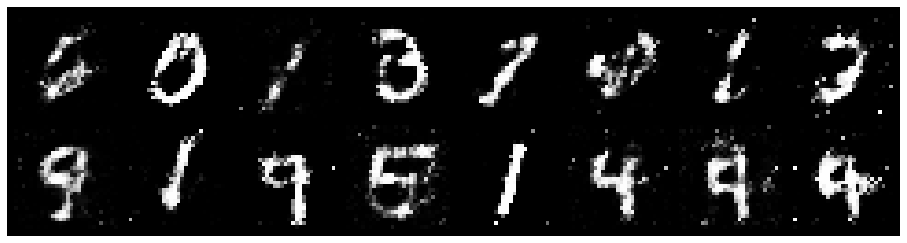

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 0.8616, Generator Loss: 1.5248
D(x): 0.7111, D(G(z)): 0.3239


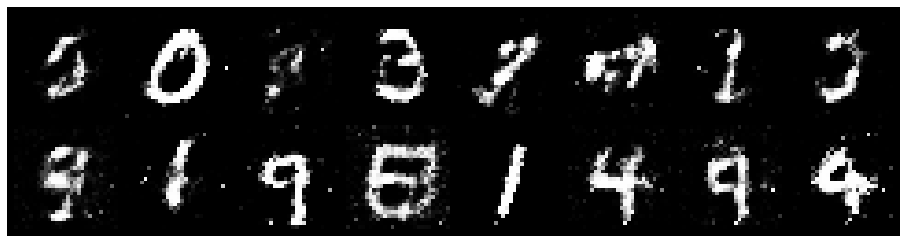

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 0.9416, Generator Loss: 1.5177
D(x): 0.6739, D(G(z)): 0.3169


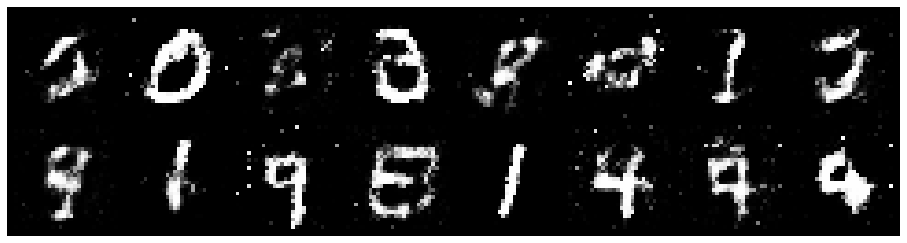

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.0987, Generator Loss: 1.0399
D(x): 0.6554, D(G(z)): 0.3982


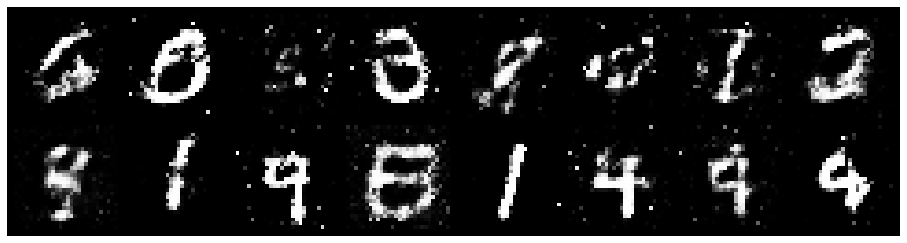

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.2111, Generator Loss: 1.2368
D(x): 0.6035, D(G(z)): 0.3917


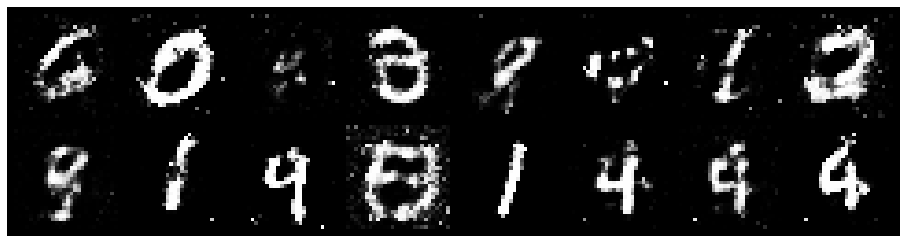

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0705, Generator Loss: 1.6829
D(x): 0.6555, D(G(z)): 0.3140


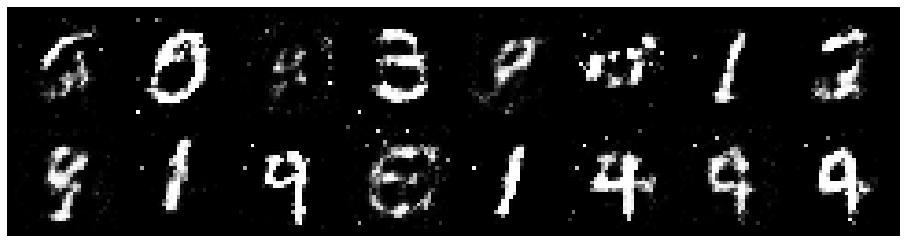

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0100, Generator Loss: 1.2078
D(x): 0.7316, D(G(z)): 0.3992


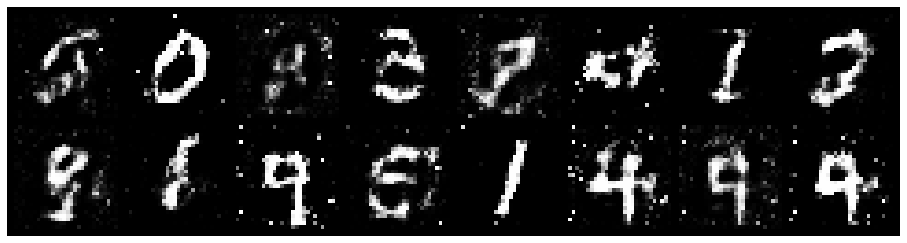

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 0.9971, Generator Loss: 1.2859
D(x): 0.6731, D(G(z)): 0.3411


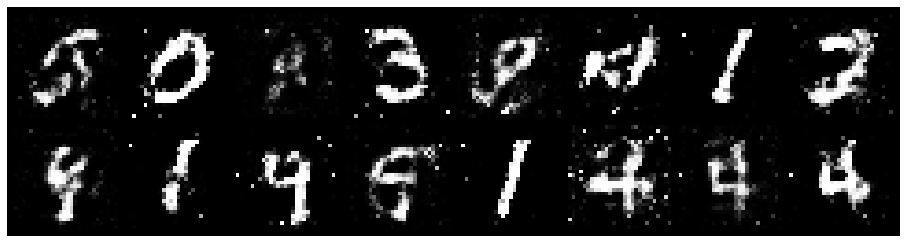

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.1407, Generator Loss: 1.1764
D(x): 0.6453, D(G(z)): 0.3918


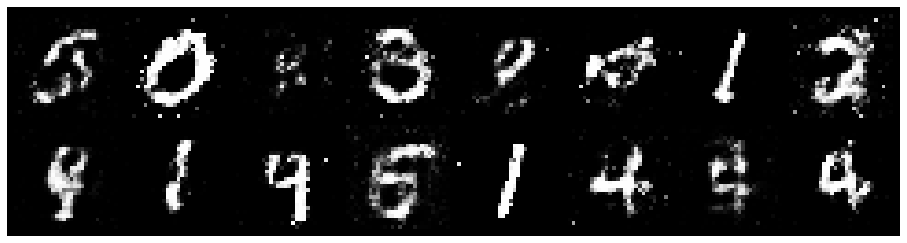

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.1659, Generator Loss: 1.1476
D(x): 0.6637, D(G(z)): 0.4169


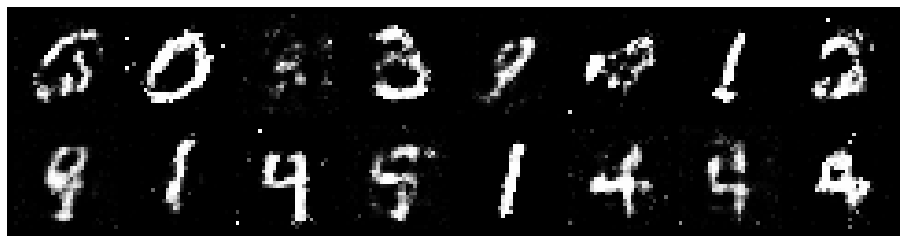

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.1758, Generator Loss: 1.0358
D(x): 0.5705, D(G(z)): 0.3847


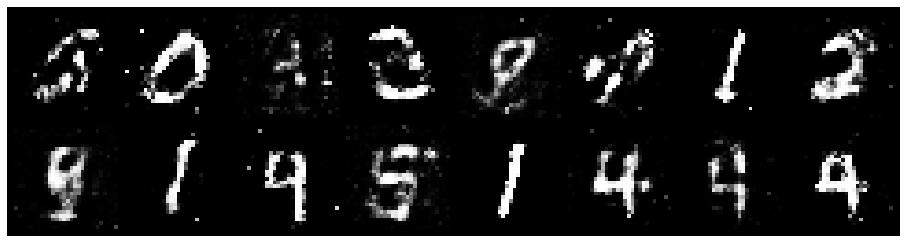

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.1576, Generator Loss: 1.0165
D(x): 0.6737, D(G(z)): 0.4473


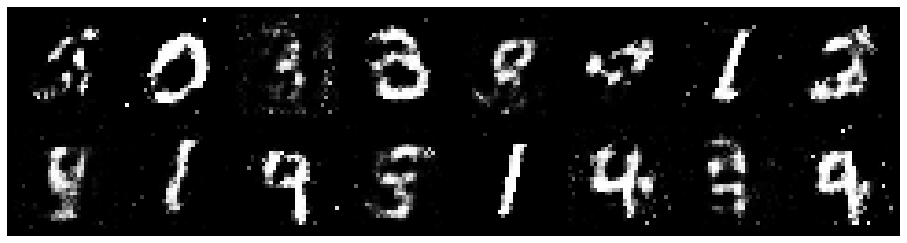

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.2713, Generator Loss: 1.3085
D(x): 0.5163, D(G(z)): 0.3650


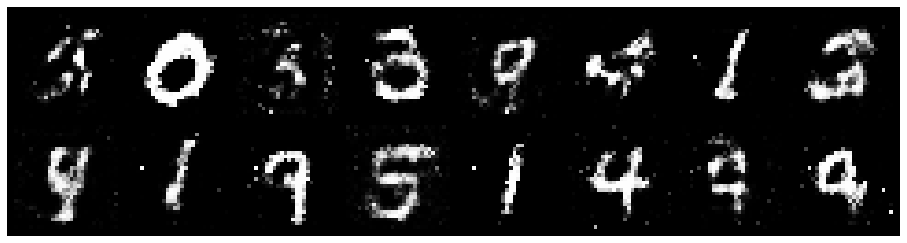

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1614, Generator Loss: 1.0614
D(x): 0.5868, D(G(z)): 0.3996


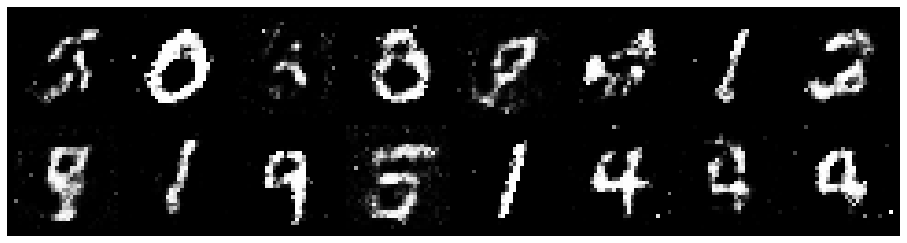

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.2345, Generator Loss: 1.2038
D(x): 0.6101, D(G(z)): 0.4046


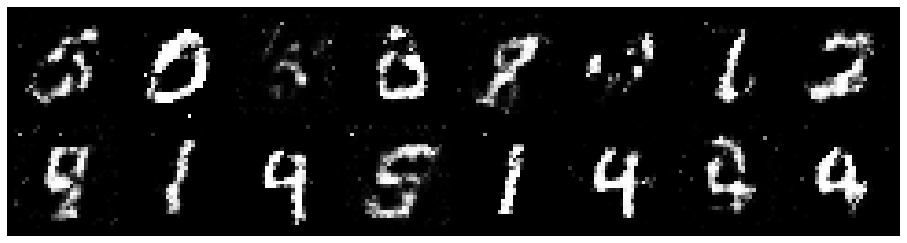

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.1577, Generator Loss: 1.0537
D(x): 0.5918, D(G(z)): 0.4011


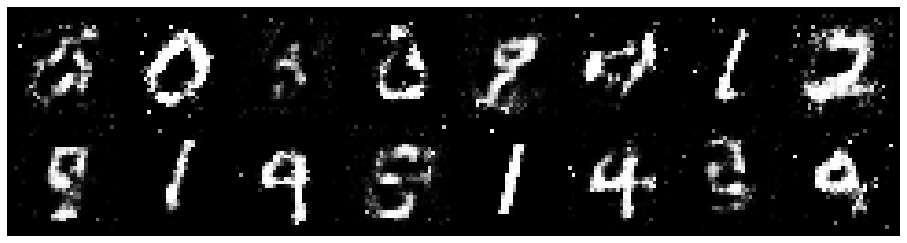

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.0643, Generator Loss: 1.0566
D(x): 0.6695, D(G(z)): 0.3922


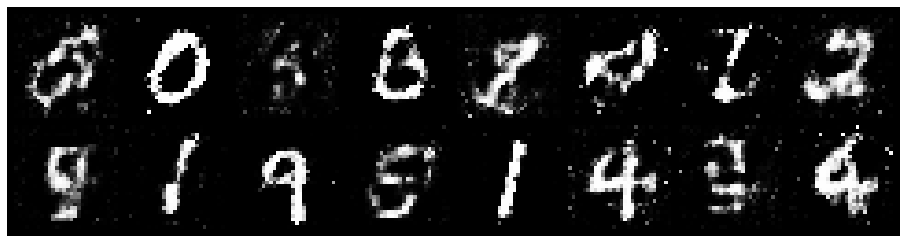

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.2514, Generator Loss: 1.0946
D(x): 0.6056, D(G(z)): 0.4410


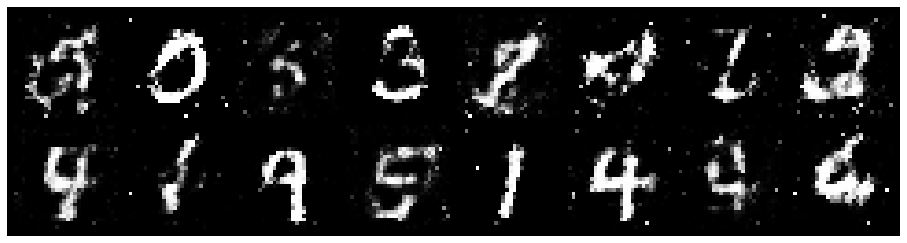

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.3378, Generator Loss: 1.1252
D(x): 0.5374, D(G(z)): 0.4042


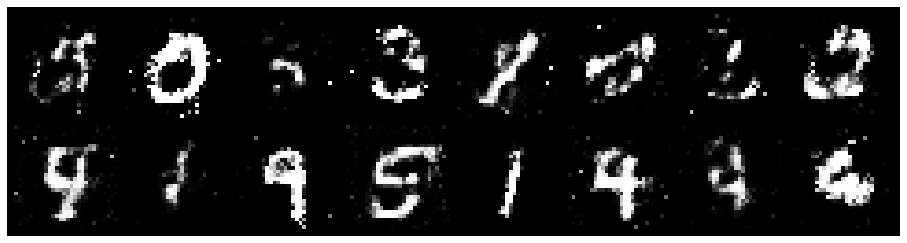

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.1470, Generator Loss: 1.0452
D(x): 0.5984, D(G(z)): 0.3715


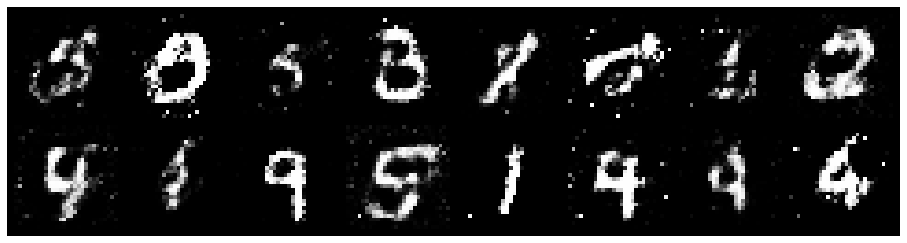

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0672, Generator Loss: 1.3121
D(x): 0.6500, D(G(z)): 0.3728


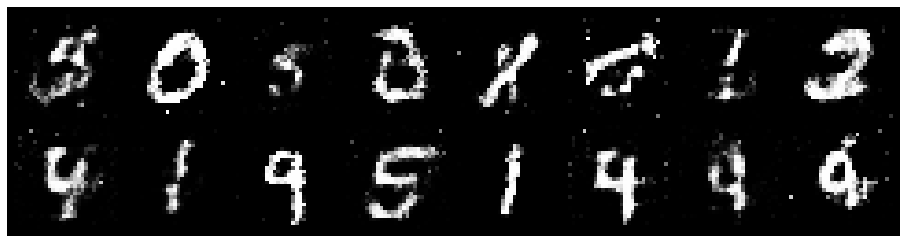

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0532, Generator Loss: 1.3163
D(x): 0.6149, D(G(z)): 0.3498


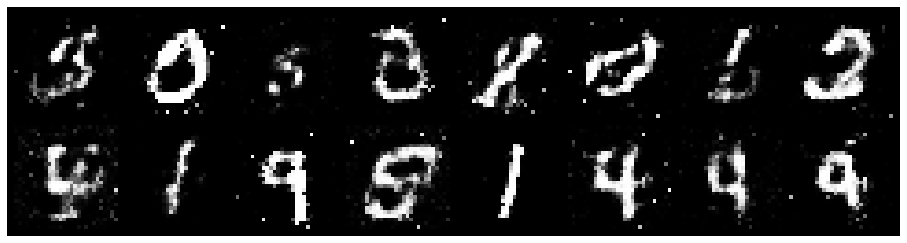

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.2366, Generator Loss: 1.2968
D(x): 0.5918, D(G(z)): 0.3825


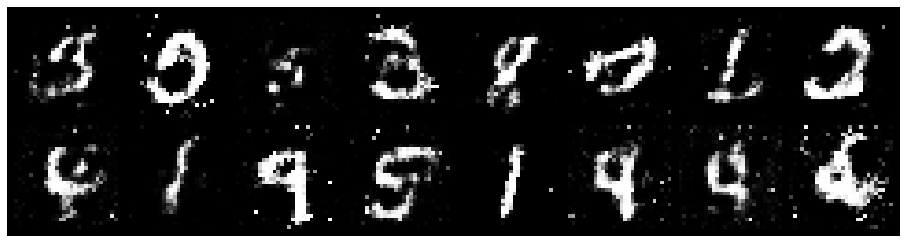

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1710, Generator Loss: 1.0094
D(x): 0.6610, D(G(z)): 0.4144


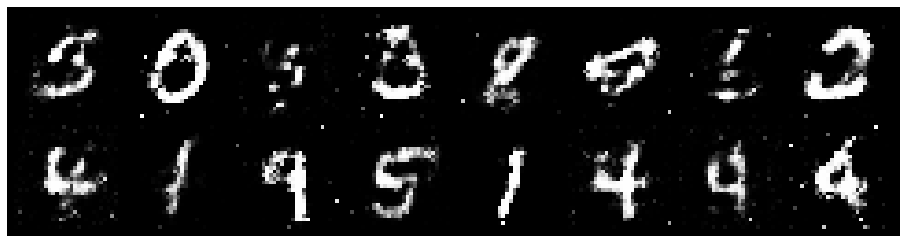

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0074, Generator Loss: 1.3952
D(x): 0.6485, D(G(z)): 0.3480


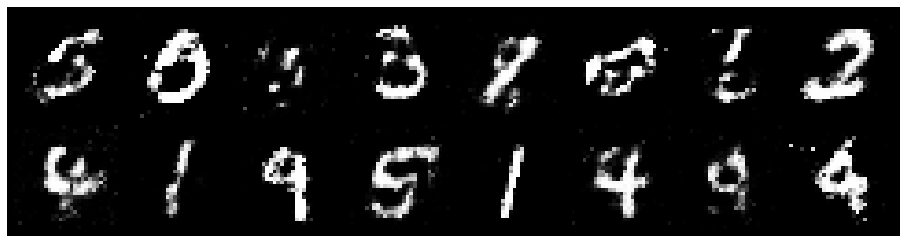

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.2638, Generator Loss: 0.9054
D(x): 0.5754, D(G(z)): 0.3812


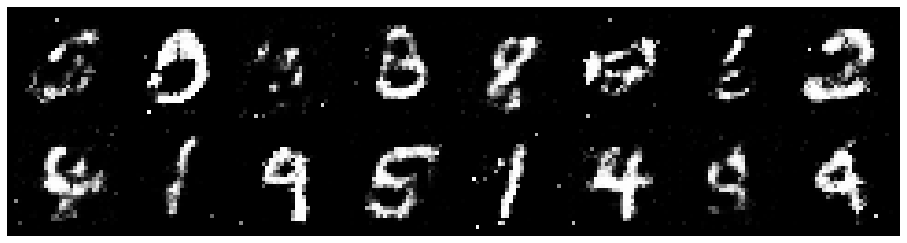

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.1799, Generator Loss: 0.8961
D(x): 0.6485, D(G(z)): 0.4638


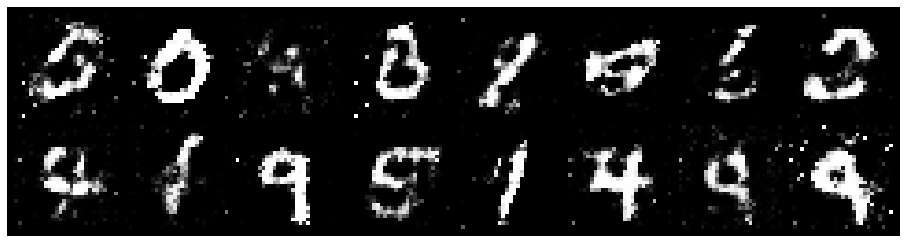

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1155, Generator Loss: 1.1274
D(x): 0.6396, D(G(z)): 0.4007


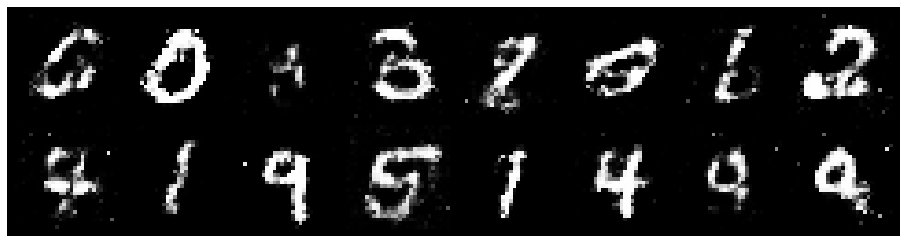

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.1263, Generator Loss: 1.1350
D(x): 0.5834, D(G(z)): 0.3562


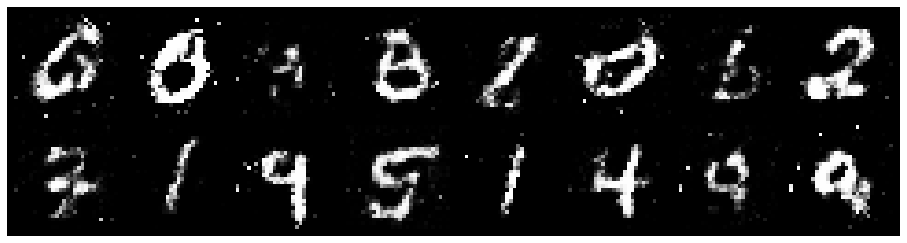

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.2581, Generator Loss: 0.9269
D(x): 0.5790, D(G(z)): 0.4425


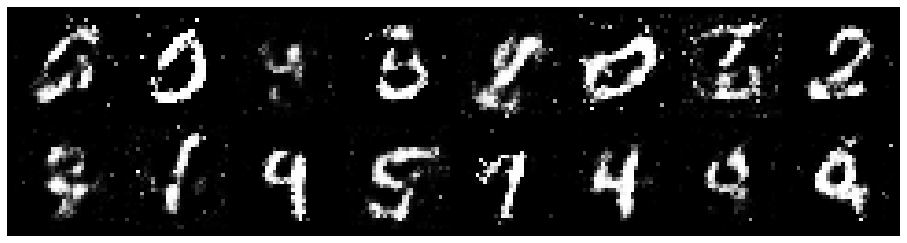

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.3285, Generator Loss: 1.2172
D(x): 0.5270, D(G(z)): 0.3849


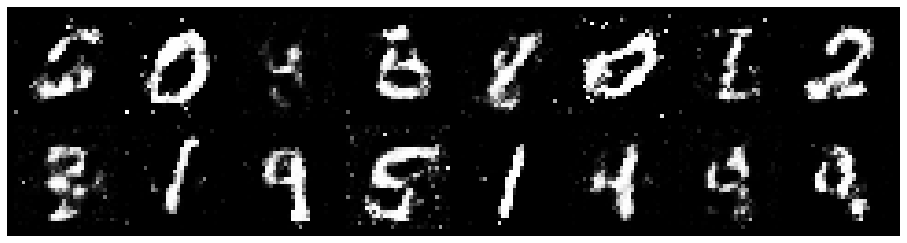

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.2139, Generator Loss: 1.0322
D(x): 0.5916, D(G(z)): 0.4143


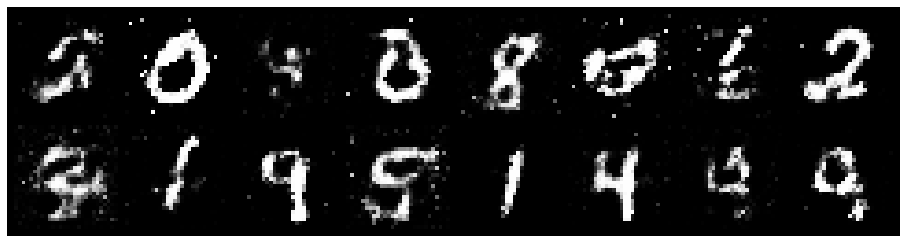

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.2340, Generator Loss: 0.9012
D(x): 0.6821, D(G(z)): 0.4906


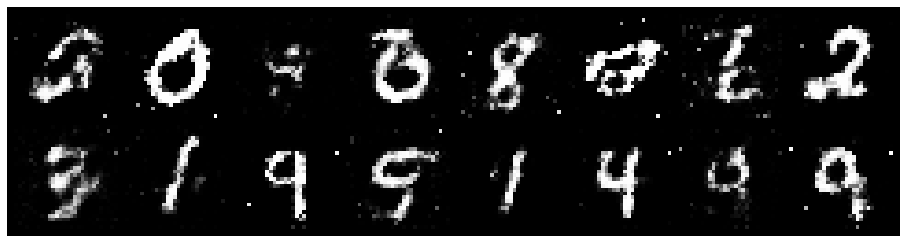

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.1367, Generator Loss: 0.9176
D(x): 0.5700, D(G(z)): 0.3792


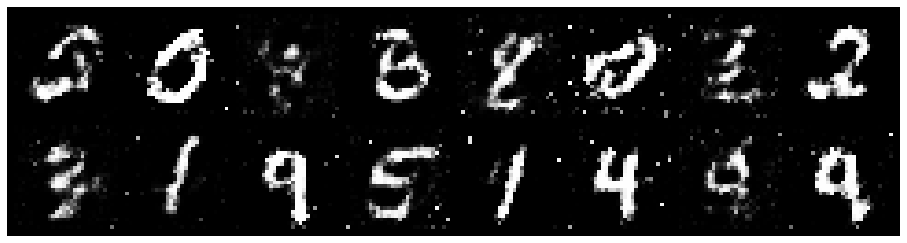

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.0778, Generator Loss: 1.0996
D(x): 0.6331, D(G(z)): 0.3741


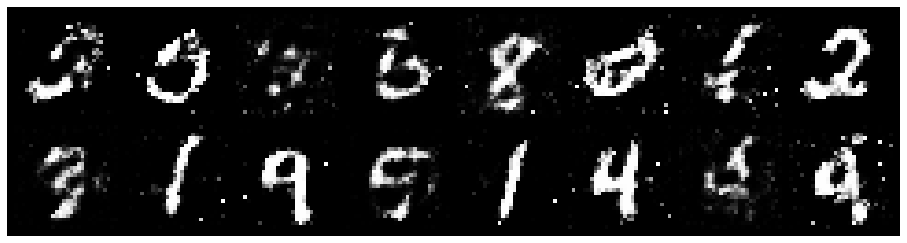

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1615, Generator Loss: 1.1311
D(x): 0.5904, D(G(z)): 0.3762


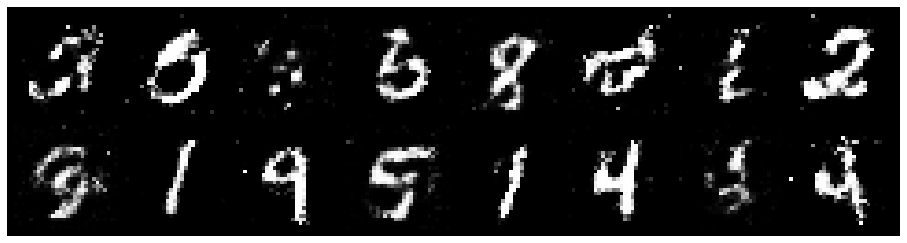

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 0.9837, Generator Loss: 1.0889
D(x): 0.6868, D(G(z)): 0.3972


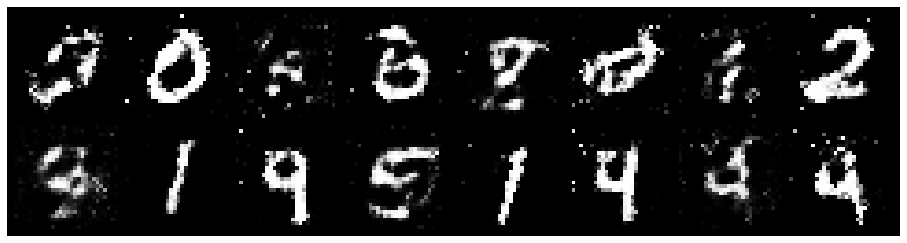

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.0298, Generator Loss: 1.0902
D(x): 0.6827, D(G(z)): 0.4039


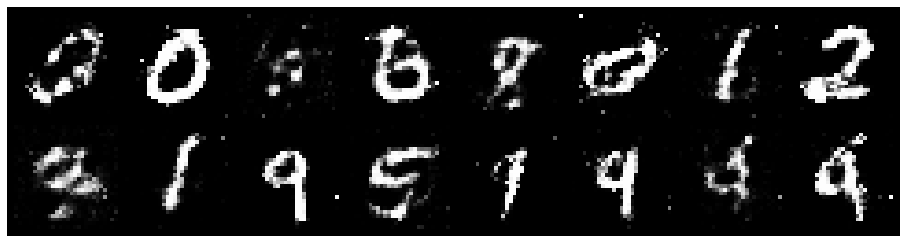

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.1268, Generator Loss: 1.1263
D(x): 0.5977, D(G(z)): 0.3517


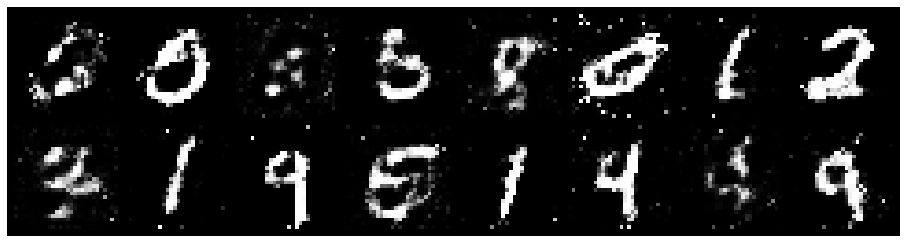

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1958, Generator Loss: 0.9388
D(x): 0.6008, D(G(z)): 0.4173


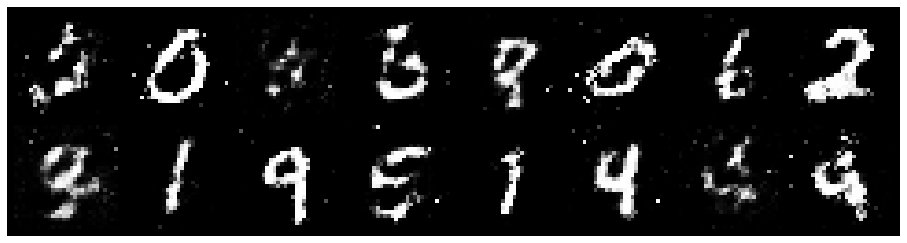

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.1879, Generator Loss: 1.1769
D(x): 0.5617, D(G(z)): 0.3806


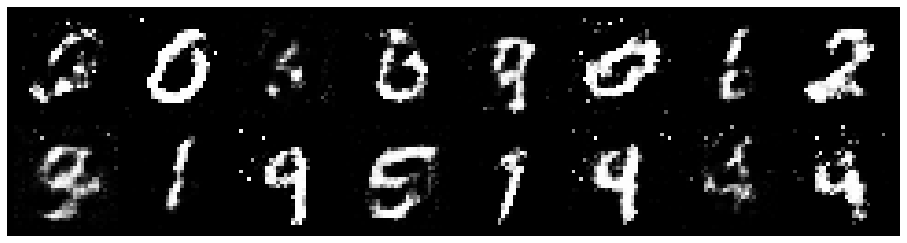

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.0231, Generator Loss: 1.2602
D(x): 0.6260, D(G(z)): 0.3163


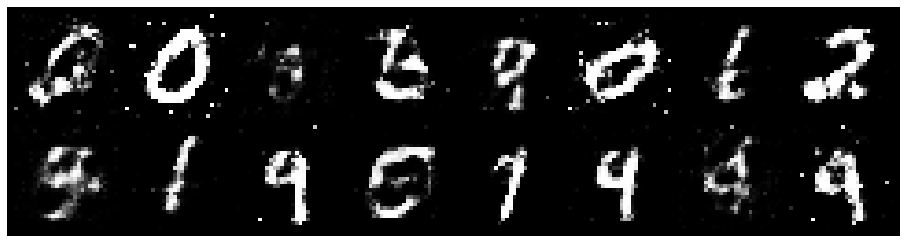

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 0.9841, Generator Loss: 1.2413
D(x): 0.6439, D(G(z)): 0.3190


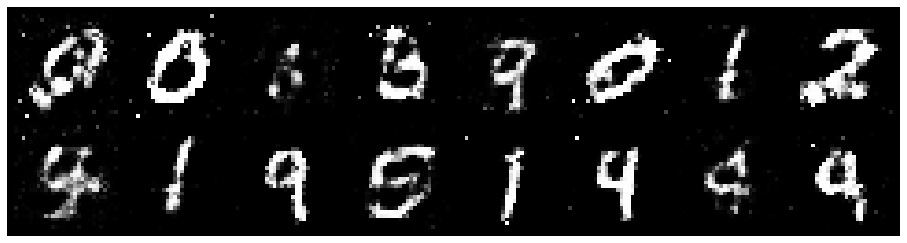

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.0793, Generator Loss: 1.7895
D(x): 0.5788, D(G(z)): 0.2845


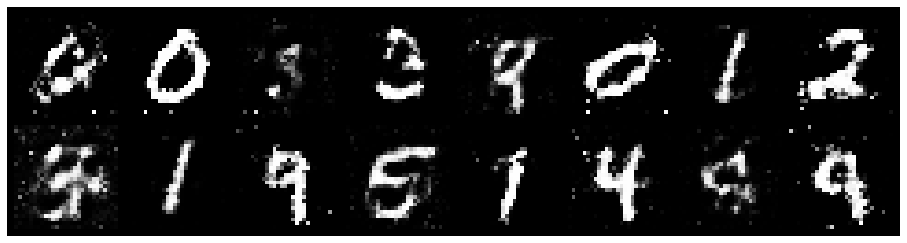

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.0647, Generator Loss: 1.2398
D(x): 0.7054, D(G(z)): 0.4320


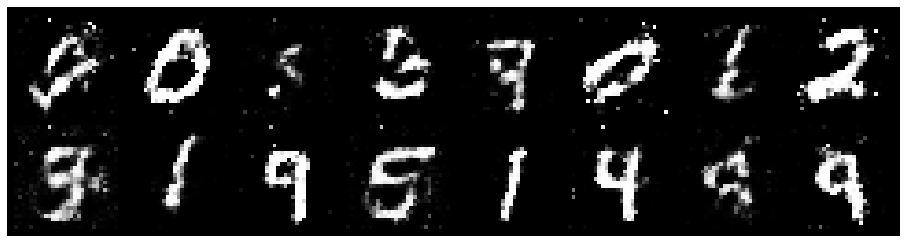

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1392, Generator Loss: 0.9920
D(x): 0.6456, D(G(z)): 0.4131


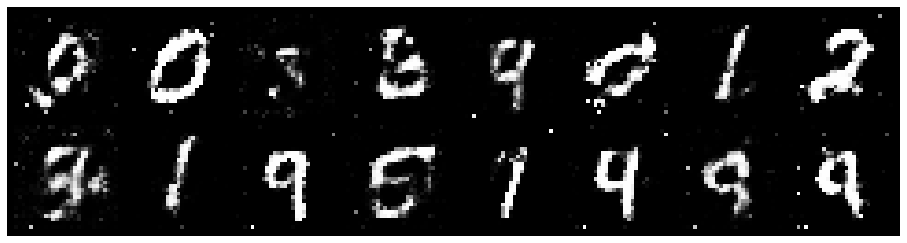

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.1817, Generator Loss: 1.0111
D(x): 0.5279, D(G(z)): 0.3569


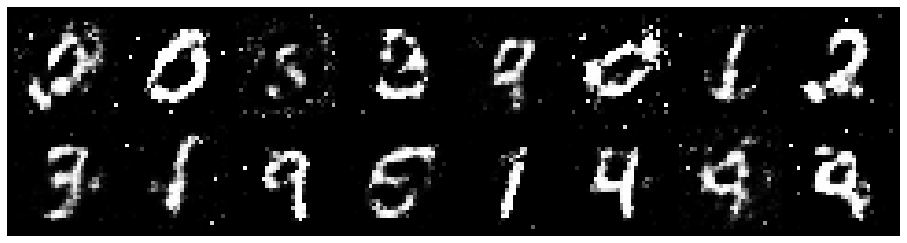

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2339, Generator Loss: 0.9587
D(x): 0.6063, D(G(z)): 0.4417


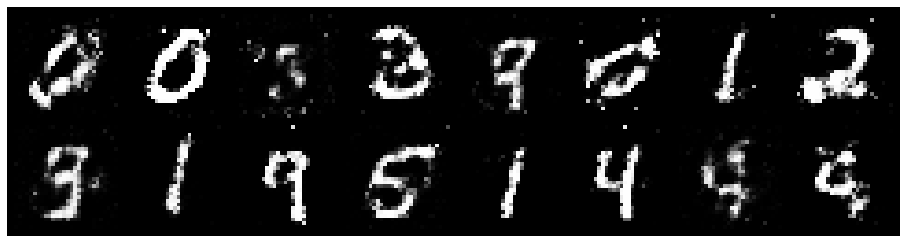

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.2916, Generator Loss: 1.1155
D(x): 0.5329, D(G(z)): 0.3911


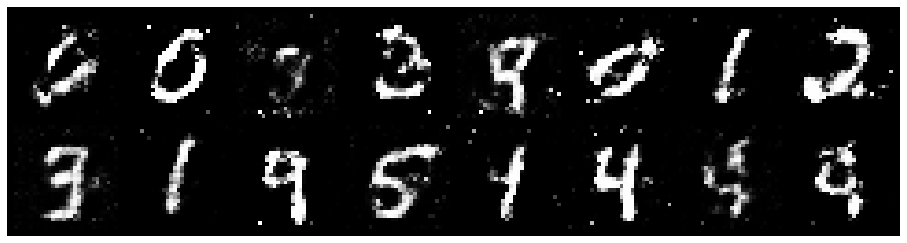

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.0707, Generator Loss: 1.1779
D(x): 0.5994, D(G(z)): 0.3554


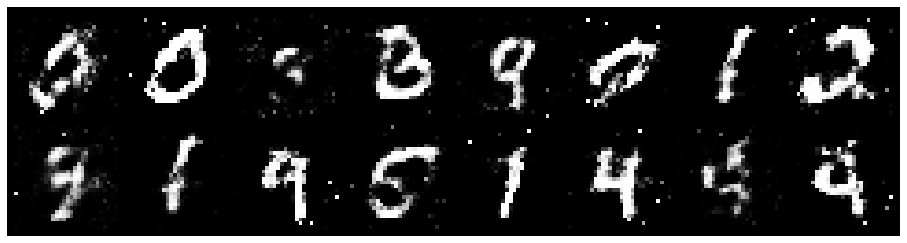

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0886, Generator Loss: 1.2685
D(x): 0.6047, D(G(z)): 0.3662


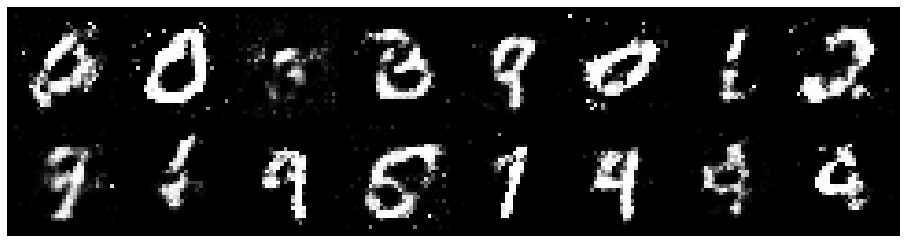

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 0.9737, Generator Loss: 1.2551
D(x): 0.6263, D(G(z)): 0.3158


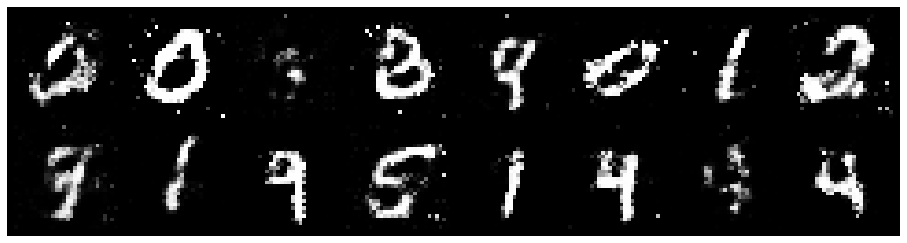

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.1193, Generator Loss: 1.0376
D(x): 0.6720, D(G(z)): 0.4664


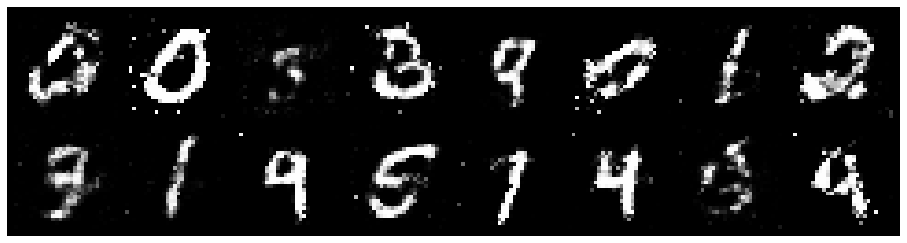

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.0640, Generator Loss: 1.2821
D(x): 0.6438, D(G(z)): 0.3619


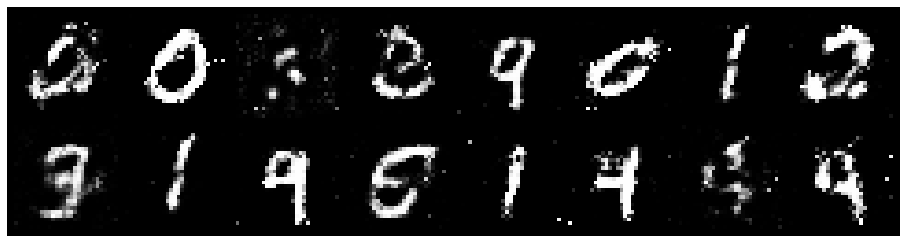

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.0193, Generator Loss: 1.2974
D(x): 0.6515, D(G(z)): 0.3581


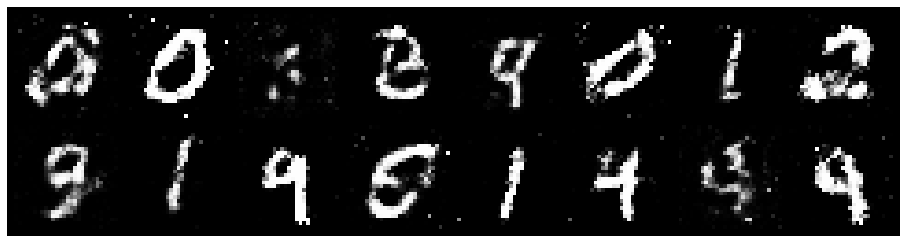

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.0555, Generator Loss: 1.0442
D(x): 0.6379, D(G(z)): 0.3954


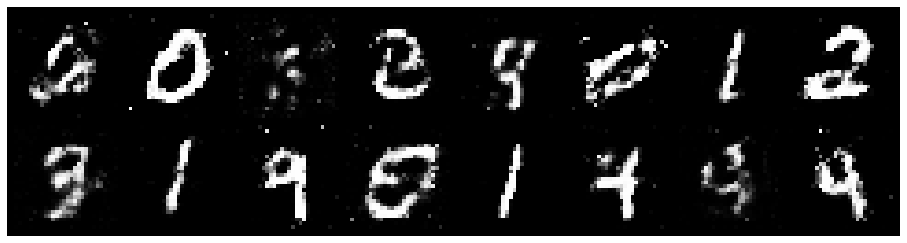

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.2398, Generator Loss: 0.9489
D(x): 0.6153, D(G(z)): 0.4614


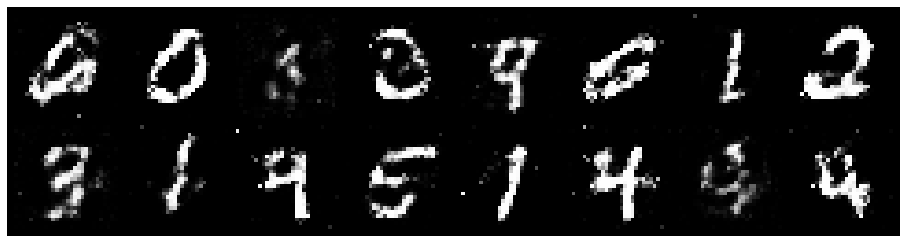

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.2074, Generator Loss: 0.8880
D(x): 0.6050, D(G(z)): 0.4427


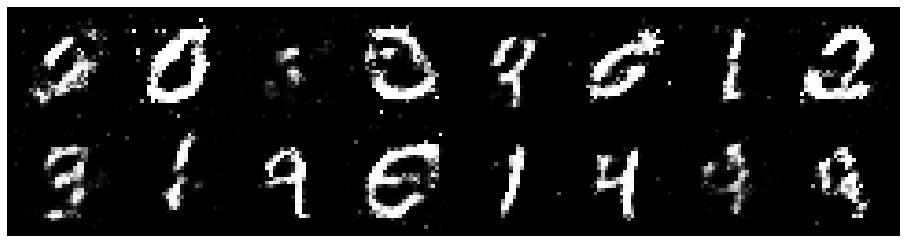

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1699, Generator Loss: 1.0174
D(x): 0.6034, D(G(z)): 0.4181


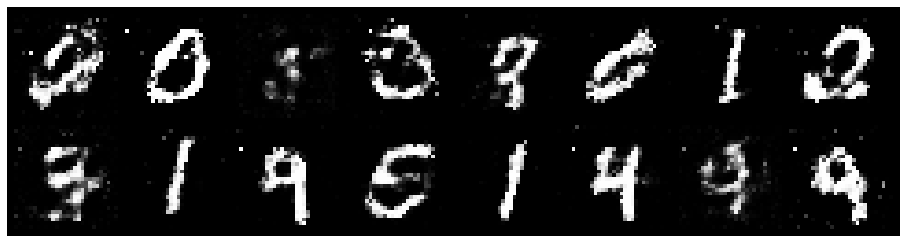

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.1881, Generator Loss: 1.0037
D(x): 0.5537, D(G(z)): 0.3952


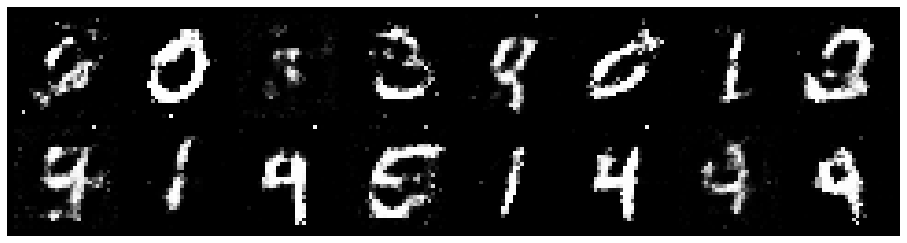

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.1091, Generator Loss: 1.0394
D(x): 0.6186, D(G(z)): 0.3951


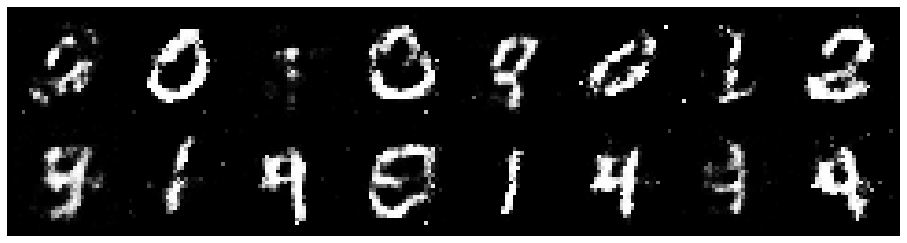

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.1305, Generator Loss: 1.1402
D(x): 0.6126, D(G(z)): 0.3878


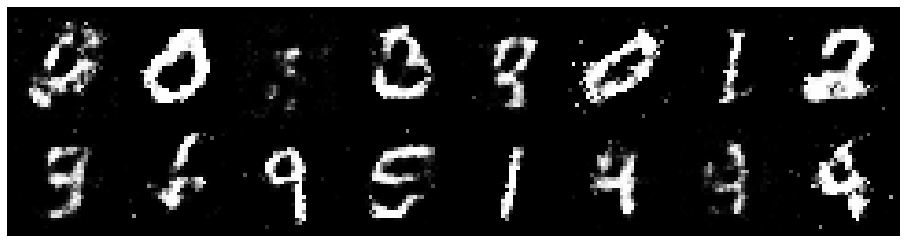

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 0.9978, Generator Loss: 1.3154
D(x): 0.6672, D(G(z)): 0.3605


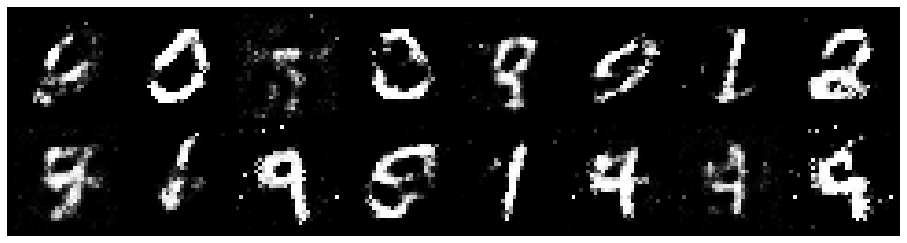

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 0.9767, Generator Loss: 1.3273
D(x): 0.6530, D(G(z)): 0.3449


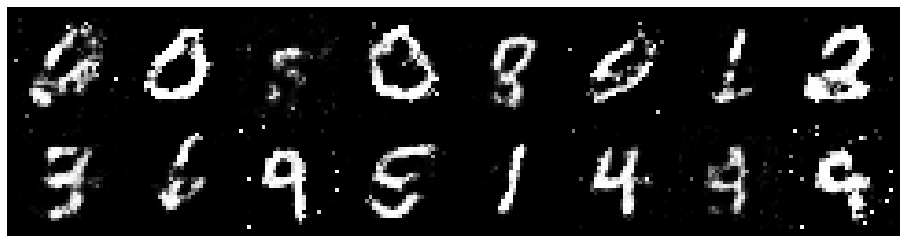

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.1771, Generator Loss: 1.2608
D(x): 0.5975, D(G(z)): 0.3810


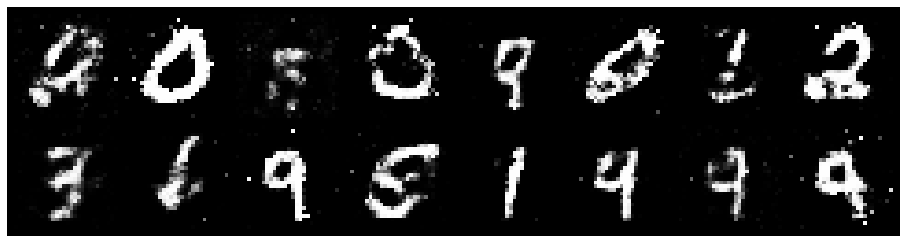

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.0093, Generator Loss: 1.1377
D(x): 0.6667, D(G(z)): 0.3766


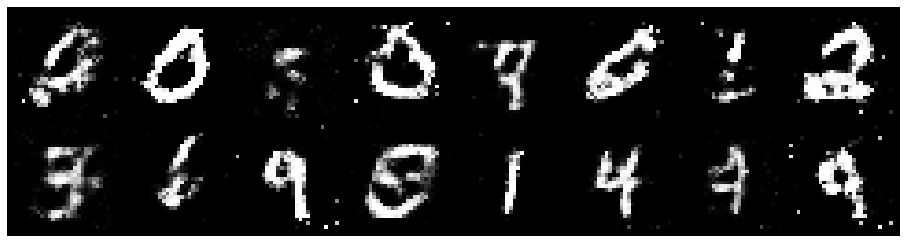

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.0466, Generator Loss: 1.4126
D(x): 0.6368, D(G(z)): 0.3410


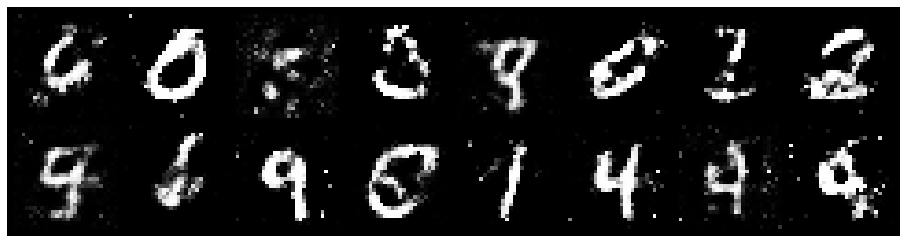

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.1073, Generator Loss: 1.2079
D(x): 0.5948, D(G(z)): 0.3790


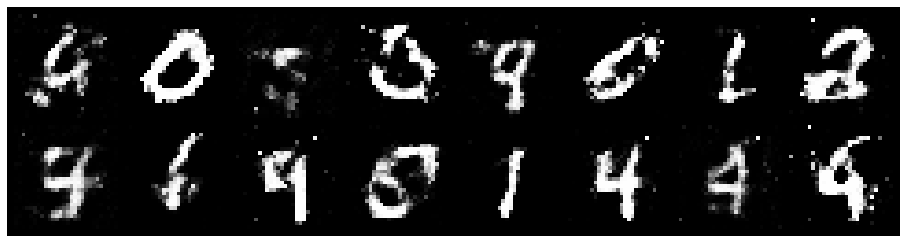

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.1930, Generator Loss: 1.3874
D(x): 0.5698, D(G(z)): 0.3375


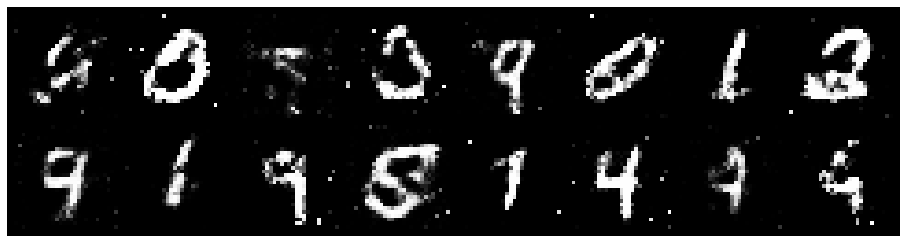

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.0398, Generator Loss: 1.2152
D(x): 0.6223, D(G(z)): 0.3439


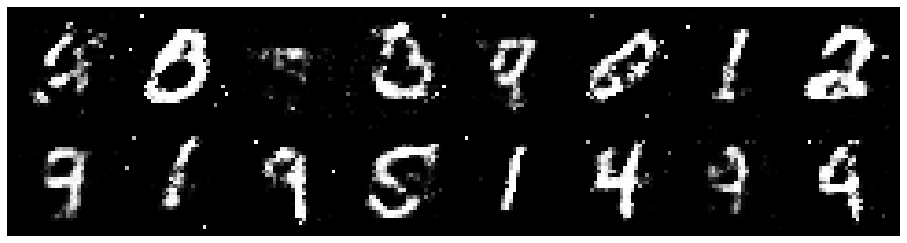

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.1225, Generator Loss: 1.5049
D(x): 0.6274, D(G(z)): 0.3333


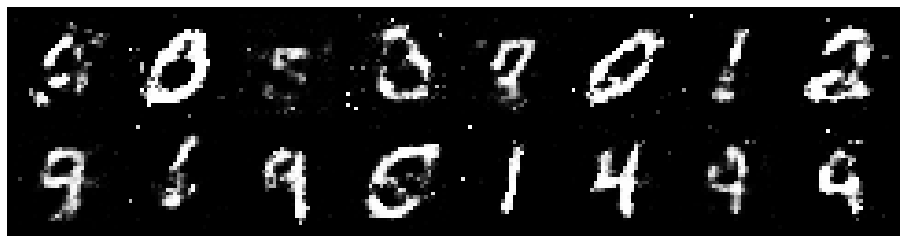

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.0650, Generator Loss: 1.2747
D(x): 0.6142, D(G(z)): 0.3407


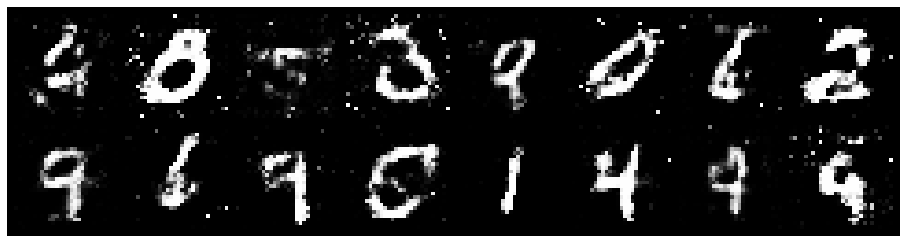

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.3880, Generator Loss: 0.9194
D(x): 0.5521, D(G(z)): 0.4319


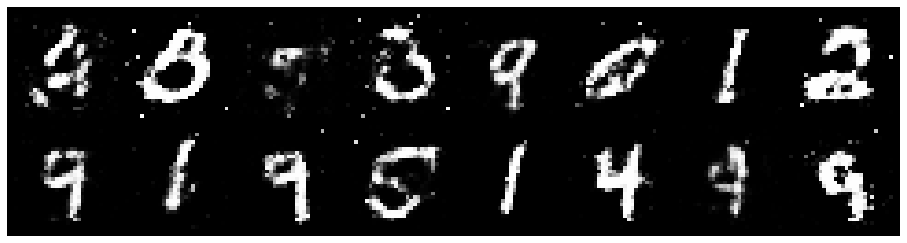

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.4276, Generator Loss: 1.0348
D(x): 0.5261, D(G(z)): 0.4325


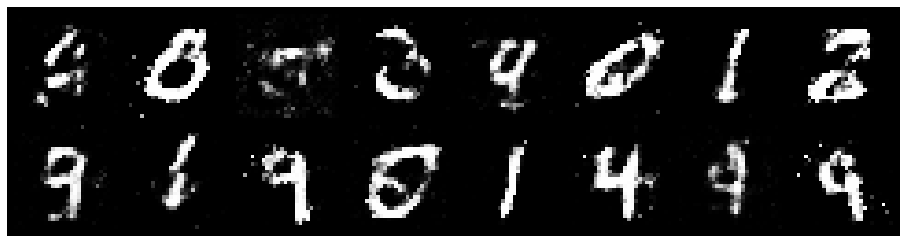

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.1703, Generator Loss: 0.9114
D(x): 0.6485, D(G(z)): 0.4235


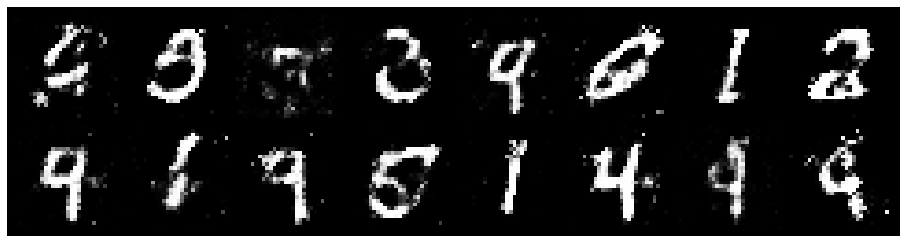

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2731, Generator Loss: 1.0056
D(x): 0.5687, D(G(z)): 0.4246


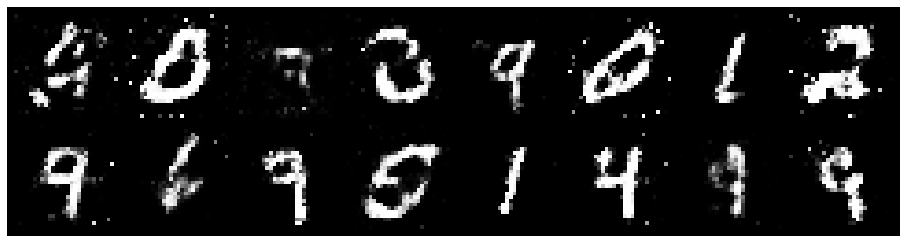

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.1179, Generator Loss: 1.1230
D(x): 0.5752, D(G(z)): 0.3605


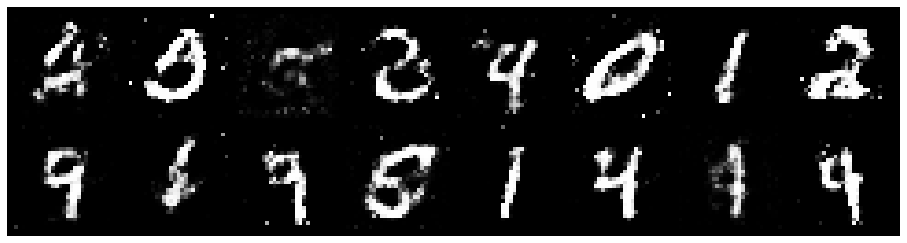

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.2130, Generator Loss: 0.9275
D(x): 0.5603, D(G(z)): 0.4002


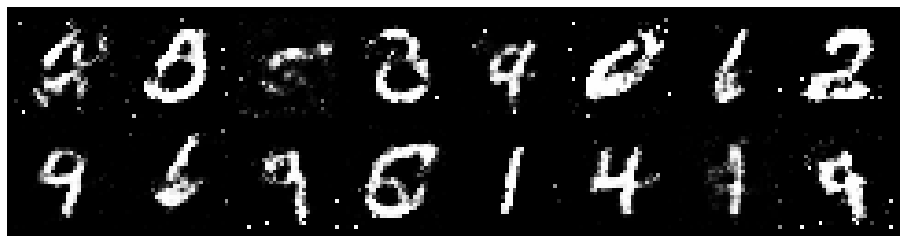

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.3148, Generator Loss: 1.0342
D(x): 0.5186, D(G(z)): 0.3900


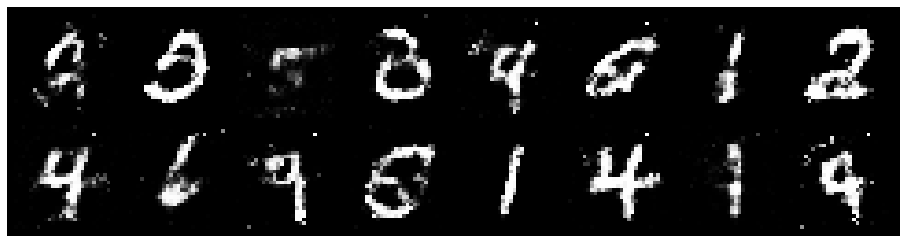

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.2037, Generator Loss: 0.9738
D(x): 0.6431, D(G(z)): 0.4716


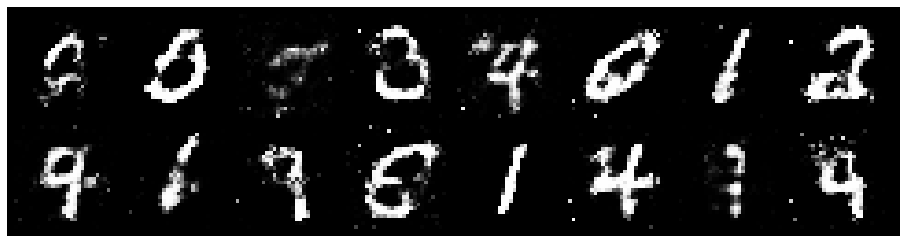

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.2118, Generator Loss: 1.0434
D(x): 0.6251, D(G(z)): 0.4542


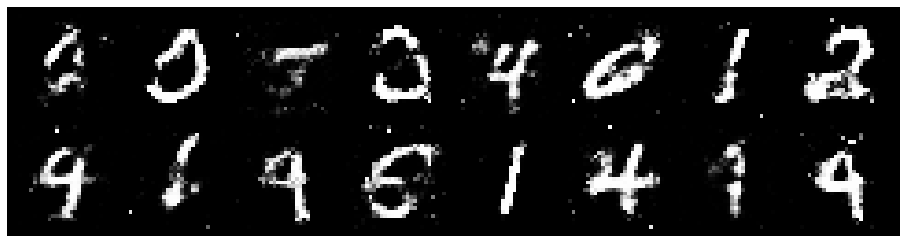

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.1767, Generator Loss: 0.9092
D(x): 0.6114, D(G(z)): 0.4290


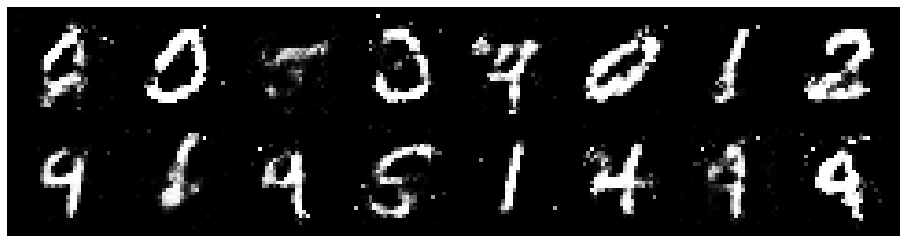

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.2919, Generator Loss: 1.1097
D(x): 0.5389, D(G(z)): 0.4108


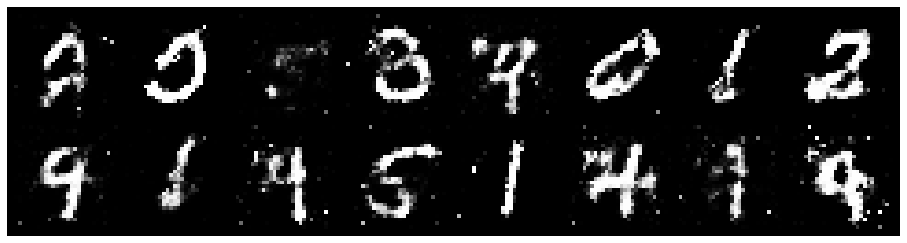

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.0789, Generator Loss: 1.0109
D(x): 0.6014, D(G(z)): 0.3690


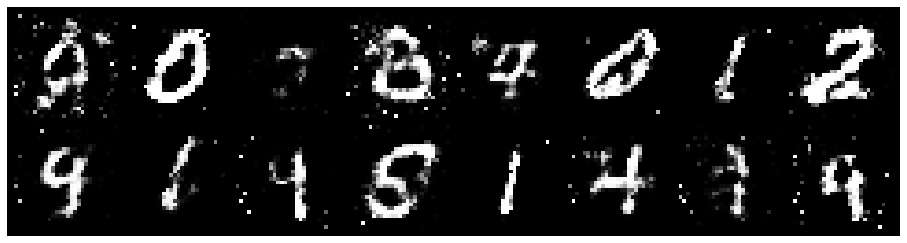

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.1753, Generator Loss: 0.9687
D(x): 0.6021, D(G(z)): 0.4164


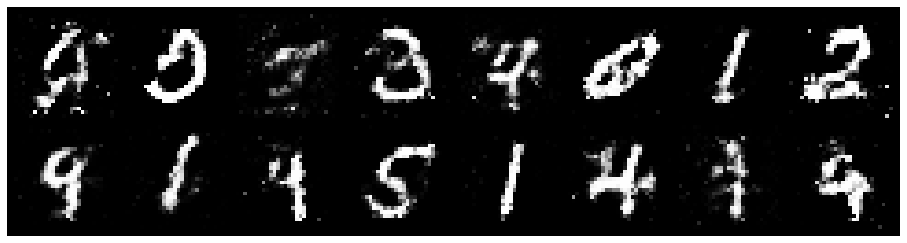

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.0363, Generator Loss: 0.9136
D(x): 0.6258, D(G(z)): 0.3846


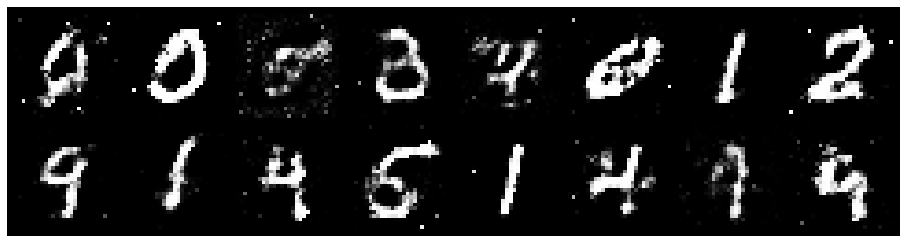

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 0.8530, Generator Loss: 1.1350
D(x): 0.6743, D(G(z)): 0.3186


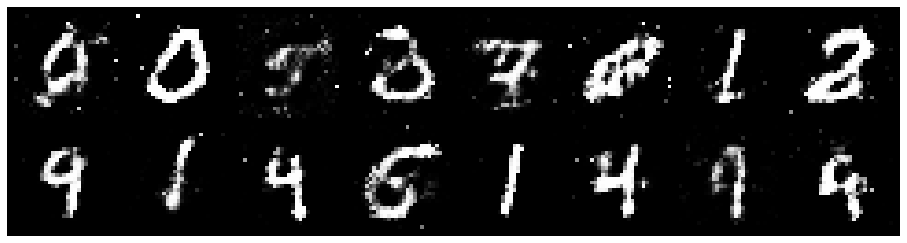

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.0339, Generator Loss: 1.5530
D(x): 0.6231, D(G(z)): 0.2976


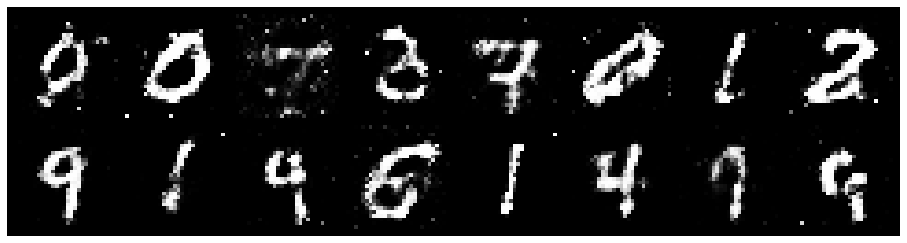

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 0.9729, Generator Loss: 1.3751
D(x): 0.6114, D(G(z)): 0.2910


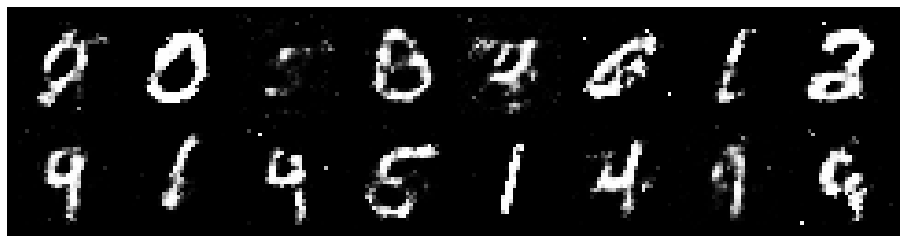

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.0724, Generator Loss: 0.9958
D(x): 0.6262, D(G(z)): 0.4039


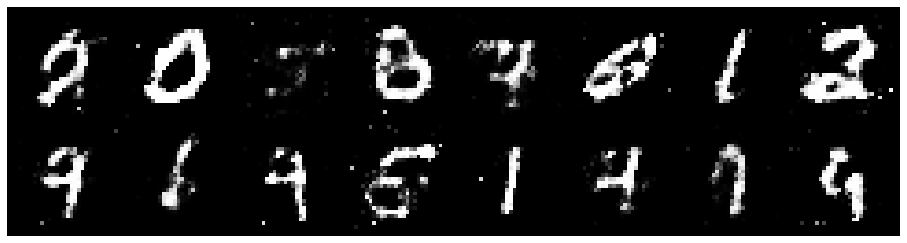

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.1267, Generator Loss: 1.0650
D(x): 0.5879, D(G(z)): 0.3806


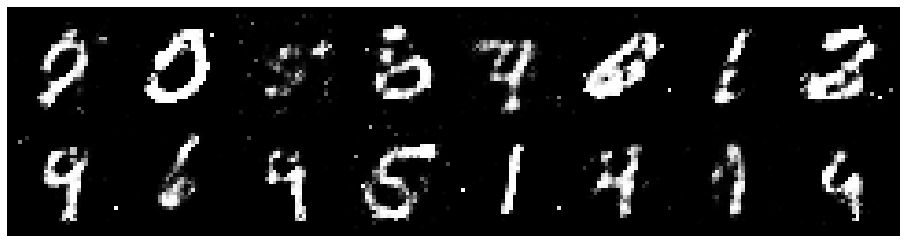

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.0771, Generator Loss: 1.2077
D(x): 0.6501, D(G(z)): 0.4077


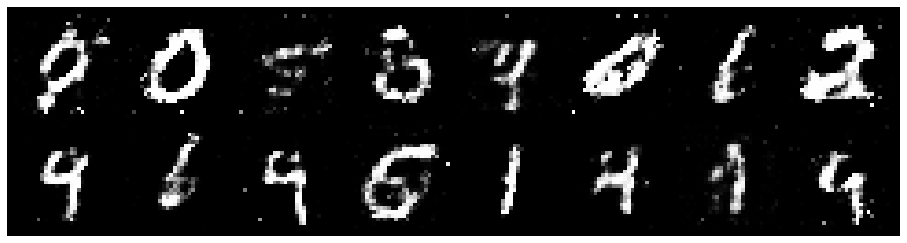

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1275, Generator Loss: 1.0978
D(x): 0.5979, D(G(z)): 0.3754


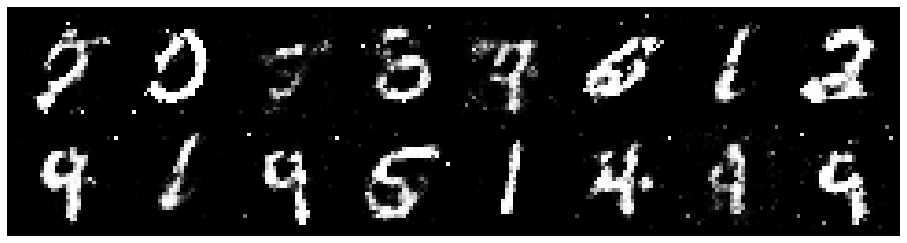

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.1875, Generator Loss: 1.0540
D(x): 0.5788, D(G(z)): 0.3817


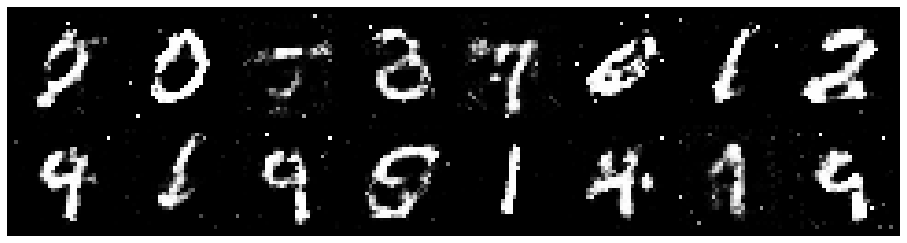

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.0137, Generator Loss: 1.1479
D(x): 0.6328, D(G(z)): 0.3503


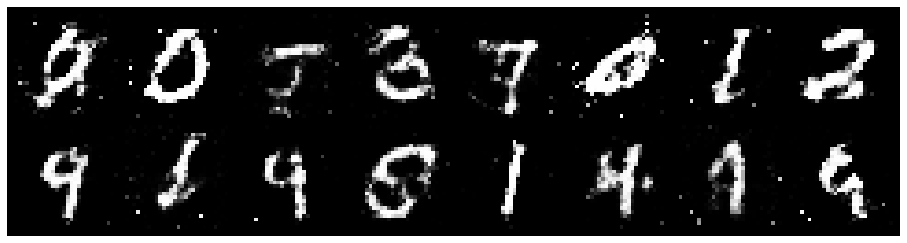

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1780, Generator Loss: 1.0733
D(x): 0.6259, D(G(z)): 0.3855


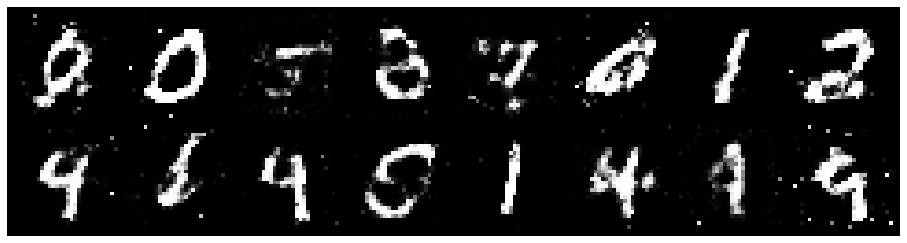

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.3771, Generator Loss: 1.0529
D(x): 0.5021, D(G(z)): 0.3691


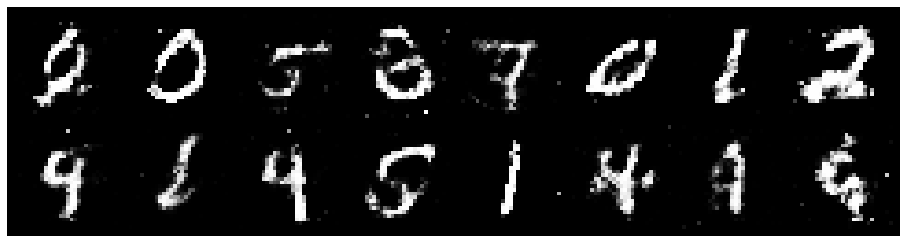

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.2025, Generator Loss: 1.1319
D(x): 0.5824, D(G(z)): 0.4099


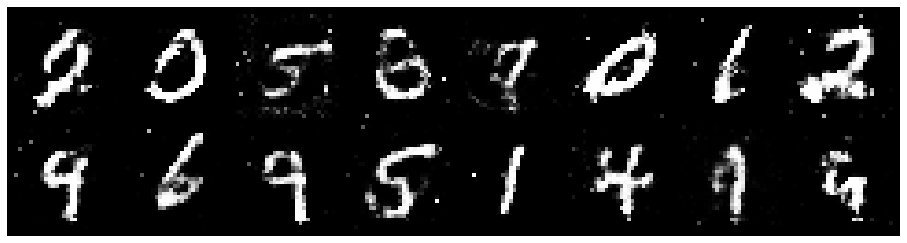

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.2308, Generator Loss: 0.8761
D(x): 0.6245, D(G(z)): 0.4522


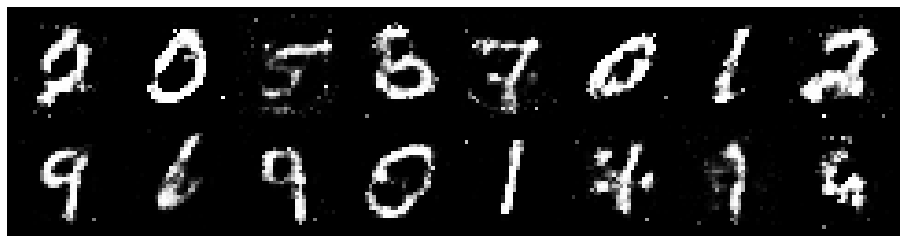

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1761, Generator Loss: 1.1737
D(x): 0.5947, D(G(z)): 0.3867


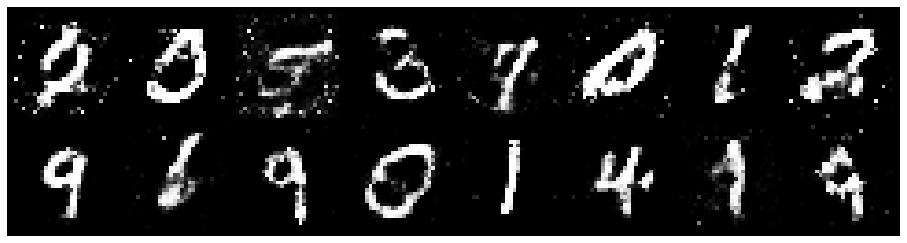

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.1289, Generator Loss: 0.9525
D(x): 0.6404, D(G(z)): 0.4339


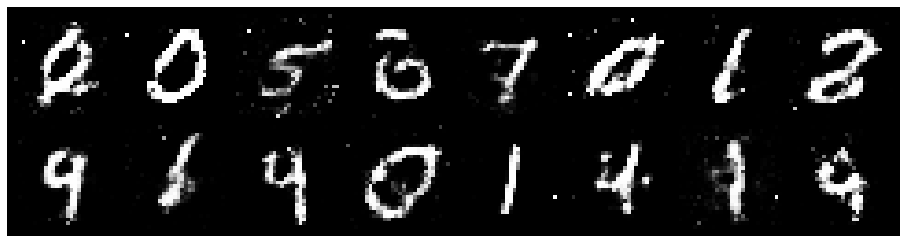

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1817, Generator Loss: 1.0360
D(x): 0.5893, D(G(z)): 0.4071


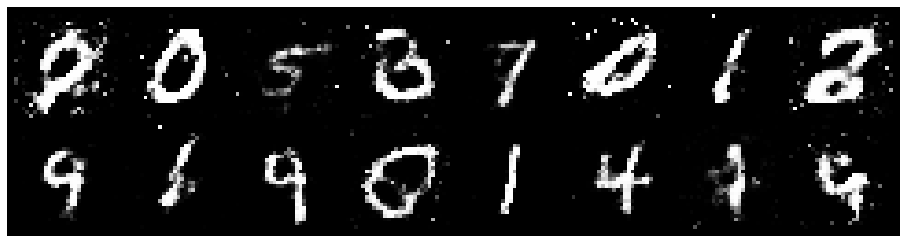

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2038, Generator Loss: 0.9795
D(x): 0.6248, D(G(z)): 0.4691


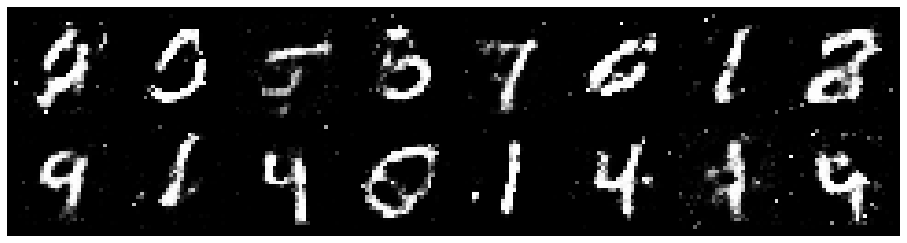

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.0918, Generator Loss: 1.1970
D(x): 0.6664, D(G(z)): 0.4120


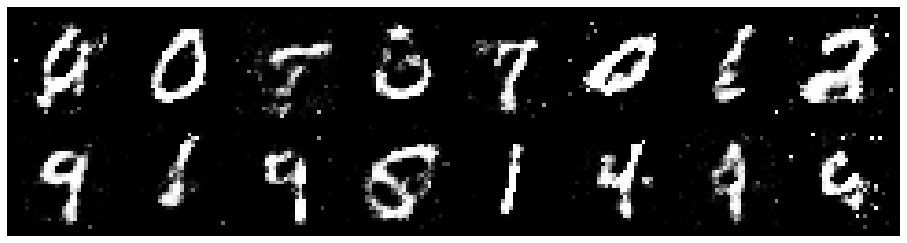

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.1457, Generator Loss: 1.3463
D(x): 0.5834, D(G(z)): 0.3721


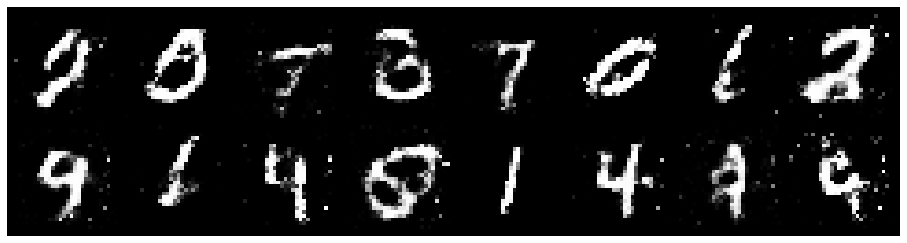

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.0963, Generator Loss: 1.1039
D(x): 0.6170, D(G(z)): 0.3918


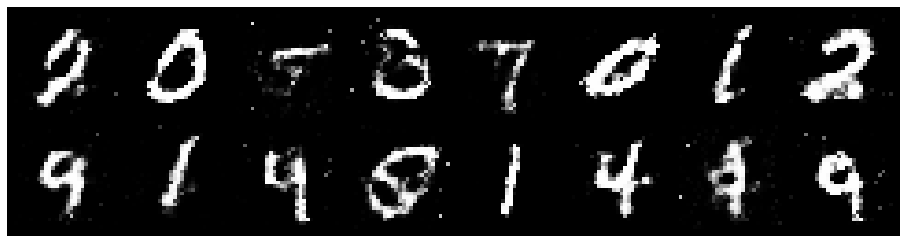

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.1044, Generator Loss: 1.0304
D(x): 0.6229, D(G(z)): 0.3977


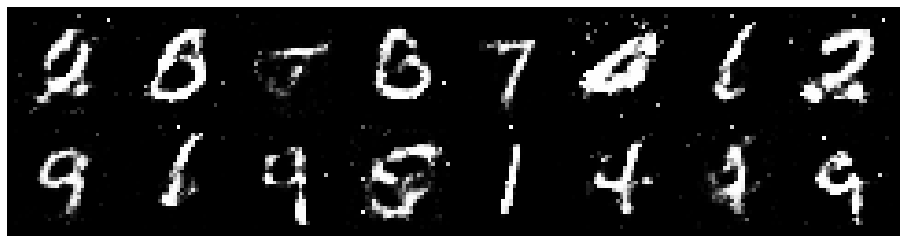

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.3061, Generator Loss: 0.9785
D(x): 0.6417, D(G(z)): 0.4794


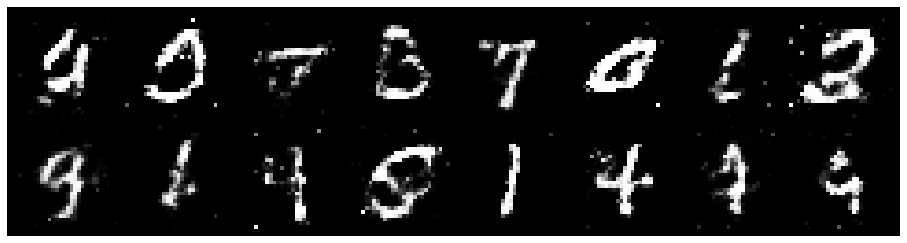

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.3936, Generator Loss: 0.8863
D(x): 0.5516, D(G(z)): 0.4360


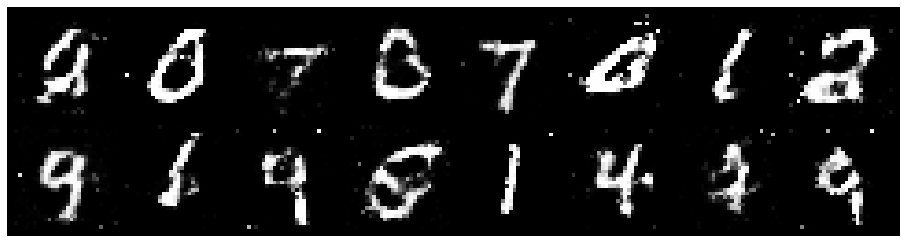

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1771, Generator Loss: 1.0995
D(x): 0.5896, D(G(z)): 0.3624


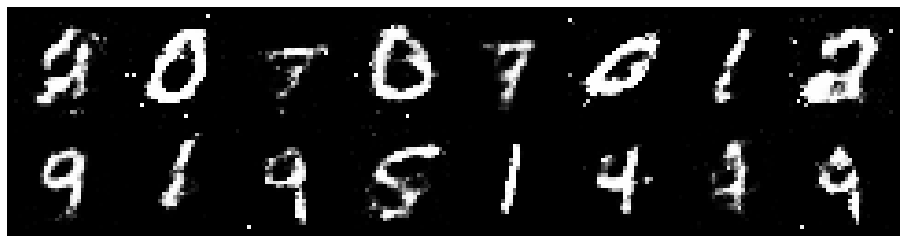

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.1980, Generator Loss: 0.9876
D(x): 0.5745, D(G(z)): 0.4139


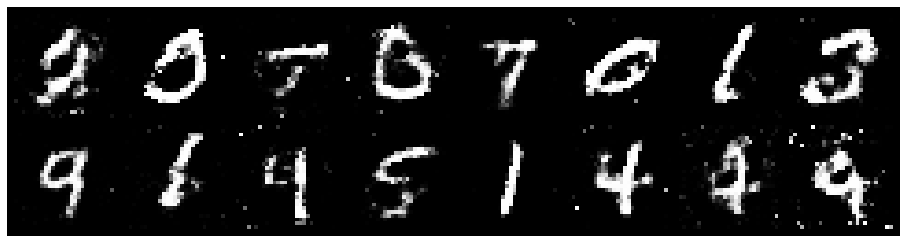

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.2764, Generator Loss: 0.9415
D(x): 0.5944, D(G(z)): 0.4615


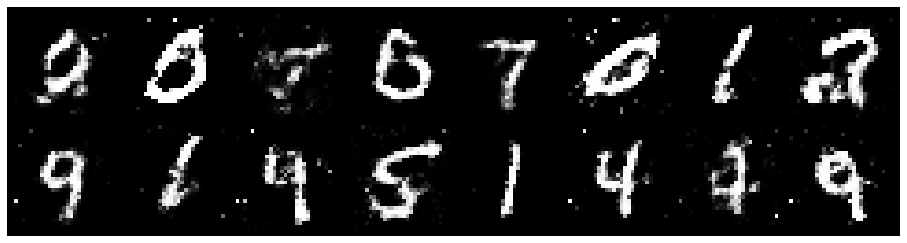

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1675, Generator Loss: 1.0223
D(x): 0.5820, D(G(z)): 0.3999


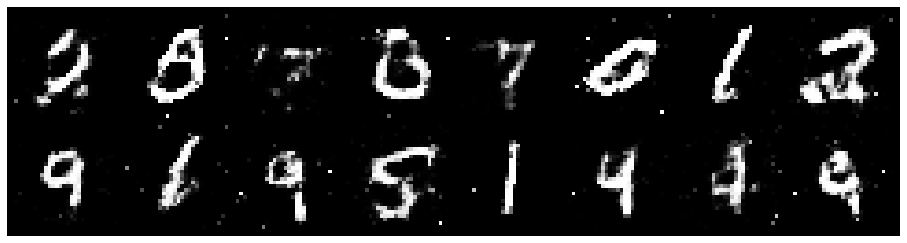

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2712, Generator Loss: 1.0464
D(x): 0.5899, D(G(z)): 0.4548


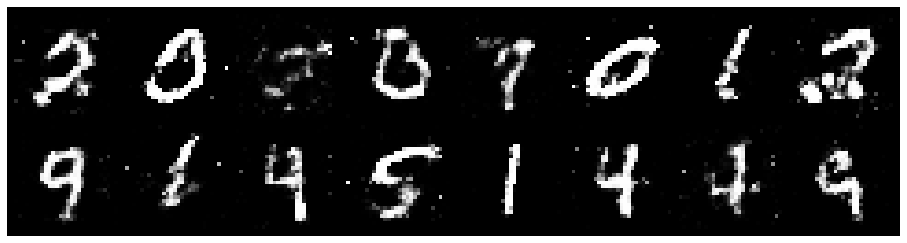

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1459, Generator Loss: 1.0330
D(x): 0.6556, D(G(z)): 0.4312


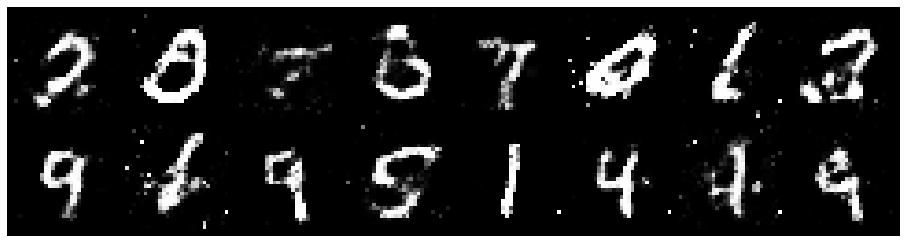

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.1985, Generator Loss: 1.3145
D(x): 0.6213, D(G(z)): 0.4129


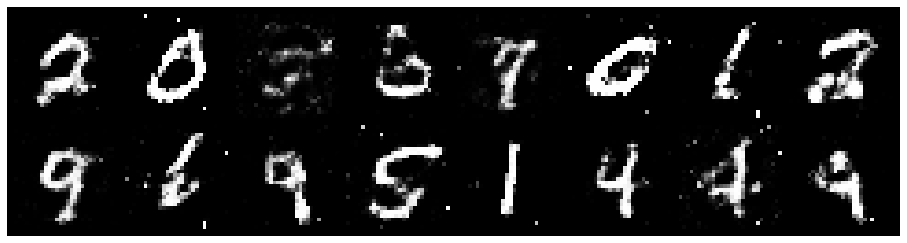

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 0.9706, Generator Loss: 1.1568
D(x): 0.6297, D(G(z)): 0.3312


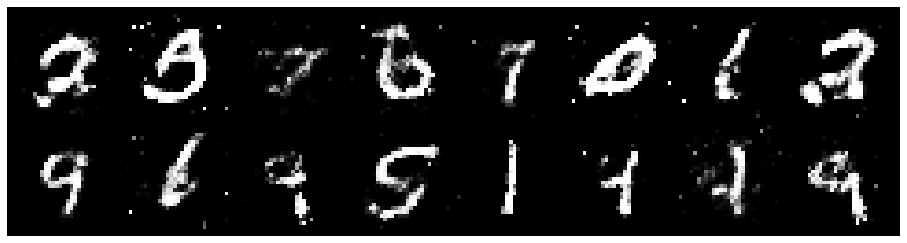

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.1534, Generator Loss: 1.0641
D(x): 0.6231, D(G(z)): 0.4356


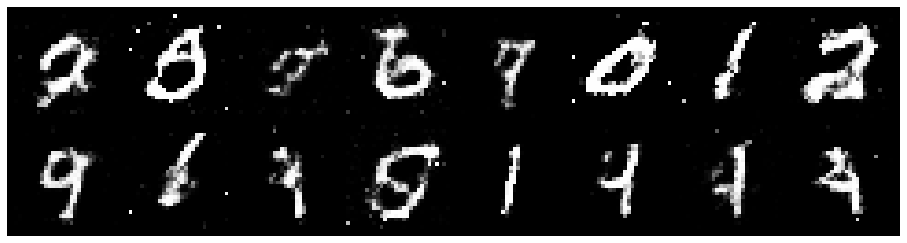

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.1078, Generator Loss: 1.1104
D(x): 0.6141, D(G(z)): 0.3876


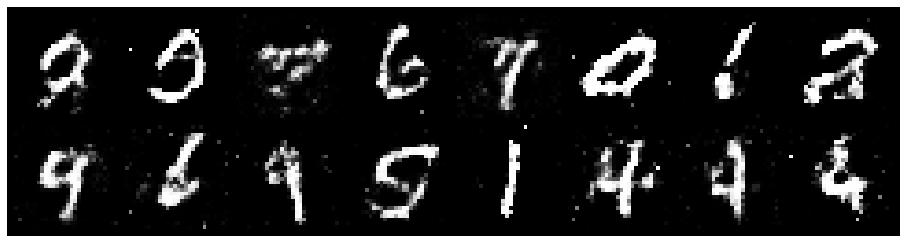

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.3003, Generator Loss: 0.9135
D(x): 0.5916, D(G(z)): 0.4526


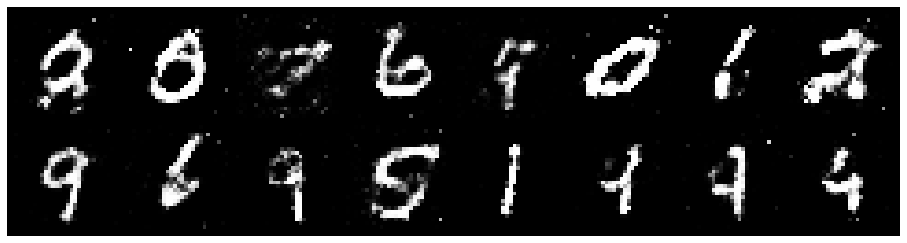

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.1141, Generator Loss: 1.1319
D(x): 0.6217, D(G(z)): 0.3713


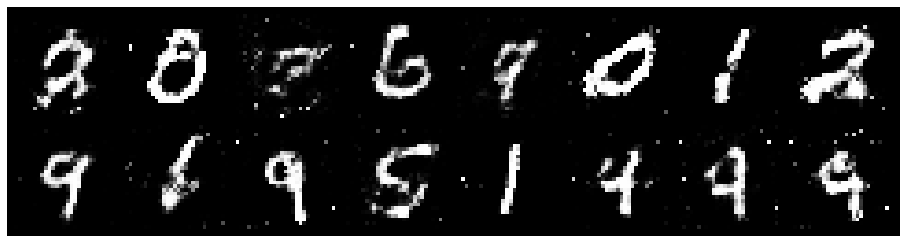

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.0659, Generator Loss: 1.4401
D(x): 0.5907, D(G(z)): 0.3005


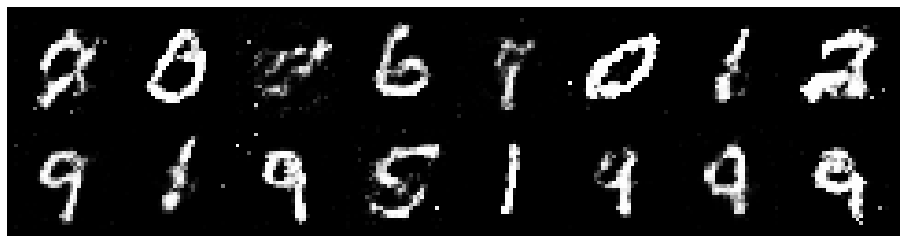

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.2765, Generator Loss: 1.0393
D(x): 0.5565, D(G(z)): 0.4058


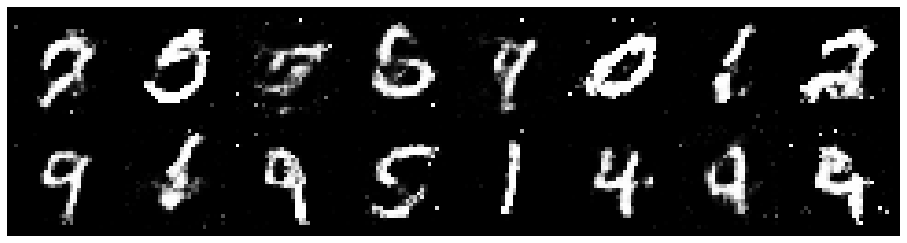

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.1698, Generator Loss: 0.8784
D(x): 0.6852, D(G(z)): 0.4644


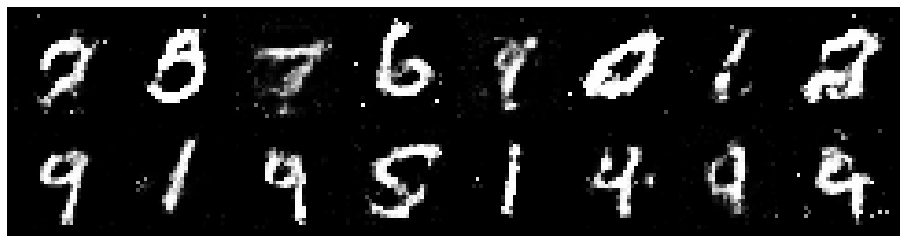

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.2574, Generator Loss: 1.0359
D(x): 0.5860, D(G(z)): 0.3870


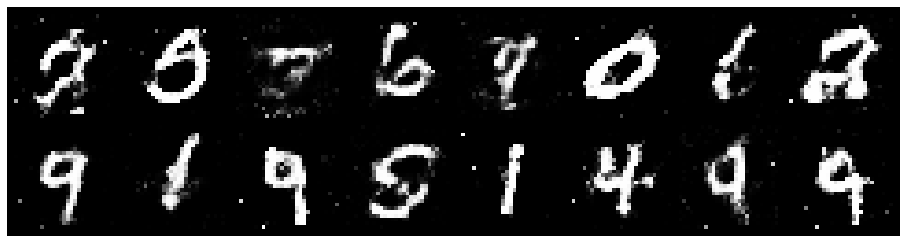

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.3117, Generator Loss: 0.8486
D(x): 0.5940, D(G(z)): 0.4775


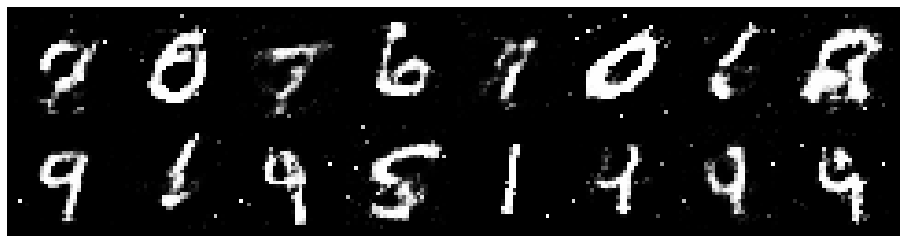

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.2000, Generator Loss: 1.2701
D(x): 0.5537, D(G(z)): 0.3487


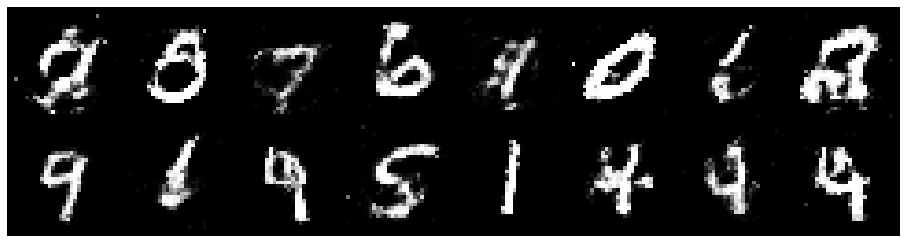

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.3158, Generator Loss: 0.8570
D(x): 0.5895, D(G(z)): 0.4854


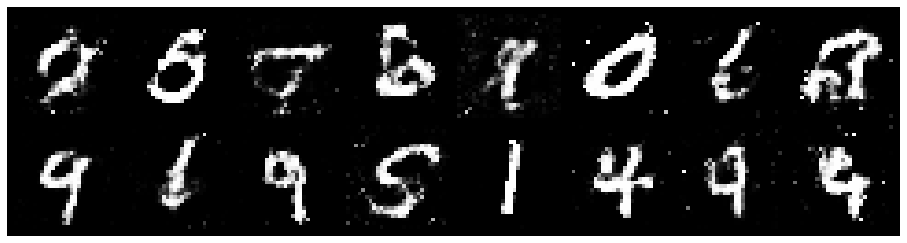

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.2932, Generator Loss: 0.9033
D(x): 0.5257, D(G(z)): 0.4418


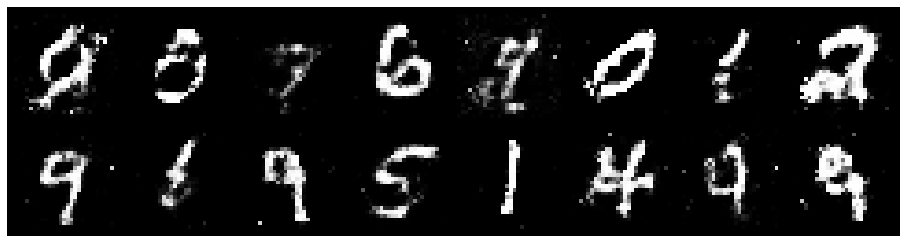

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.2214, Generator Loss: 0.8726
D(x): 0.5896, D(G(z)): 0.4525


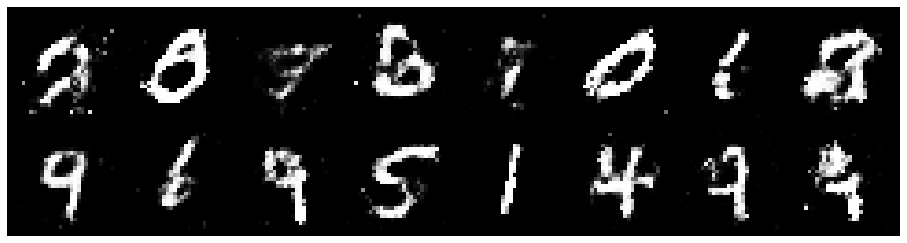

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1260, Generator Loss: 0.9872
D(x): 0.6040, D(G(z)): 0.4051


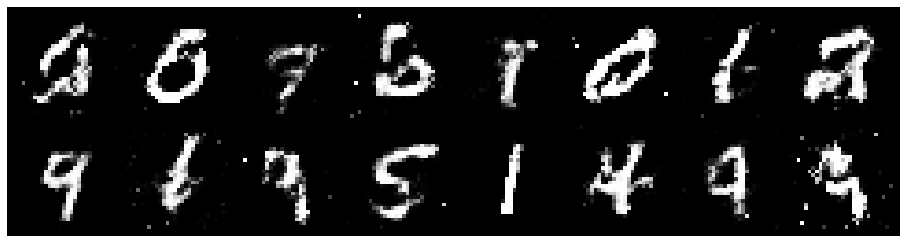

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1374, Generator Loss: 1.0804
D(x): 0.6307, D(G(z)): 0.4173


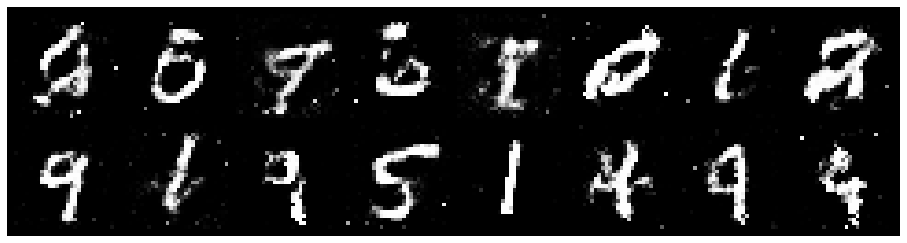

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2271, Generator Loss: 0.8838
D(x): 0.5669, D(G(z)): 0.4225


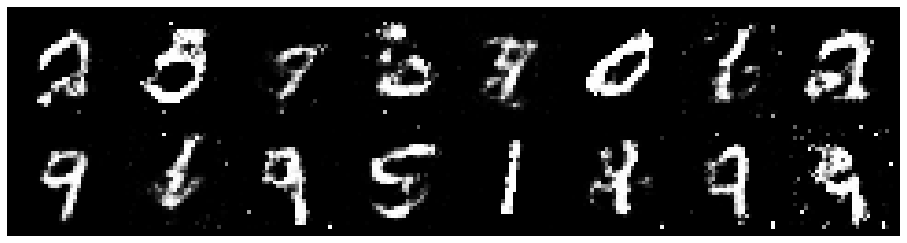

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.2374, Generator Loss: 0.9712
D(x): 0.5900, D(G(z)): 0.4444


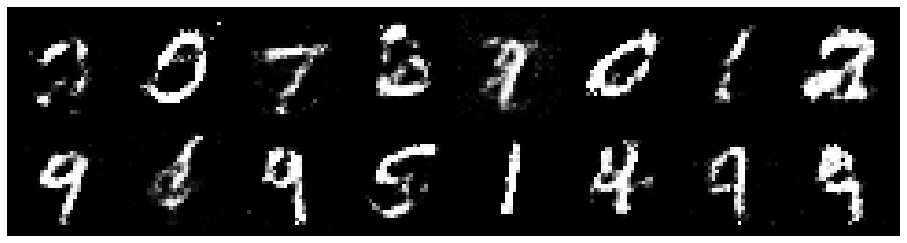

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0643, Generator Loss: 0.9672
D(x): 0.6194, D(G(z)): 0.3891


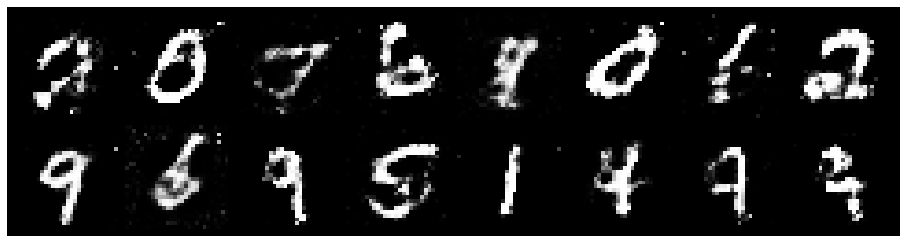

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.3458, Generator Loss: 1.0221
D(x): 0.5086, D(G(z)): 0.4047


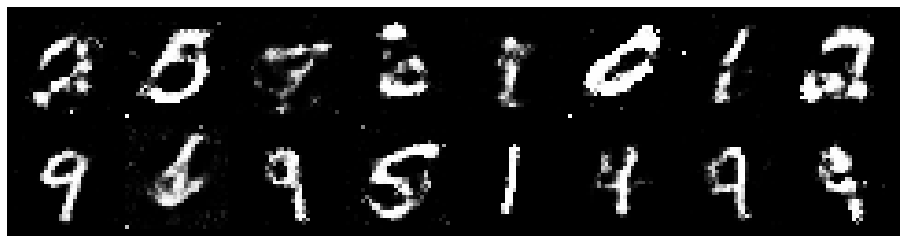

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.2107, Generator Loss: 1.0002
D(x): 0.5836, D(G(z)): 0.4288


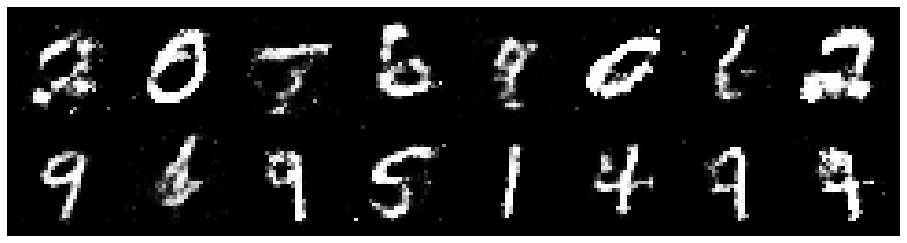

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2118, Generator Loss: 0.8600
D(x): 0.5544, D(G(z)): 0.4176


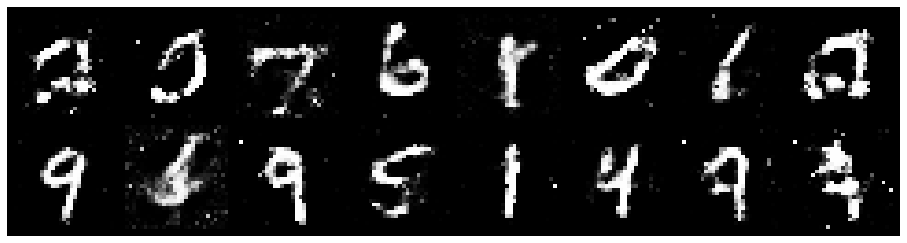

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.1897, Generator Loss: 0.8307
D(x): 0.6155, D(G(z)): 0.4610


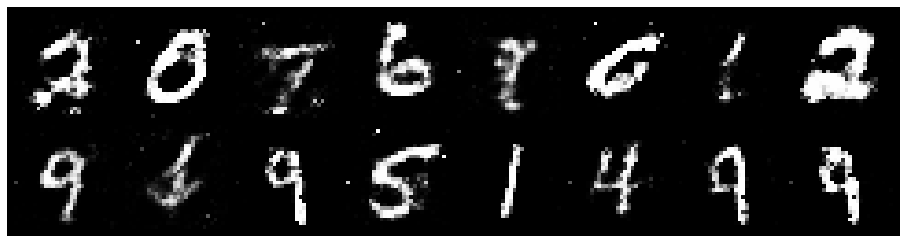

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.2225, Generator Loss: 0.9226
D(x): 0.5629, D(G(z)): 0.4216


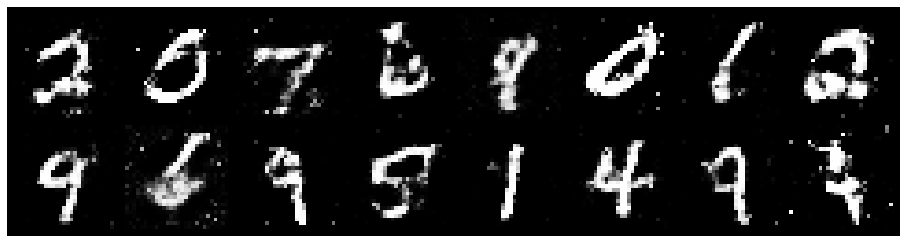

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.2084, Generator Loss: 0.9720
D(x): 0.5745, D(G(z)): 0.4255


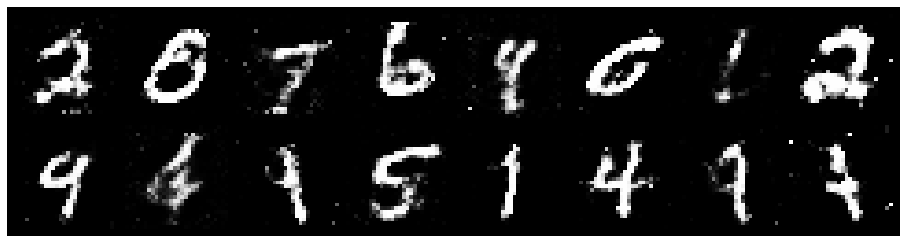

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.1161, Generator Loss: 0.9339
D(x): 0.6044, D(G(z)): 0.4026


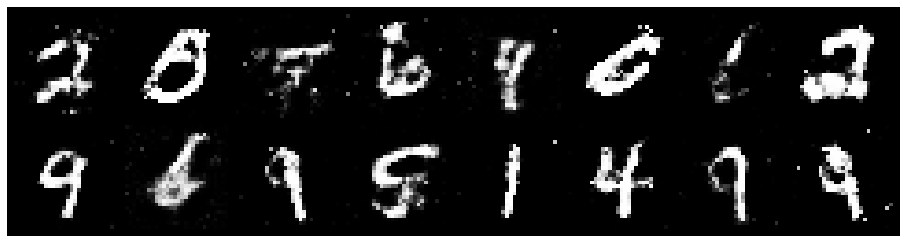

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2234, Generator Loss: 1.0850
D(x): 0.6021, D(G(z)): 0.4370


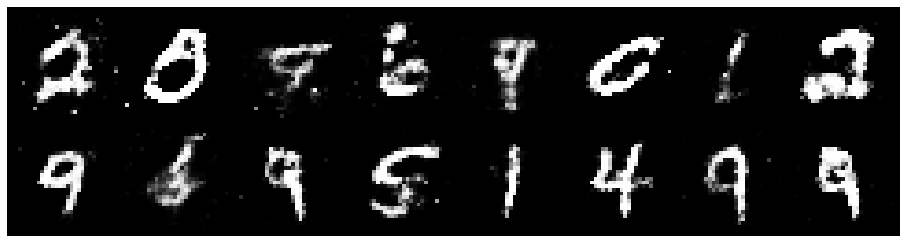

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.2215, Generator Loss: 1.0084
D(x): 0.5377, D(G(z)): 0.4005


KeyboardInterrupt: 

In [24]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')

# Total number of epochs to train
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()  # .detach() prevents backpropagation to whatever .detach() was called on...
        # Train D
        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            )
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )